# **Classification of Birds based on audio of their call**

# § I: Introduction

Bird species classification based on audio recordings has significant implications for ecological monitoring, biodiversity studies, and conservation efforts, as well as being applicable and interesting to a population of bird watchers and nature lovers. This project focuses on developing a robust machine learning pipeline capable of identifying bird species from basic metadata recordable by a smartphone. By leveraging audio signal processing techniques and modern classification algorithms, the project aims to create a reliable and scalable solution for bird call recognition.

## A. Overview of project goals

The primary objectives of this project are:

### 1. Data Cleaning and Integration:
Analyze problems with the audio files and reduces those problems with techniques for noise reduction, and compare how a data preprocessing step effects the success of different classification models.
### 2. Feature Engineering:
Extract meaningful features from raw audio signals, including frequency-domain representations, time-frequency representations, and repcrocess the signal to make the target sound the loudest part of the signal.
### 3. Model Training and Evaluation:
Train and compare multiple classification models, including neural networks and traditional classification algorithms, to identify the most effective approach for bird call classification.
### 4. Practical Application:
Build a functional tool capable of processing new audio files to classify bird species throughout an audio file.

# § II. Data Preperation and Exploration

## A. Initial Setup

### 1. Building Virtual Enviroment
The first step was to establish a virtual enviroment with the required libraries. A virtual environment was created with `micromamba`  to ensure that all dependencies, libraries, and tools used in the project are isolated from the host system. This approach prevents version conflicts and facilitates seamless collaboration and deployment.

```bash
micromamba create ./.conda pandas numpy scipy ipython scikit-learn matplotlib pydub ffmpeg cupy
```

### 2. Importing Libraries
From these libraries, and from some of the standard library we can now import the specific parts of the library that we need for this project.

In [2]:
# Standard Library
import time
import os
import sys
import re
import warnings
import gc
import pickle
from datetime import datetime
from typing import Generator, Optional, Callable, Tuple, Literal, List
from contextlib import contextmanager
from functools import lru_cache

# Disable only FutureWarnings - they are annoying
warnings.simplefilter(action='ignore', category=FutureWarning)

# Anaconda Libraries
import pandas as pd
import numpy as np
import scipy as sp
from IPython.display import display, HTML, DisplayHandle
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.neural_network import MLPClassifier
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Third Party Libraries
import cupy as cp
import cupyx as cpx
import cupyx.scipy.fft as cufft
import cupyx.scipy.signal as cusig
from pydub import AudioSegment
from pydub.utils import mediainfo

OutOfMemoryError = cp.cuda.memory.OutOfMemoryError

#### a) Overview of Libraries and their purposes

##### (i) `pydub`
`pydub` is a library used for simple processing of audio files. It provides a simple means for decoding mp3 files in python, and manipulating the audio data in a relatively basic way. `pydub` provides the ability to split up audio files as if they were python lists where the index of the list is the number of miliseconds from the begining of the file. With the addition of another library called `simpleaudio`, audio can be played directly with python, but for this project all audio files will exported and displayed with html in markdown cells. Below are basic examples of what working with audio in pydub looks like:
```python
# loads audio file
sound = AudioSegment.from_file(filename, format='wav')

# cuts the sound to only the first second of the file
sound = sound[:1000]

# returns the signal array for more nuanced signal manipulation
signal = sound.get_array_of_samples()

# returns a list of mono sounds for each channel in the audio file
sounds = sound.split_to_mono()
```
Metadata of audio files is also accessed with pydub either through the `pydub.AudioSegment` object or through the `pydub.utils.mediainfo` function.
```python
# the length of the audio file in miliseconds
len(sound)

# the sample rate of the audio file
sound.frame_rate

# the number of channels in the audio file
sound.channels

# returns the name of the format used to store the audio file
mediainfo(filename)['format_name']

# returns the sample format, needed to get the bit depth of the file
mediainfo(filename)['sample_fmt']
```


##### (ii) `ffmpeg`
`ffmpeg` is a powerful tool for handling a wide variety of media formats, including audio and video. Within this environment, `ffmpeg` serves as the backend for `pydub` to decode `.mp3` files. By default, when an `.mp3` file is loaded using `pydub`, `ffmpeg` is called automatically to handle the decoding. This integration ensures that the project can work seamlessly with compressed audio formats like `.mp3`.
```python
# decodes codec with ffmpeg and returns the AudioSegment object as normal
sound = AudioSegment.from_file(filename, format='mp3')
```

##### (iii) `cupy`
`cupy` is a GPU-accelerated library that provides a **drop-in replacement** for the `numpy` and `scipy` libraries, leveraging NVIDIA's CUDA toolkit for GPU-accelerated parallel processing. This allows for significant performance improvements when performing computationally intensive tasks, such as Fourier transformations, matrix operations, and large-scale data manipulations.

In this project, `cupy` was particularly useful for processing large audio datasets and accelerating tasks like feature extraction and data preprocessing via signal transformations, where CPU-based computation would be too slow.
```python
import cupy as cp

# Create a large random array on the GPU
gpu_array = cp.random.rand(1000000)

# Perform fast computations on the GPU
mean_value = cp.mean(gpu_array)
```
Arrays in `cupy` match the syntax of `numpy.ndarray` objects and `scipy` methods can be called via the `cupyx.scipy` library.

**CUDA-Specific Features**

While `cupy` emulates `numpy` and `scipy` functionality, it also offers CUDA-specific tools to optimize memory and computation. These are critical for managing GPU resources efficiently when working with large datasets or computationally intensive tasks.

 - **Device Management:** `cupy` supports multi-GPU setups and allows explicit control over which GPU device is used:

In [3]:
gpu = cp.cuda.Device(0)  # Access the first GPU
gpu.use()  # Set it as the active GPU

<CUDA Device 0>

 - **Memory Management**: Memory allocation and deallocation are handled through memory pools to reduce overhead during GPU memory operations. The default memory pool can be configured to limit VRAM usage:

In [4]:
# Set the memory pool limit to 75% of the total VRAM
vram_pool = cp.get_default_memory_pool()
pinned_vram_pool = cp.get_default_pinned_memory_pool()
with gpu:
    vram_pool.set_limit(fraction=0.75)

# Clear the memory pool
vram_pool.free_all_blocks()
pinned_vram_pool.free_all_blocks()

# clear the fft plan cache
cp.fft.config.clear_plan_cache()

def clear_gpu_memory() -> None:
    """Clear the GPU memory pool and the pinned memory pool, and clear the FFT plan cache."""
    gc.collect() # Force garbage collection
    vram_pool.free_all_blocks() # Free all memory blocks in the GPU memory pool
    pinned_vram_pool.free_all_blocks() # Free all memory blocks in the pinned memory pool
    cp.fft.config.clear_plan_cache() # Clear the FFT plan cache

Manually allocating memory like this helps ensure explicit memory errors occur and stop the program speeding up debugging. `cupy` will run without manual allocation of ram it is just more likely to have problems related to memory overflow without explcitly explaining the cause of the progam error, and memory managment is not managed well by the native python garbage collector in cupy so the use of the `clear_gpu_memory` function will become more nessicary for some complex functions.

 - **FFT Plans with `cupy.cuda.cufft`:** `cupy` provides access to CUDA's FFT library (`cuFFT`), which allows for pre-planning and optimizing FFT operations. Each FFT plan is formed based on the shape of the input array. To improve performance an prevent recalculating FFT plans, the resulting FFT plan is automatically cached in the default memory pool. To perform an FFT without caching the FFT plan, you can manually create a plan and pass the plan into the FFT, or you can clear the cache of the FFT plan whenever you like with a simple syntax.
```python
with cufft.get_fft_plan(signal, value_type='R2C'):  # Create FFT plan and pass into FFT function
    gpu_fft = cufft.rfft(signal, overwrite_x=True)  # This does not cache FFT plan

# or clear the cache at any point
cp.fft.config.clear_plan_cache()
```


### 3. Establishing Utility Functions

#### a) Simple Aliases

In [5]:
MAX_AMPLITUDE_AT_16_BIT = 32767 # The maximum amplitude for a 16-bit audio signal

def load_sound_file(file: str) -> Optional[AudioSegment]:
    """Method for loading an audio file and ensuring that the correct format is used to decode the file.

    Args:
        file (str): The path to the file to be loaded
    
    Returns:
       Optional[AudioSegment]: The audio file as an AudioSegment object, or None if an error occurs while loading the file.
    """
    try:
        return AudioSegment.from_file(file, format=mediainfo(file)['format_name'])
    except: # If the file cannot be loaded, print an error message and return None
        print(f"Error loading file {file}")
        print(f'Format: {mediainfo(file)["format_name"]}')
        return None

Believe it or not, sometimes the filename ends in `.mp3` but the actual internal format is used is that of a `.wav` file. In those cases `mediainfo(file)['format_name']` will return the actual internal format. 

In [6]:
def print_boundry(message: str="") -> None:
    """Print a message surrounded by a line of dashes with a total length of 100 characters
    
    Args:
        message (str, optional): The message to be printed. Prints an empty line if no message is provided.
    """
    length = (100 - len(message)) // 2
    print('-' * length, message, '-' * length)

In [7]:
# Type Aliases
ndarray = np.ndarray | cp.ndarray
number = int | float

#### b) Data Conversions

In [8]:
def percentage_color_conversion(input_value: number, input_min: int=0, input_max: int=100, output_min: int=0, output_max: int=110) -> float:
    """Convert a percentage value to a color in the range of red to green.
    The input value is mapped to a non-linear scale to create a more pronounced color change effect.
    The output value is in the range of 0 to 110, which corresponds to the hue values in an HSV color space for red to green.

    Args:
        input_value (int | float): The value to be converted.
        input_min (int, optional): The minimum value of the input range. Defaults to 0.
        input_max (int, optional): The maximum value of the input range. Defaults to 100.
        output_min (int, optional): The minimum value of the output range. Defaults to 0.
        output_max (int, optional): The maximum value of the output range. Defaults to 110.

    Returns:
        float: The converted value within the output range.
    """
    normalized_input = (input_value - input_min) / (input_max - input_min) # Normalize the input value to a range of 0 to 1
    scaled_value = (np.exp(normalized_input) - 1) / (np.e - 1) # Apply an exponential function to create a non-linear scale
    scaled_value = (np.exp(scaled_value) - 1) / (np.e - 1) # Repeat the function to create a more pronounced effect
    return output_min + scaled_value * (output_max - output_min) # Map the scaled value to the output range


def signal_to_audio(signal: ndarray, sample_rate: int=44100, denormalize: bool=False) -> AudioSegment:
    """Convert a signal array to an audio segment object.
    Will automatically convert cupy arrays to int16 numpy arrays if necessary.

    Args:
        signal (cp.ndarray | np.ndarray): The signal array to be converted.
        sample_rate (int, optional): The sample rate of the signal. Defaults to 44100.
        denormalize (bool, optional): Whether to denormalize the signal to the range of int16. Defaults to False.
    
    Returns:
        AudioSegment: The audio segment object created from the signal array.
    """
    if isinstance(signal, cp.ndarray): # If the signal is a cupy array, convert it to a numpy array
        signal = cp.asnumpy(signal)
    if denormalize: # If the signal should be denormalized, scale it to the range of int16
        signal = signal * MAX_AMPLITUDE_AT_16_BIT
    signal = signal.astype(np.int16) # Convert the signal to a 16-bit integer array
    return AudioSegment(signal.tobytes(), frame_rate=sample_rate, sample_width=signal.dtype.itemsize, channels=1) # Create an audio segment object from the signal array
    

#### c) Human Readable Conversion Functions

In [9]:
def bytes_to_human_readable(n: int, depth: int=2) -> str:
    """Convert a byte value into a human-readable string with appropriate units.

    Args:
        n (int): The number of bytes.
        depth (int, optional): The number of decimal places to include in the output. Default is 2.

    Returns:
        str: A string representing the byte value in a human-readable format with units (B, KB, MB, GB, TB, PB).
    """
    for unit in ['B', 'KB', 'MB', 'GB', 'TB']:
        if n < 1024:
            return f"{n:.{depth}f} {unit}"
        n /= 1024
    return f"{n:.{depth}f} PB"


def time_to_human_readable(seconds: number, depth: int=3) -> str:
    """Convert a time duration in seconds to a human-readable string format.

    Args:
        seconds (int|float): The time duration in seconds.
        depth (int): The level of detail for the output format. 
                    - 0 or 1: Returns seconds (with milliseconds if `seconds` is a float).
                    - 2: Returns minutes and seconds.
                    - 3: Returns hours, minutes, and seconds.

    Returns:
        str: The time duration in a human-readable string format.
    """
    if depth == 0 or depth == 1: # If the depth is 0 or 1, return the seconds with or without milliseconds
        if isinstance(seconds, int): # If the seconds is an integer, return the number of seconds in 'x seconds' format
            return f'{seconds} seconds'
        # If the seconds is a float, return the time in 'xx:xxx' format with seconds and milliseconds
        miliseconds = (seconds - int(seconds)) * 1000
        return f'{int(seconds):02}:{int(miliseconds):03}'
    
    if depth == 2: # If the depth is 2, return the time in 'xx:xx' format with minutes and seconds
        minutes, seconds = divmod(seconds, 60)
        return f'{int(minutes):02}:{int(seconds):02}'
    
    # If the depth anything other than 0, 1 or 2 return the time in 'xx:xx:xx' format with hours, minutes, and seconds
    hours, rem = divmod(seconds, 3600)
    minutes, seconds = divmod(rem, 60)
    return f'{int(hours):02}:{int(minutes):02}:{int(seconds):02}'


print(f'123456789 bytes is equal to {bytes_to_human_readable(123456789)}')
print(f'12345 seconds with a depth of 3 (default depth) is equal to {time_to_human_readable(12345)}')
print(f'12.345 seconds with a depth of 1 is equal to {time_to_human_readable(12.345, 1)}')


123456789 bytes is equal to 117.74 MB
12345 seconds with a depth of 3 (default depth) is equal to 03:25:45
12.345 seconds with a depth of 1 is equal to 12:345


#### c) Process Monitoring and Caching

##### (i) Normal, not insane functions

In [10]:
def memory_usage(df: pd.DataFrame) -> int:
    """Calculate the total memory usage of a pandas DataFrame.

    Args:
        df (pd.DataFrame): The DataFrame to calculate the memory usage of.

    Returns:
        int: The total memory usage of the DataFrame in bytes.
    """
    return df.memory_usage(deep=True).sum()


def print_memory_usage(df: pd.DataFrame) -> None:
    """Prints the memory usage of a given pandas DataFrame in a human-readable format.

    Args:
        df (pd.DataFrame): The DataFrame for which to calculate and print memory usage.
    """
    print(f"Memory Usage: {bytes_to_human_readable(memory_usage(df))}")

def calculate_time_remaining(start_time: float, iteration: int, length: int) -> str:
    """Estimates the time remaining for a process.

    Args:
        start_time (float): The start time of the process in seconds since the epoch (returned from `time.time()`).
        iteration (int): The current iteration number.
        length (int): The total number of iterations.

    Returns:
        str: The estimated time remaining in a human-readable format.
    """
    elapsed_time = time.time() - start_time
    iterations_remaining = length - iteration
    time_per_iteration = 0
    try:
        time_per_iteration = elapsed_time / iteration
    except ZeroDivisionError:
        pass # Ignore division by zero error from 0th iteration
    time_remaining = iterations_remaining * time_per_iteration
    time_remaining_str = time_to_human_readable(time_remaining)
    return time_remaining_str


def print_progress_bar(iteration: int, 
                       max_iteration: int, 
                       message: str='', 
                       display_handler: Optional[DisplayHandle]=None, 
                       treat_as_data: bool=False,
                       treat_as_time: bool=False
                       ) -> DisplayHandle:
    """Print a progress bar that updates in place.

    Args:
        iteration (int): Current iteration or progress value.
        max_iteration (int): Maximum iteration or maximum value for the progress.
        display_handler (DisplayHandle, optional): An existing display handler to update the progress bar. Defaults to None where a new display handler is generated. 
        message (str, optional): Additional message to display alongside the progress bar.
        treat_as_data (bool, optional): If True, converts iteration and length to human-readable data format. Defaults to False.

    Returns:
        DisplayHandle: The display handler used to render the progress bar.
                         - **In order to update the progress bar, pass this handler to the next call of this function.**
    
    Notes:
        This function is intended for use in Jupyter notebooks, and uses the IPython display module to render the progress bar as HTML.
        That HTML is rendered in place, allowing the progress bar to update in place.
    """
    progress = int((iteration / max_iteration) * 100) # Calculate progress as a whole number percentage

    if treat_as_data: # Convert the iteration and length to human-readable data format if specified
        iteration: str = bytes_to_human_readable(iteration)
        max_iteration: str = bytes_to_human_readable(max_iteration)
    if treat_as_time: # Convert the iteration and length to human-readable time format if specified
        iteration: str = time_to_human_readable(iteration)
        max_iteration: str = time_to_human_readable(max_iteration)

    # Get the color for the progress bar based on the percentage value using css hsl color format
    color = f'hsl({percentage_color_conversion(progress)}, 100%, 50%)'
    # Create the progress bar as a string of equal signs with the appropriate color
    # This is formatted in html to allow for color styling
    bar = f'<span style="color: {color};">{"=" * progress}</span>{" " * (100 - progress)}'
    style = 'font-family: monospace; font-size: 13px;' # Ensure monospacing for consistent character width
    # Create the message to display text in html format
    html_string = f'<pre style="{style}">[{bar}] - {iteration}/{max_iteration}'
    if message: # Add the message to the html string if provided
        html_string += f' - {message}'
    html_string += '</pre>'

    # display the message as HTML, updating the display handler if provided
    if not display_handler:
        display_handler = display(HTML(html_string), display_id=True)
    else:
        display_handler.update(HTML(html_string))
    return display_handler # Return the display handler for updating the progress bar

The `print_progress_bar` is not the simplest design for what that is, and there is no reason for it to be rendered in html except that it allows for a smoother gradient of color, and organizing it like this allows its output to be seperated from other prints in output cells in jupyter notebook. The main reason for this was to integrate easier when overriding the standard IO later in the project.

In [11]:
display_handler = None
for i in range(10):
    time.sleep(0.1)
    display_handler = print_progress_bar(i+1, 10, message=f'Progress: {i+1}%', display_handler=display_handler)
del display_handler

##### (ii) Insane ideas that worked better than expected

The following script is used exclusively to replace the "verbose" form of the training phase of a `sklearn.neural_network.MLPClassifier`. Below is an in depth description of what is going on so it is clear how this works but this is entirely a means of monitoring the training process of a `sklearn.neural_network.MLPClassifier` object. This section can be skipped if that is not important to you.

In [12]:
class MLPTrainingMonitor:
    """A class to monitor and reformat training output for `sklearn.neural_network.MLPClassifier`.

    This class overrides the standard output stream to intercept and process verbose messages from the MLPClassifier 
    during training. It parses these messages to display a real-time progress bar, provide an estimate of the remaining 
    training time, and optionally save or load training metadata for later use.

    The key use case is to provide a cleaner, more informative visualization of the training process than the default 
    output from `sklearn.neural_network.MLPClassifier`.

    Methods:
    --------
    ```python
    monitor_engine() -> None
    setup_training(max_iterations: int, learning_rate: float) -> None
    end_training(path: str) -> None
    display_training(path: str) -> None
    training_simulator(iterations: int) -> None
    ```
    
    Example Usage:
    --------------
    ```python
    nn = sklearn.neural_network.MLPClassifier(max_iter=100,
                                              verbose=True,
                                              hidden_layer_sizes=[100, 10],
                                              learning_rate_init=0.01,
                                              learning_rate='adaptive')

    with MLPTrainingMonitor.monitor_engine():
        MLPTrainingMonitor.setup_training(max_iterations=100, learning_rate=0.01)
        nn.fit(X_train, y_train)
        MLPTrainingMonitor.end_training(path='path/to/save')
    ```
    """
    def __init__(self) -> None:
        self._start_time = None
        self._max_iterations = 0
        self._iteration = 0
        self._loss = 0
        self._learning_rate = 0
        self._min_loss = 10000
        self._iterations_since_minimum = 0
        self._display_handler = None


    def flush(self) -> None:
        """Required method for the stream class, but not used in this implementation."""
        pass


    def write(self, text: str) -> None:
        """Parse and process the text output from the MLPClassifier during training.
        This method gets called in place of the standard print() function when the monitor is active.

        Args:
            text (str): The text output from the MLPClassifier during training.
        """
        # Check the text for specific keywords that indicate the type of message
        if 'SETUP:' in text:
            self._setup(text)
            return
        elif 'FINISH:' in text:
            self._finish(text)
            return
        elif 'DISPLAY:' in text:
            self._display(text)
            return
        
        # If the text does not contain a keyword, check for specific messages that contain data to be extracted
        elif 'Iteration' in text:
            self._iteration = int(text.split(' ')[1][:-1])
            self._loss = float(text.split('loss =')[1].strip())
            if self._min_loss > self._loss: # Check if the current loss is the minimum loss seen so far
                self._min_loss = self._loss
                self._iterations_since_minimum = 0
            else: # If the loss is not the minimum, increment the counter
                self._iterations_since_minimum += 1
        elif 'learning rate' in text: # If the text does not contain Iteration, check for the learning rate setting message
            self._learning_rate = float(text.split('Setting learning rate to ')[1].strip())
        else: # If the text does not contain any relevant information, return early
            return
        
        # Create a message to display the current progress and training information
        message = f'\nLoss: {self._loss:.6f}'
        message += f' - Min Loss: {self._min_loss:.6f}'
        message += f' - Iterations Since Minimum: {self._iterations_since_minimum}'
        message += f' - Learning Rate: {self._learning_rate:.6f}'
        message += f' - Estimated Time Remaining: {calculate_time_remaining(self._start_time, self._iteration, self._max_iterations)}'
        # Update the progress bar with the current iteration and message
        self._display_handler = print_progress_bar(self._iteration, 
                                                  self._max_iterations,
                                                  display_handler=self._display_handler,
                                                  message=message)
    

    def _setup(self, text: str) -> None:
        """Parses setup information and initializes monitoring attributes.

        Args:
            text (str): The setup message, expected to include maximum iterations and initial learning rate.
             - Input Example: 'SETUP: 100 0.01'
        """
        self.__init__() # Reset the attributes to their default values
        # Extract the start time and setup information from the text
        self._start_time = time.time()
        self._max_iterations = int(text.split(' ')[1].strip())
        self._learning_rate = float(text.split(' ')[2].strip())
    

    def _finish(self, text: str) -> None:
        """Handles the end of training, calculates total time, and saves results.

        Args:
            text (str): The finish message, expected to include the path to save the training monitor data.
             - Input Example: 'FINISH: /path/to/save'
        """
        time_taken = time.time() - self._start_time # Calculate the time taken to complete the training process
        # Create a message to display the final results of the training process
        message = f'Loss: {self._loss:.6f}'
        message += f' - Min Loss: {self._min_loss:.6f}'
        message += f' - Final Iteration: {self._iteration}'
        message += f' - Learning Rate: {self._learning_rate}'
        message += f' - Time to complete: {time_to_human_readable(time_taken)}'
        # Update the display with the final results
        self._display_handler.update(HTML(f'<pre style="font-family: monospace; font-size: 13px;">{message}</pre>'))

        # Save the training monitor data to a csv file
        path = text.split(' ')[1].strip()
        columns = ['loss', 'min_loss', 'final_iteration', 'learning_rate', 'time_taken']
        data = [[self._loss, self._min_loss, self._iteration, self._learning_rate, time_taken]]
        df = pd.DataFrame(data, columns=columns)
        path += '/training_monitor.csv'
        df.to_csv(path, index=False)
    

    def _display(self, text: str) -> None:
        """Displays the training information from a saved csv file.

        Args:
            text (str): The display message, expected to include the path to load the training monitor data.
             - Input Example: 'DISPLAY: /path/to/load'
        """
        df = pd.read_csv(text.split(' ')[1].strip() + '/training_monitor.csv') # Load the training monitor data from the csv file
        accuracy_score = ''
        with open(text.split(' ')[1].strip() + '/accuracy.txt', 'r') as file:
            accuracy_score = file.readline()
        # Extract the training information from the data frame
        self._loss = df.loss.values[0]
        self._min_loss = df.min_loss.values[0]
        final_iteration = df.final_iteration.values[0]
        self._learning_rate = df.learning_rate.values[0]
        time_taken = df.time_taken.values[0]
        # Create a message to display the training information
        message = f'Loss: {self._loss:.6f}'
        message += f' - Min Loss: {self._min_loss:.6f}'
        message += f' - Final Iteration: {final_iteration}'
        message += f' - Learning Rate: {self._learning_rate}'
        message += f' - Time to complete: {time_to_human_readable(time_taken)}'
        message += f'\n{accuracy_score}'
        # Display the training information
        if self._display_handler is None:
            self._display_handler = display(HTML(f'<pre style="font-family: monospace; font-size: 13px;">{message}</pre>'))
        else:
            self._display_handler = self._display_handler.update(HTML(f'<pre style="font-family: monospace; font-size: 13px;">{message}</pre>'))
        return


    @staticmethod
    def training_simulator(iterations: int=100) -> None:
        """Simulates the output of the training process for testing purposes.
        
        Args:
            iterations (int, optional): The number of iterations to simulate. Defaults to 100.
        """
        for i in range(iterations):
            time.sleep(0.1)
            print(f'Iteration {i + 1}, loss = {np.random.uniform(0, 1):.4f}', flush=True)


    @staticmethod
    def setup_training(max_iterations: int, learning_rate: float) -> None:
        """Sends the setup message to the monitor to initialize the training process.
        
        Args:
            max_iterations (int): The maximum number of iterations for the training process.
            learning_rate (float): The initial learning rate for the training process.
        """
        print(f'SETUP: {max_iterations} {learning_rate}')


    @staticmethod
    def end_training(path: str) -> None:
        """Sends a finish message to save training results.
        
        Args:
            path (str): The path of the ***directory*** to put the `training_monitor.csv` file.
        """
        print(f'FINISH: {path}')


    @staticmethod
    def display_training(path: str) -> None:
        """Loads and displays training results from a previous session.
        
        Args:
            path (str): The path of the ***directory*** containing the `training_monitor.csv` file.
        """
        print(f'DISPLAY: {path}')


    @classmethod
    @contextmanager # The contextmanager decorator allows the class method to be used in a 'with' statement
    def monitor_engine(cls) -> Generator[None, None, None]:
        """A context manager to activate the training monitor.

        Replaces the standard output stream with an instance of this class, allowing all printed messages 
        within the `with` block to be intercepted and processed.
        
        Example Usage:
        --------------
        ```python
        nn = sklearn.neural_network.MLPClassifier(max_iter=100,
                                                  verbose=True,
                                                  hidden_layer_sizes=[100, 10],
                                                  learning_rate_init=0.01,
                                                  learning_rate='adaptive')
        
        with MLPTrainingMonitor.monitor_engine():
            MLPTrainingMonitor.setup_training(max_iterations=100, learning_rate=0.01)
            nn.fit(X_train, y_train)
            MLPTrainingMonitor.end_training(path='path/to/save')
        ```
        """
        #----From here on gets run before the code inside the with statement
        original_stdout = sys.stdout # Save the original standard output stream
        sys.stdout = cls() # Replace the standard output stream with an instance of this class
        try:
            yield # Yeild control back to the with statement

        #----From here on gets run after the code inside the with statement
        finally:
            sys.stdout = original_stdout # Restore the original standard output stream


This is a complicated class that allows for one simple thing: to reformat the verbose message in the `sklearn.neural_network.MLPClassifier` training function. By default the MLPClassifier prints messages that look something like the result of this method:

In [13]:
MLPTrainingMonitor.training_simulator(5)

Iteration 1, loss = 0.0511
Iteration 2, loss = 0.0374
Iteration 3, loss = 0.6194
Iteration 4, loss = 0.7682
Iteration 5, loss = 0.1480


In this case the loss is randomized but in the actual training the loss should steadily decline, and if it does not decline in 10 iterations it will adjust the learning rate to compensate. This class will watch everything sent to the standard output and will update a progress bar with the relevant information in a clean way with an estimation on time remaining. The main motivation for this function was to be able to estimate the time to train a model before it finished.

The usage of this class is quite simple. The main magic is behind the `MLPTrainingMonitor.monitor_engine` class method. It is designed to be used in a with statement like this:
```python
with MLPTrainingMonitor.monitor_engine():
    # Anything printed here will be processed by the MLPTrainingMonitor.write() method instead of the standard output stream
```

 - `MLPTrainingMonitor.setup_training` method should be ran first inside the with statement with the max iterations, and learning rate used to setup the MLPClassifier.

 - Next the model should be trainined against the data. Here the progress bar will be printed with the relevant data. `MLPTrainingMonitor.training_simulator` can be ran instead to emulate what that would look like.

 - `MLPTrainingMonitor.end_training` can be run in the end to save the results of the model training to be displayed next time instead of retraining the same model.

 - `MLPTrainingMonitor.display_training` can be run in place of the training phase if there is an existing record of training results to display the results without training the model.

In [14]:
with MLPTrainingMonitor.monitor_engine():
    MLPTrainingMonitor.setup_training(10, 0.01)
    MLPTrainingMonitor.training_simulator(10)

#### d) Signal Generation
###### (Hopefully what these do is relatively self evident)

##### (i) Sine Wave

In [15]:
def generate_sine_wave(frequency: int, duration: number, sample_rate: int=44100, magnitude: float=0.5) -> AudioSegment:
    """Generate a sine wave `AudioSegment` object.

    Args:
        frequency (int): The frequency of the sine wave in Hertz.
        duration (int | float): The duration of the sine wave in seconds.
        sample_rate (int, optional): The sample rate in samples per second. Default is 44100.
        magnitude (float, optional): The magnitude of the sine wave in the range [0,1]. Default is 0.5.

    Returns:
        AudioSegment: The generated sine wave.
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    signal = magnitude * np.sin(2 * np.pi * frequency * t)
    signal = np.int16(signal * MAX_AMPLITUDE_AT_16_BIT)
    audio = AudioSegment(
        signal.tobytes(),
        frame_rate=sample_rate,
        sample_width=signal.dtype.itemsize,
        channels=1
    )
    return audio

generate_sine_wave(440, 10).export('exports/440hz.wav', format='wav')

<_io.BufferedRandom name='exports/440hz.wav'>

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/440hz.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a digital tone at A4.
</audio>

##### (ii) Triangle Wave

In [16]:
def generate_triangle_wave(frequency: int, duration: number, sample_rate: int=44100, magnitude: float=0.5) -> AudioSegment:
    """Generate a triangle wave `AudioSegment` object.

    Args:
        frequency (int): The frequency of the triangle wave in Hz.
        duration (int | float): The duration of the audio signal in seconds.
        sample_rate (int, optional): The sample rate of the audio signal in samples per second. Defaults to 44100.
        magnitude (float, optional): The peak amplitude of the triangle wave in the range [0,1]. Defaults to 0.5.

    Returns:
        AudioSegment: The generated triangle wave.
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    signal = magnitude * np.abs(2 * (t * frequency - np.floor(t * frequency + 0.5))) - magnitude
    signal = np.int16(signal * MAX_AMPLITUDE_AT_16_BIT)
    audio = AudioSegment(
        signal.tobytes(),
        frame_rate=sample_rate,
        sample_width=signal.dtype.itemsize,
        channels=1
    )
    return audio

generate_triangle_wave(440, 10).export('exports/440hz_triangle.wav', format='wav')

<_io.BufferedRandom name='exports/440hz_triangle.wav'>

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/440hz_triangle.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a digital tone at A4, but this time a little buzzier.
</audio>

##### (iii) Sawtooth Wave

In [17]:
def generate_sawtooth_wave(frequency: int, duration: number, sample_rate: int=44100, magnitude: float=0.5) -> AudioSegment:
    """Generate a sawtooth wave audio signal.

    Args:
        frequency (int): The frequency of the sawtooth wave in Hertz.
        duration (int | float): The duration of the audio signal in seconds.
        sample_rate (int, optional): The sample rate of the audio signal in samples per second. Default is 44100.
        magnitude (float, optional): The peak amplitude of the sawtooth wave in the range [0,1]. Default is 0.5.

    Returns:
        AudioSegment: The generated sawtooth wave.
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    signal = magnitude * (t * frequency - np.floor(t * frequency + 0.5))
    signal = np.int16(signal * MAX_AMPLITUDE_AT_16_BIT)
    audio = AudioSegment(
        signal.tobytes(),
        frame_rate=sample_rate,
        sample_width=signal.dtype.itemsize,
        channels=1)
    return audio

generate_sawtooth_wave(440, 10).export('exports/440hz_sawtooth.wav', format='wav')

<_io.BufferedRandom name='exports/440hz_sawtooth.wav'>

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/440hz_sawtooth.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a digital tone at A4, but this time a little buzzier.
</audio>

##### (iv) Square Wave

In [18]:
def generate_square_wave(frequency: int, duration: number, sample_rate: int=44100, magnitude: float=0.5) -> AudioSegment:
    """Generate a square wave audio signal.

    Args:
        frequency (int): The frequency of the square wave in Hertz.
        duration (int | float): The duration of the audio signal in seconds.
        sample_rate (int, optional): The sample rate of the audio signal in samples per second. Default is 44100.
        magnitude (float, optional): The peak amplitude of the square wave. Default is 0.5.

    Returns:
        AudioSegment: The generated square wave.
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    signal = magnitude * sp.signal.square(2 * np.pi * frequency * t)
    signal = np.int16(signal * MAX_AMPLITUDE_AT_16_BIT)
    audio = AudioSegment(
        signal.tobytes(),
        frame_rate=sample_rate,
        sample_width=signal.dtype.itemsize,
        channels=1)
    return audio

generate_square_wave(440, 10).export('exports/440hz_square.wav', format='wav')

<_io.BufferedRandom name='exports/440hz_square.wav'>

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/440hz_square.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a digital tone at A4, but this time a little buzzier.
</audio>


##### (v) White Noise

In [19]:
def generate_white_noise(duration: number, sample_rate: int=44100, magnitude: float=0.5) -> AudioSegment:
    """
    Generate white noise audio segment.

    Args:
        duration (int | float): Duration of the white noise in seconds.
        sample_rate (int, optional): Sample rate of the audio in Hz. Default is 44100 Hz.
        magnitude (float, optional): The peak amplitude of the white noise. Default is 0.5.

    Returns:
        AudioSegment: The generated white noise.
    """
    # Randomly generated samples are the same as white noise
    # Thats why blanket radiation picked up by radio telescopes is interpreted as white noise
    signal = magnitude * np.random.uniform(low=-1.0, high=1.0, size=int(sample_rate * duration))
    signal = np.int16(signal * MAX_AMPLITUDE_AT_16_BIT)
    audio = AudioSegment(
        signal.tobytes(),
        frame_rate=sample_rate,
        sample_width=signal.dtype.itemsize,
        channels=1)
    return audio

generate_white_noise(10).export('exports/white_noise.wav', format='wav')

<_io.BufferedRandom name='exports/white_noise.wav'>

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/white_noise.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a digital tone at A4, but this time a little buzzier.
</audio>

##### (vi) Pink Noise

In [20]:
def generate_pink_noise(duration: number, sample_rate: int=44100, magnitude: float=0.5) -> AudioSegment:
    """Generates pink noise audio.
    Pink noise is a signal with a frequency power spectrum that is inversely proportional to its frequency.
    This function generates pink noise by filtering white noise.

    Args:
        duration (int | float): Duration of the pink noise in seconds.
        sample_rate (int, optional): Sampling rate of the audio in Hz. Default is 44100 Hz.
        magnitude (float, optional): The peak amplitude of the generated pink noise. Default is 0.5.

    Returns:
        AudioSegment: The generated pink noise.
    """
    signal = np.random.randn(int(sample_rate * duration))
    signal = sp.signal.lfilter(*sp.signal.butter(1, 1/50, btype='low'), signal)
    signal = (signal * magnitude * MAX_AMPLITUDE_AT_16_BIT).astype(np.int16)
    audio = AudioSegment(
        signal.tobytes(),
        frame_rate=sample_rate,
        sample_width=signal.dtype.itemsize,
        channels=1)
    return audio

generate_pink_noise(10).export('exports/pink_noise.wav', format='wav')

<_io.BufferedRandom name='exports/pink_noise.wav'>

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/pink_noise.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a digital tone at A4, but this time a little buzzier.
</audio>

#### e) Data Analysis

##### (i) Print Aliases

In [21]:
def print_range(column: pd.Series, title: str='') -> None:
    """Print the range of a column in a DataFrame

    Args:
        column (pd.Series): The column to be analyzed
        title (str, optional): The title of the range. Defaults to ''.
    """
    if title: # If a title is provided, add a space to the end of the title
        title += ' '
    column = column.astype(float)
    print(f"{title}Range Interval: [{column.min()},{column.max()}]")
    print(f"{title}Span: {column.max() - column.min()}")


def print_ranges(df: pd.DataFrame) -> None:
    """Print the ranges of all numeric columns in a DataFrame

    Args:
        df (pd.DataFrame): The DataFrame to be analyzed
    """
    for column in df.columns:
        if df[column].dtype in [np.float64, np.int64]:
            print_range(df[column], column)

##### (ii) Plots

In [22]:
def plot_histogram(column: pd.Series, title: str='Histogram', bins: int=25) -> None:
    """Plot a histogram of the values in a column of a pandas DataFrame.
    Column must be numeric.

    Args:
        column (pd.Series): The column to plot.
        title (str, optional): The title of the plot. Defaults to 'Histogram'.
        bins (int, optional): The number of bins to use in the histogram. Defaults to 10.
    """
    if column.dtype not in [np.float64, np.int64]:
        raise ValueError('Column must be numeric')
    plt.hist(column, bins=bins)
    plt.title(title)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True, axis='y')
    plt.show()

## B. Dataset Exploration and Enhancement

### 1. Initial Dataset Assesment

#### a) Downloading and Viewing Primary Dataset
The first data source is from a [kaggle competition](https://www.birds.cornell.edu/clementschecklist/introduction/updateindex/october-2023/download/). This dataset provides preorganized bird audio data, structured as `.mp3` files grouped by bird species. Each species is identified by a unique eBird code, a standard maintained by the Cornell Lab of Ornithology.

This can also be downloaded by running this code after accepting the terms of the competition on a valid kaggle account:
```bash
kaggle competitions download -c birdsong-recognition
```
The dataset directory structure is as follows:
```log
.
├── example_test_audio
│  ├── BLKFR-10-CPL_20190611_093000.pt540.mp3
│  └── ORANGE-7-CAP_20190606_093000.pt623.mp3
├── example_test_audio_metadata.csv
├── example_test_audio_summary.csv
├── sample_submission.csv
├── test.csv
├── train.csv
└── train_audio
   ├── aldfly
   │  ├── XC2628.mp3
   │  └── ...
   ├── ameavo
   │  ├── XC99571.mp3
   │  └── ...
   └── ...
```
Key components of the dataset:
 - `train_audio/`: Audio files organized by bird species (eBird codes as folder names).
 - `train.csv`: Metadata about each audio file, including eBird codes, audio duration, and recording location.


In [23]:
df = pd.read_csv('data/birdsong-recognition/train.csv')
print(df.columns)
df.head()

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'sampling_rate', 'type', 'elevation', 'description', 'bitrate_of_mp3',
       'file_type', 'volume', 'background', 'xc_id', 'url', 'country',
       'author', 'primary_label', 'longitude', 'length', 'time', 'recordist',
       'license'],
      dtype='object')


,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,...,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,...,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,...,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,...,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...


The dataset lacks full taxonomy information, which limits the ability to classify birds at higher taxonomic levels (e.g., family or order) which may be easier targets than individual species.

### 2. Acquisition and Integration of Additional Data

#### a) Acquiring Secondary Dataset and Verifying Dataset Compatibility
To supplement the primary dataset, a taxonomy dataset was downloaded from the [Cornell Lab of Ornithology](https://www.birds.cornell.edu/clementschecklist/introduction/updateindex/october-2023/download/). This dataset includes hierarchical taxonomic information for each bird species, such as family, order, and genus, as well as a human understandable species group.

In [24]:
taxonomy = pd.read_csv('data/ebird_taxonomy_v2023.csv')
print(taxonomy.columns)
taxonomy.head()

Index(['TAXON_ORDER', 'CATEGORY', 'SPECIES_CODE', 'TAXON_CONCEPT_ID',
       'PRIMARY_COM_NAME', 'SCI_NAME', 'ORDER', 'FAMILY', 'SPECIES_GROUP',
       'REPORT_AS'],
      dtype='object')


,TAXON_ORDER,CATEGORY,SPECIES_CODE,TAXON_CONCEPT_ID,PRIMARY_COM_NAME,SCI_NAME,ORDER,FAMILY,SPECIES_GROUP,REPORT_AS
0,2,species,ostric2,avibase-2247CB05,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,7,species,ostric3,avibase-40329BB6,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
2,8,slash,y00934,avibase-5D14080C,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
3,10,species,grerhe1,avibase-00986B24,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,16,species,lesrhe2,avibase-590ADF92,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),Rheas,NaN


To ensure compatibility between datasets:
 - **Ensuring uniqueness**: Verified that the SPECIES_CODE column in the taxonomy dataset contained unique values

In [25]:
total_species_codes = len(taxonomy['SPECIES_CODE'])
unique_species_codes = taxonomy['SPECIES_CODE'].nunique()
print('All values in SPECIES_CODE are unique:', total_species_codes == unique_species_codes)
del total_species_codes, unique_species_codes

All values in SPECIES_CODE are unique: True


 - **Ensure consistent use of ebird code**: Verified that where the `ebird_code` matches between the datasets, the species also matches.

###### (This is happening by merging the datasets because it is considerably faster than iterating between the two)

In [26]:
# Merge the taxonomy data with the training data
merged_df = df.merge(taxonomy, left_on='ebird_code', right_on='SPECIES_CODE', how='left', indicator=True)
# Get the ebird_codes that did not merge or have a scientific name mismatch between the two datasets
bad_codes = merged_df[(merged_df['_merge'] == 'left_only') | (merged_df['sci_name'] != merged_df['SCI_NAME'])]['ebird_code'].unique()

# Iterate through the bad codes and print out the scientific names that do not match
for code in bad_codes:
    if code not in taxonomy['SPECIES_CODE'].values:
        print(code, "not found in taxonomy")
    else:
        birdsong_df_species = merged_df[merged_df['ebird_code'] == code]['sci_name'].unique()
        taxonomy_species = taxonomy[taxonomy['SPECIES_CODE'] == code]['SCI_NAME'].unique()
        if len(birdsong_df_species) == 1 and len(taxonomy_species) == 1:
            print(f'{code}: {birdsong_df_species[0]} != {taxonomy_species[0]}')
        if len(birdsong_df_species) == 0:
            print(f'{code}: No scientific name in training data')
        if len(taxonomy_species) == 0:
            print(f'{code}: No scientific name in taxonomy data')
        if len(birdsong_df_species) > 1:
            print(f'{code}: Multiple scientific names in training data')
        if len(taxonomy_species) > 1:
            print(f'{code}: Multiple scientific names in taxonomy data')

del bad_codes

doccor: Phalacrocorax auritus != Nannopterum auritum
evegro: Hesperiphona vespertina != Coccothraustes vespertinus
haiwoo: Leuconotopicus villosus != Dryobates villosus
pasfly: Empidonax difficilis != Empidonax difficilis [difficilis Group]
ruckin: Regulus calendula != Corthylio calendula


Upon manual review, each one of these discrepancies are due to taxonomic synonyms or changed in convention. The taxonomy dataset is the more up to date data set and we will use the information listed in that as our targets.

#### b) Merging The Datasets
With compatibility established, the taxonomy dataset was integrated into the primary dataset. The original species information from the primary dataset was replaced with the taxonomy dataset’s more comprehensive information. Key benefits of this approach:

Access to taxonomic hierarchies (e.g., order, family, genus) for flexible classification.
Improved consistency and expanded metadata for future feature engineering.

In [27]:
df = merged_df
del merged_df
print(df.columns)

Index(['rating', 'playback_used', 'ebird_code', 'channels', 'date', 'pitch',
       'duration', 'filename', 'speed', 'species', 'number_of_notes', 'title',
       'secondary_labels', 'bird_seen', 'sci_name', 'location', 'latitude',
       'sampling_rate', 'type', 'elevation', 'description', 'bitrate_of_mp3',
       'file_type', 'volume', 'background', 'xc_id', 'url', 'country',
       'author', 'primary_label', 'longitude', 'length', 'time', 'recordist',
       'license', 'TAXON_ORDER', 'CATEGORY', 'SPECIES_CODE',
       'TAXON_CONCEPT_ID', 'PRIMARY_COM_NAME', 'SCI_NAME', 'ORDER', 'FAMILY',
       'SPECIES_GROUP', 'REPORT_AS', '_merge'],
      dtype='object')


## C. Non-Audio Data Cleaning and Preprocessing

### 1. Data Cleaning

#### a) Removing Unnecessary Columns and Renaming Existing Columns

In [28]:
df = df.drop(columns=['_merge', 'playback_used', 'pitch', 'speed',
                      'species', 'number_of_notes', 'title', 'secondary_labels',
                      'bird_seen', 'sci_name', 'location', 'description',
                      'bitrate_of_mp3', 'volume', 'background', 'xc_id',
                      'url', 'country', 'author', 'primary_label',
                      'length', 'recordist', 'license', 'TAXON_ORDER',
                      'CATEGORY', 'SPECIES_CODE', 'TAXON_CONCEPT_ID', 'REPORT_AS'])
df.rename(columns={'PRIMARY_COM_NAME': 'common_name', 
                   'SCI_NAME': 'sci_name', 
                   'ORDER': 'order', 
                   'FAMILY': 'family', 
                   'SPECIES_GROUP': 'species_group'}, inplace=True)
print(df.columns)
print_memory_usage(df)
del taxonomy

Index(['rating', 'ebird_code', 'channels', 'date', 'duration', 'filename',
       'latitude', 'sampling_rate', 'type', 'elevation', 'file_type',
       'longitude', 'time', 'common_name', 'sci_name', 'order', 'family',
       'species_group'],
      dtype='object')
Memory Usage: 20.00 MB


#### b) Removing Problematic Sample Rates

In [29]:
print(df['sampling_rate'].value_counts())

sampling_rate
44100 (Hz)    12693
48000 (Hz)     8373
22050 (Hz)      123
32000 (Hz)       93
24000 (Hz)       54
16000 (Hz)       34
11025 (Hz)        3
8000 (Hz)         2
Name: count, dtype: int64


This is a surprising spread of sample rates. While 44.1 kHz is standard for CDs and audio recordings, and 48 kHz is standard for video, the presence of less common rates like 32 kHz, 24 kHz, and below is unexpected.

##### (i) The Nyquist Frequency
The Nyquist Frequency is equal to half of the sampling rate. It represents the highest frequency that can be accurately captured and reproduced in a signal. When analizing the signal based on frequency, we will not capture any values above this frequency. This would normally not be a problem for traditional sample rates like 44.1 kHz and above, but some of these abnormal sample rates will not produce a full spectrum of frequencies for us to measure.

##### (ii) Analysis of Existing Sample Rates
 - **Traditional Sample Rates (44.1 kHz and 48 kHz)**:
These rates provide ample frequency data, with Nyquist frequencies of 22.05 kHz and 24 kHz, respectively. They are well-suited for our purposes. It is unlikely any information above 20 kHz will be used in the input of any models.

 - **Usable Non-Traditional Sample Rates (32 kHz)**:
With a Nyquist frequency of 16 kHz, these files likely retain enough information for bird call identification. Many files encoded at higher sample rates may already have frequencies above 16 kHz removed due to compression (e.g., MP3) or audio processing decisions, so the lack of information above 16 kHz is not overly hurtful to the dataset. These files will be retained, though gaps in frequency information will be filled with a placeholder representative of silence.

 - **Lower Sample Rates (22.05 kHz and 24 kHz)**:
These rates produce Nyquist frequencies closer to 10-12 kHz, which may contain some bird call information but lack higher-frequency data. Training on these files could potentially confuse the model due to incomplete spectral information.

 - **Very Low Sample Rates (Below 20 kHz)**:
Sample rates like 16 kHz, 11.025 kHz, and 8 kHz are unsuitable for our task. They miss critical higher-frequency data essential for accurate bird call recognition, and it is unlikely these files sound normal even to the human ear.



##### (iii) Removal of Files with Unwanted Sample Rates

Any file with a sample rate below 32 kHz will be removed.

In [30]:
# Convert the sampling rate to an integer value
df['sampling_rate'] = df['sampling_rate'].str[:-5]
df['sampling_rate'] = df['sampling_rate'].astype(int)
print_boundry(f'{len(df)} Files')
print(df['sampling_rate'].value_counts())

-------------------------------------------- 21375 Files --------------------------------------------
sampling_rate
44100    12693
48000     8373
22050      123
32000       93
24000       54
16000       34
11025        3
8000         2
Name: count, dtype: int64


In [31]:
# Remove the files with sample rates less than 32000
df = df[df['sampling_rate'] >= 32000]
print_boundry(f'{len(df)} Files')
print(df['sampling_rate'].value_counts())

-------------------------------------------- 21159 Files --------------------------------------------
sampling_rate
44100    12693
48000     8373
32000       93
Name: count, dtype: int64


#### c) Audio Metadata Verification
This section of code adds a new column, `array_size`, to the dataset, which records the size of each audio file's signal array in bytes. It also recalculates and verifies key metadata, such as duration, sample rate, and number of channels, to ensure accuracy. Since processing all the audio files takes significant time, the results are saved into a CSV file for future use. Before performing the calulactions, the code checks if this CSV already exists to skip reprocessing previously handled data.

In [32]:
# Ensure the existence of the export directory
if not os.path.exists('exports'):
    os.makedirs('exports')

In [33]:
# Initialize the State Variables
display_handler = None # Display handler for the progress bar
total_count = 0 # Total number of audio files processed (each row is one audio file)
bird_count = 0 # Number of species processed (each species has multiple audio files)

# Create a new dataframe with all the columns from the original dataframe
new_df = pd.DataFrame(columns=df.columns) # Create a new dataframe with the same columns as the original dataframe
new_df['array_size'] = 0 # Add the column for the data usage of a single track of audio in the file
new_df['total_array_size'] = 0 # Add the column for the data usage of the entire audio signal

# Search for cached result from previous run
old_records = None
if os.path.exists('exports/audio_metadata.csv'):
    old_records = pd.read_csv('exports/audio_metadata.csv')

In [34]:
print_boundry('Begining to load audio files')
start_time = time.time()

for bird in df['ebird_code'].unique(): # Iterate through each unique bird species
    # Update the local state variables
    bird_count += 1 # Increment the bird count
    count = 0 # Reset the count for the number of audio files processed for the current bird
    bird_time = time.time() # Mark the start time for the current bird

    if old_records is not None: # Check for cached results
        if bird in old_records['ebird_code'].values: # Check if this bird is in the cached results
            bird_df = old_records[old_records['ebird_code'] == bird] # Load the cached results for the bird
            new_df = pd.concat([new_df, bird_df], ignore_index=True) # Add the cached results to the new dataframe
            total_count += len(bird_df) # Update the total count
            continue # Continue to the next bird without processing the audio files
    
    # Get the full file paths for every audio file of the bird
    file_paths = df[df['ebird_code'] == bird]['filename'].values
    file_paths = [f'data/birdsong-recognition/train_audio/{bird}/{file}' for file in file_paths]

    for file_path in file_paths: # Iterate through each audio file of the bird
        # Update the state variables
        count, total_count = count+1, total_count+1 

        # Load the audio file
        sound = load_sound_file(file_path) 
        if sound is None:
            continue # Skip to the next audio file if the current file cannot be loaded

        # Make the new row for the dataframe
        row = df[(df['filename'] == file_path.split('/')[-1]) & (df['ebird_code'] == bird)].iloc[0]
        # Recaluclate various properties of the audio file
        row['filename'] = file_path # Update the filename to the full path
        row['duration'] = len(sound) / 1000 # Duration in seconds updated as a float
        row['sampling_rate'] = sound.frame_rate # Sampling rate updated as an integer
        row['channels'] = sound.channels # Number of channels updated as an integer
        signal = np.array(sound.get_array_of_samples()) # Convert the audio to a numpy array
        row['total_array_size'] = signal.nbytes # New column for the size of the array of the audio in bytes
        sound = sound.split_to_mono()[0] # Convert the audio to mono
        signal = np.array(sound.get_array_of_samples()) # Convert the audio to a numpy array
        row['array_size'] = signal.nbytes # New column for the size of the array of the first track of audio in the file in bytes
        
        new_df = pd.concat([new_df, pd.DataFrame([row])], ignore_index=True) # Add the row to the new dataframe

        # Update the progress bar
        message = f'{bird}'
        message += f' - {bird_count}/{len(df["ebird_code"].unique())}'
        message += f' - {calculate_time_remaining(start_time, total_count, len(df))}'
        display_handler = print_progress_bar(count, len(file_paths), display_handler=display_handler, message=message)
    
    new_df.to_csv('exports/audio_metadata.csv', index=False) # Save the new dataframe to a csv file after processing each bird

print_boundry('Finished Validating Audio Files')


# Calculate the total time taken to load the audio files
total_time = time.time() - start_time

#Print the final results
print(f'Total Files: {total_count}')
print(f'Total Time: {time_to_human_readable(total_time)}')

df = pd.read_csv('exports/audio_metadata.csv') # Load the new dataframe from the csv file
print_boundry('New DataFrame')
print(f'Total Memory of All Audio Signal Arrays: {bytes_to_human_readable(df["total_array_size"].sum())}')
print(df.columns)
print_memory_usage(df)
df.head()

------------------------------------ Begining to load audio files ------------------------------------
---------------------------------- Finished Validating Audio Files ----------------------------------
Total Files: 21158
Total Time: 00:00:00
------------------------------------------- New DataFrame -------------------------------------------
Total Memory of All Audio Signal Arrays: 139.71 GB
Index(['rating', 'ebird_code', 'channels', 'date', 'duration', 'filename',
       'latitude', 'sampling_rate', 'type', 'elevation', 'file_type',
       'longitude', 'time', 'common_name', 'sci_name', 'order', 'family',
       'species_group', 'array_size', 'total_array_size'],
      dtype='object')
Memory Usage: 19.00 MB


,rating,ebird_code,channels,date,duration,filename,latitude,sampling_rate,type,elevation,file_type,longitude,time,common_name,sci_name,order,family,species_group,array_size,total_array_size
0,3.5,aldfly,1,2013-05-25,25.488,data/birdsong-recognition/train_audio/aldfly/X...,44.793,48000,call,220 m,mp3,-92.962,8:00,Alder Flycatcher,Empidonax alnorum,Passeriformes,Tyrannidae (Tyrant Flycatchers),"Tyrant Flycatchers: Pewees, Kingbirds, and Allies",2446848,2446848
1,4.0,aldfly,2,2013-05-27,36.310,data/birdsong-recognition/train_audio/aldfly/X...,36.1065,44100,"call, song",1700 m,mp3,-82.1106,08:30,Alder Flycatcher,Empidonax alnorum,Passeriformes,Tyrannidae (Tyrant Flycatchers),"Tyrant Flycatchers: Pewees, Kingbirds, and Allies",3202560,6405120
2,4.0,aldfly,2,2013-05-27,39.236,data/birdsong-recognition/train_audio/aldfly/X...,36.1065,44100,"call, song",1700 m,mp3,-82.1106,08:30,Alder Flycatcher,Empidonax alnorum,Passeriformes,Tyrannidae (Tyrant Flycatchers),"Tyrant Flycatchers: Pewees, Kingbirds, and Allies",3460608,6921216
3,3.5,aldfly,2,2013-05-27,33.593,data/birdsong-recognition/train_audio/aldfly/X...,36.1065,44100,"call, song",1700 m,mp3,-82.1106,08:30,Alder Flycatcher,Empidonax alnorum,Passeriformes,Tyrannidae (Tyrant Flycatchers),"Tyrant Flycatchers: Pewees, Kingbirds, and Allies",2962944,5925888
4,4.0,aldfly,2,2013-05-27,36.023,data/birdsong-recognition/train_audio/aldfly/X...,36.1065,44100,"call, song",1700 m,mp3,-82.1106,08:30,Alder Flycatcher,Empidonax alnorum,Passeriformes,Tyrannidae (Tyrant Flycatchers),"Tyrant Flycatchers: Pewees, Kingbirds, and Allies",3177216,6354432


### 2. Non-Audio Data Preprocessing

#### a) Date and Time values
The `time` column in the dataset contains inconsistent formatting that requires normalization.
 - Some values are presented in 12-hour format with am or pm designations.
 - Others appear in 24-hour format.
 - Certain entries contain invalid characters, such as `?`.

In [35]:
print(f'Example time values: {df.sample(5)["time"].values}')
print()
print(f'Example time values with "pm": {df[df["time"].str.contains("pm")].sample(5)["time"].values}')
print(f'Example time values with "am": {df[df["time"].str.contains("am")].sample(5)["time"].values}')
print(f'Example time values with "?": {df[df["time"].str.contains("\\?")].sample(5)["time"].values}')
print()
print(f'Number of values with "pm": {len(df[df["time"].str.contains("pm")])}')
print(f'Number of values with "am": {len(df[df["time"].str.contains("am")])}')
print(f'Number of values with "?": {len(df[df["time"].str.contains("\\?")])}')

Example time values: ['10:07' '06:00' '09:30' '04:37' '10:21']

Example time values with "pm": ['1:30pm' '3:30pm' '2:15pm' 'pm' '3:00pm']
Example time values with "am": ['10:30am' 'am' '10:30am' '9:30am' '10:00am']
Example time values with "?": ['?' '?' '?' '?' '?']

Number of values with "pm": 60
Number of values with "am": 151
Number of values with "?": 882


In the end the time value is most useful as a value between 0 and 1 and this presents an opportunity to normalize that value here. The plan for normalization to address the variance in data is:
 1. Convert 12-hour time values to 24-hour format (e.g., 3:00pm is converted to 15:00).
 2. Handle invalid or poorly formatted entries (e.g., ? or non-standard strings) by returning None.
 3. Normalize valid times to a floating-point range [0, 1], where 0 corresponds to 00:00 (midnight) and 1 corresponds to 23:59 (end of the day).

In [36]:
def normalize_time(time_str: str) -> Optional[float]:
    """Normalize the time string to a value in the range [0,1] representing the time of day from 00:00 to 23:59.
    Handle cases where the time string is in a 24-hour format, or 12-hour format with AM/PM.
    If the time string is invalid, return None.

    Args:
        time_str (str): The time string to normalize.
    
    Returns:
        Optional[float]: The normalized time value in the range [0,1], or None if the time string is invalid.
    """
    # Handle outliers in format
    if 'pm' in time_str.lower(): # If the time string contains 'pm', convert it to 24-hour format
        time_str = time_str.replace('pm', '').strip()
        try:
            hours, minutes = time_str.split(':')
        except:
            return None # If the time string is not parsable, return None
        if int(hours) != 12:
            hours = int(hours) + 12
        time_str = f'{hours}:{minutes}'
    elif 'am' in time_str: # If the time string contains 'am', convert it to 24-hour format
        time_str = time_str.replace('am', '').strip()
        try:
            hours, minutes = time_str.split(':')
        except:
            return None # If the time string is not parsable, return None
        if int(hours) == 12:
            hours = 0
        time_str = f'{hours}:{minutes}'
    if not re.match(r'^\d{1,2}:\d{2}$', time_str):
        return None # If the time string does not match the format 'hh:mm', return None. This removes anything with trailing characters
    
    # Normalize value to range [0,1]
    hours, minutes = time_str.split(':')
    total_minutes = int(hours) * 60 + int(minutes) # Calculate the total minutes from 00:00
    return total_minutes / (24 * 60) # Divide by the total minutes in a day to get the normalized value

In [37]:
count = len(df) # Get the total number of rows in the dataframe before removing invalid time values
df['time'] = df['time'].apply(normalize_time) # Normalize the time values in the dataframe
df = df.dropna(subset=['time']) # Remove rows that have invalid time values that resolved to None
count = count - len(df) # Calculate the number of invalid time values removed
print_boundry(f'{count} Invalid Time Values Removed')
print_range(df['time'], 'Normalized Time')


---------------------------------- 962 Invalid Time Values Removed ----------------------------------
Normalized Time Range Interval: [0.0,0.9965277777777778]
Normalized Time Span: 0.9965277777777778


Similarly, the date column contains issues such as:
 - Years, months, or days with invalid values (e.g., 0000-00-00).

In [38]:
print(f'Example date values: {df.sample(5)["date"].values}')
print()
print(f'Example date values with year equal to 0000: {df[df["date"].str.contains("0000")]["date"].unique()}')
print(f'Example date values with month equal to 00: {df[df["date"].str.contains("-00-")]["date"].unique()}')
print(f'Example date values with day equal to 00: {df[df["date"].str.contains("-00$")]["date"].unique()}')
print()
print(f'Number of values with year equal to 0000: {len(df[df["date"].str.contains("0000")])}')
print(f'Number of values with month equal to 00: {len(df[df["date"].str.contains("-00-")])}')
print(f'Number of values with day equal to 00: {len(df[df["date"].str.contains("-00$")])}')

Example date values: ['2016-01-12' '2018-03-28' '2015-06-10' '2015-12-12' '2013-08-17']

Example date values with year equal to 0000: ['0000-00-00']
Example date values with month equal to 00: ['0000-00-00' '2007-00-00' '2017-00-07']
Example date values with day equal to 00: ['0000-00-00' '2009-02-00' '2009-04-00' '2009-06-00' '2009-08-00'
 '1992-08-00' '2007-00-00' '2009-03-00' '1996-09-00']

Number of values with year equal to 0000: 4
Number of values with month equal to 00: 9
Number of values with day equal to 00: 17


The plan for normalization of the `date` column is:
 1. If the month is 00, return None.
 2. If the day is 00, assume the first day of the month.
 3. Normalize valid dates to a range of [0, 1], where 0 represents January 1st and 1 represents December 31st of a non-leap year. The year value is completely ignored.

In [39]:
def normalize_date(date_str: str) -> Optional[float]:
    """Normalize the date string to a value in the range [0,1] representing the date of the year from January 1st to December 31st.
    Ignore the year component of the date string.
    If the month component is invalid, return None.
    If the day component is invalid, assume the first day of the month.
    
    Args:
        date_str (str): The date string to normalize.
    
    Returns:
        Optional[float]: The normalized date value in the range [0,1], or None if the date string is invalid.
    
    Note:
        The function assumes a non-leap year with 365 days always. Error from this assumption is negligible.
    """
    # Handle outliers in format
    if not re.match(r'^\d{4}-\d{2}-\d{2}$', date_str):
        return None # If the date string does not match the format 'yyyy-mm-dd', return None
    _, month, day = date_str.split('-') # Extract the month and day components from the date string
    month, day = int(month), int(day) # Convert the month and day components to integers
    if month < 1 or month > 12:
        return None # If the month date is invald, return None
    if day < 1:
        day = '01' # If the day is less than 1, assume the first day of the month
    if int(day) > 28:
        day = '28' # If the day is greater than 28, set it to 28 to avoid invalid dates
    date_str = f'2023-{month}-{day}' # Set the year to 2023 for a non-leap year

    date = datetime.strptime(date_str, '%Y-%m-%d') # Parse the date string to a datetime object

    # Normalize value to range [0,1] based on the day of the year
    total_days = (date - datetime(date.year, 1, 1)).days # Calculate the total days from January 1st
    return total_days / 365 # Divide by the total days in a year to get the normalized value

In [40]:
count = len(df) # Get the total number of rows in the dataframe before removing invalid date values
df['date'] = df['date'].apply(normalize_date) # Normalize the date values in the dataframe
df = df.dropna(subset=['date']) # Remove rows that have invalid date values that resolved to None
count = count - len(df) # Calculate the number of invalid date values removed
print_boundry(f'{count} Invalid Date Values Removed')
print_range(df['date'], 'Normalized Date')

----------------------------------- 9 Invalid Date Values Removed -----------------------------------
Normalized Date Range Interval: [0.0,0.989041095890411]
Normalized Date Span: 0.989041095890411


#### b) Latitude and Longitude Values
The latitude and longitude values were examined for irregularities as well by searching for values that could not be parsed to a folating point value. The seach was performed by a short regex lambda:

In [41]:
is_float = lambda x: re.match(r'^-?\d+(\.\d+)?$', x) is not None # Check if a string could be converted to a float

Which yeilded the following results:

In [42]:
print(f'Example latitude values: {df.sample(5)["latitude"].values}')
print()
print(f'Latitude values that are not floats: {df[~df["latitude"].apply(is_float)]["latitude"].unique()}')
print(f'Longitude values that are not floats: {df[~df["longitude"].apply(is_float)]["longitude"].unique()}')
print()
print(f'Number of values that can not be converted to a float: {len(df[~df["latitude"].apply(is_float)])}')
print(f'Number of values that can not be converted to a float: {len(df[~df["longitude"].apply(is_float)])}')

Example latitude values: ['40.0038' '48.4183' '28.6781' '33.0881' '40.1175']

Latitude values that are not floats: ['Not specified']
Longitude values that are not floats: ['Not specified']

Number of values that can not be converted to a float: 153
Number of values that can not be converted to a float: 153


Any value that did not pass this test was then removed from the dataset.

In [43]:
count = len(df) # Get the total number of rows in the dataframe before removing invalid values
df = df[df['latitude'].apply(is_float) & df['longitude'].apply(is_float)] # Remove rows with invalid latitude or longitude values
count = count - len(df) # Calculate the number of invalid values removed
print_boundry(f'{count} Invalid Latitude or Longitude Values Removed')
print_range(df['latitude'], 'Latitude')
print_range(df['longitude'], 'Longitude')

-------------------------- 153 Invalid Latitude or Longitude Values Removed --------------------------
Latitude Range Interval: [-53.162,78.9281]
Latitude Span: 132.0901
Longitude Range Interval: [-171.7468,178.9822]
Longitude Span: 350.72900000000004


Next the data needs to be normalized to be in the range [0,1]. All values were scaled based on the theoretical range of latitude and longitude values ([-90,90] and [-180,180] respectively) with the following formulas:

$
\large
f(\text{{latitude}}) = \frac{{\text{{latidude}} + 90}}{{180}}
$

$
\large
f(\text{{longitude}}) = \frac{{\text{{longitude}} + 180}}{{360}}
$

In [44]:
def normalize_latitude(lat_str: str) -> float:
    """Normalize the latitude string to a value in the range [0,1] representing the latitude from -90 to 90 degrees.
    Does not handle invalid latitude strings.

    Args:
        lat_str (str): The latitude string to normalize.
    
    Returns:
        float: The normalized latitude value in the range [0,1].
    """
    return (float(lat_str) + 90) / 180


def normalize_longitude(lon_str: str) -> Optional[float]:
    """Normalize the longitude string to a value in the range [0,1] representing the longitude from -180 to 180 degrees.
    Does not handle invalid longitude strings.

    Args:
        lon_str (str): The longitude string to normalize.
    
    Returns:
        float: The normalized longitude value in the range [0,1].
    """
    return (float(lon_str) + 180) / 360

In [45]:
df['latitude'] = df['latitude'].apply(normalize_latitude) # Normalize the latitude values in the dataframe
df['longitude'] = df['longitude'].apply(normalize_longitude) # Normalize the longitude values in the dataframe
print_range(df['latitude'], 'Normalized Latitude')
print_range(df['longitude'], 'Normalized Longitude')

Normalized Latitude Range Interval: [0.20465555555555556,0.9384894444444445]
Normalized Latitude Span: 0.7338338888888889
Normalized Longitude Range Interval: [0.022925555555555536,0.9971727777777779]
Normalized Longitude Span: 0.9742472222222224


#### c) Elevation Values

When analizing the `elevation` column the values all seemed to be labeled in meters, with the exception of a few values with "m m" listed instead of simply 'm'. It is assumed this is a typo and these are all on the same scale, any value with a one of those formats wil be converted into a valid float value.

In [46]:
print(f'Example elevation values: {df.sample(5)["elevation"].values}')
print()
print(f'Example elevation values with "m m": {df[df["elevation"].str.contains("m m")]["elevation"].unique()}')
print()
print(f'Number of values with "m": {len(df[df["elevation"].str.contains("m")])}')
print(f'Number of values with "m m": {len(df[df["elevation"].str.contains("m m")])}')

Example elevation values: ['3100 m' '260 m' '1700 m' '1700 m' '240 m']

Example elevation values with "m m": ['1400m m' '3.3 m m' '1900m m']

Number of values with "m": 20034
Number of values with "m m": 10


In [47]:
remove_m = lambda x: x.replace('m', '').strip() if 'm' in x else x # Remove the 'm' character from the elevation string

In [48]:
df['elevation'] = df['elevation'].apply(remove_m) # Remove the 'm' character from the elevation values
df['elevation'] = df['elevation'].apply(remove_m) # Remove the second 'm' character from the elevation values if present

When checking for secondary irregularities there appears to be some values which are a range of elevation values in the format "{minimum}-{maximum}". In these cases the center point of the elevation range will be given. The other abnormalities that make the value not able to convert to a float will be dropped from the dataset.

In [49]:
print(f'Abnormal elevation values: {df[~df["elevation"].apply(is_float)]["elevation"].unique()}')
print(f'Number of abnormal elevation values: {len(df[~df["elevation"].apply(is_float)])}')

Abnormal elevation values: ['?' '' '930-990' '1650-1900' '-']
Number of abnormal elevation values: 107


In [50]:
is_range = lambda x: re.match(r'^-?\d+(\.\d+)?--?\d+(\.\d+)?$', x) is not None # Check if a string could be converted to a range

In [51]:
print(f'Example elevation range values: {df[df["elevation"].apply(is_range)]["elevation"].unique()}')
print(f'Number of elevation range values: {len(df[df["elevation"].apply(is_range)])}')

Example elevation range values: ['930-990' '1650-1900']
Number of elevation range values: 2


In [52]:
def elevation_to_float(elevation_str: str) -> Optional[float]:
    """Convert the elevation string to a float value.
    If the elevation string is a range, take the average of the range.
    If the elevation string is invalid, return None.

    Args:
        elevation_str (str): The elevation string to convert.
    
    Returns:
        Optional[float]: The elevation value as a float, or None if the elevation string is invalid.
    """
    if is_range(elevation_str): # If the elevation string is a range
        elevations = list(map(float, elevation_str.split('-')))
        return sum(elevations) / 2 # Return the average of the range
    try:
        return float(elevation_str) # Convert the elevation string to a float
    except:
        return None # Return None if the elevation string is invalid

-------------------------------- 105 Invalid Elevation Values Removed --------------------------------
Range Interval: [-240.0,4600.0]
Span: 4840.0


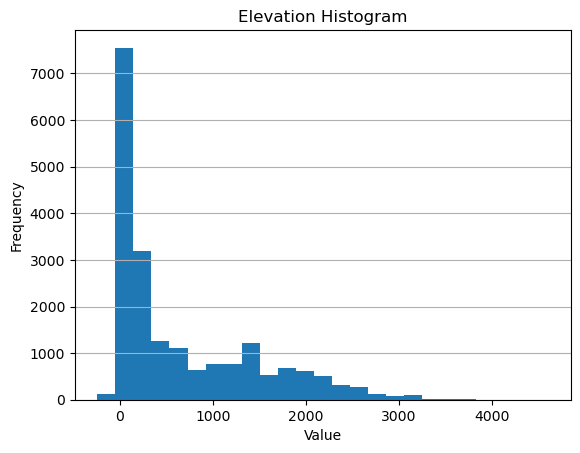

In [53]:
count = len(df) # Get the total number of rows in the dataframe before removing invalid values
df['elevation'] = df['elevation'].apply(elevation_to_float) # Convert the elevation values to floats
df = df.dropna(subset=['elevation']) # Remove rows with invalid elevation values
count = count - len(df) # Calculate the number of invalid values removed
print_boundry(f'{count} Invalid Elevation Values Removed')
print_range(df['elevation'])
plot_histogram(df['elevation'], 'Elevation Histogram')

There is no theoretical minimum or maximum to elevation, so normalizing values to the range [0,1] presents some issues. The range could be normalized based on the minimums and maximums present in the data but the distribution of data based on the histogram implies a large spread of data at the top of the distrobution. If the outliers at high elevation are too far from the bulk of the values than resolution of information is lost in the bulk of the data. The specifics of the range of outliers was further examined.

In [54]:
filtered_df = df[(df['elevation'] < df['elevation'].quantile(0.99)) & (df['elevation'] > df['elevation'].quantile(0.01))]
print_boundry(f'Middle 98 percentile of Elevation Values: {len(df) - len(filtered_df)} Elevation Outliers Removed')
print_range(filtered_df['elevation'])

------------- Middle 98 percentile of Elevation Values: 2581 Elevation Outliers Removed -------------
Range Interval: [1.0,2800.0]
Span: 2799.0


By cutting out only the top and bottom 1 percentile of the dataset, the span of the dataset drops from 4840 down to 2799, Implying a large disparity in only a few values. A further analysis was run where the outliers were calulated and filtered out with the following outlier function:

In [55]:
iqr = df['elevation'].quantile(0.75) - df['elevation'].quantile(0.25) # Calculate the interquartile range
lower_bound = df['elevation'].quantile(0.25) - 1.5 * iqr # Calculate the lower bound
upper_bound = df['elevation'].quantile(0.75) + 1.5 * iqr # Calculate the upper bound
print(f'Lower Bound: {lower_bound:.2f}')
print(f'Upper Bound: {upper_bound:.2f}')

remove_elevation_outliers = lambda x: x if lower_bound <= x <= upper_bound else None # Remove elevation outliers

Lower Bound: -1700.00
Upper Bound: 2940.00


In [56]:
filtered_df = df['elevation'].apply(remove_elevation_outliers).dropna() # Remove elevation outliers
print_boundry(f'{len(df) - len(filtered_df)} Elevation Outliers Removed')
print_range(filtered_df)

----------------------------------- 191 Elevation Outliers Removed -----------------------------------
Range Interval: [-240.0,2900.0]
Span: 3140.0


The decition was made to normalize the elevation values where instead of mapping the minimum value to 0 and the maximum value to 1 and scaling everything else to match, the values were mapped based on the edges of the outlier range. If the true minimum or maximum was not considered an outlier it was used as the reference point, and if it was considered an outlier, the boundry of the outlier range was used to map the values.

In [57]:
def normalize_elevation(elevation: float, min=np.maximum(lower_bound, df['elevation'].min()), max=np.minimum(upper_bound, df['elevation'].max())) -> float:
    """Map the elevation value to a range such that the minimum value is 0 and the maximum value is 1 where 
    the minimum value is either the lower bound of outliers or the minimum value in the dataframe, and
    the maximum value is either the upper bound of outliers or the maximum value in the dataframe.

    Args:
        elevation (float): The elevation value to normalize.
        min (float, optional): The minimum value of the range.
        max (float, optional): The maximum value of the range.
    """
    return (elevation - min) / (max - min) # Normalize the elevation to the range [0,1]

In [58]:
df['elevation'] = df['elevation'].apply(normalize_elevation) # Normalize the elevation values in the dataframe
print_range(df['elevation'], 'Normalized Elevation')
print()
print(f'Total values: {len(df)}')
print(f'Number of elevation values above 1: {len(df[df["elevation"] > 1])}')

Normalized Elevation Range Interval: [0.0,1.5220125786163523]
Normalized Elevation Span: 1.5220125786163523

Total values: 19929
Number of elevation values above 1: 191


Based on this distribution, over 99% of the data is in the range [0,1].

### 3. Final Columns

In [59]:
print(df.columns)

Index(['rating', 'ebird_code', 'channels', 'date', 'duration', 'filename',
       'latitude', 'sampling_rate', 'type', 'elevation', 'file_type',
       'longitude', 'time', 'common_name', 'sci_name', 'order', 'family',
       'species_group', 'array_size', 'total_array_size'],
      dtype='object')


#### a) Explanation for Non-Audio Feature Columns
The idea of the training is to only include information that is recordable with a smartphone, but this is more than just the audio information, there are other pieces of metadata that may contain useful links to what kind of bird is being recorded.

##### (i) `date`
The date columns now contain a value that is the percentage through the year the recording was take, as some birds are more active during some parts of the year.

Date Range Interval: [0.0,0.989041095890411]
Date Span: 0.989041095890411


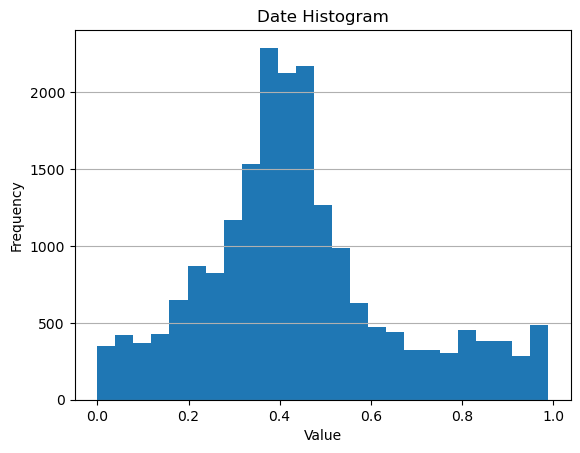

In [60]:
print_range(df['date'], 'Date')
plot_histogram(df['date'], 'Date Histogram')

##### (ii) `time`
The time column has been converted to a persentage through the day to help find patterns in birds that are more active at particular times of day.

Time Range Interval: [0.0,0.9965277777777778]
Time Span: 0.9965277777777778


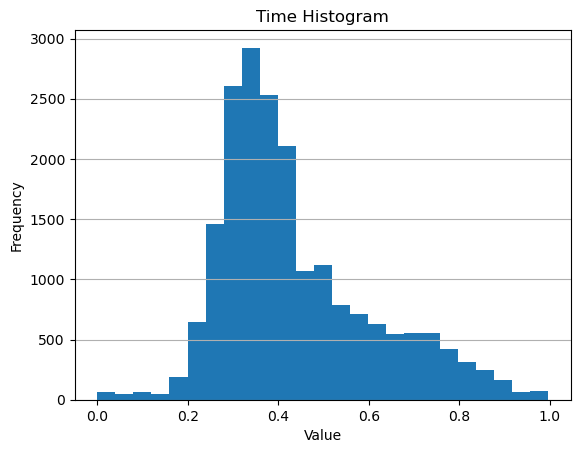

In [61]:
print_range(df['time'], 'Time')
plot_histogram(df['time'], 'Time Histogram')

##### (iii) `latitude`
The latitude is converted to the same normalized range to help use location data to determine the bird.

Latitude Range Interval: [0.20465555555555556,0.9384894444444445]
Latitude Span: 0.7338338888888889


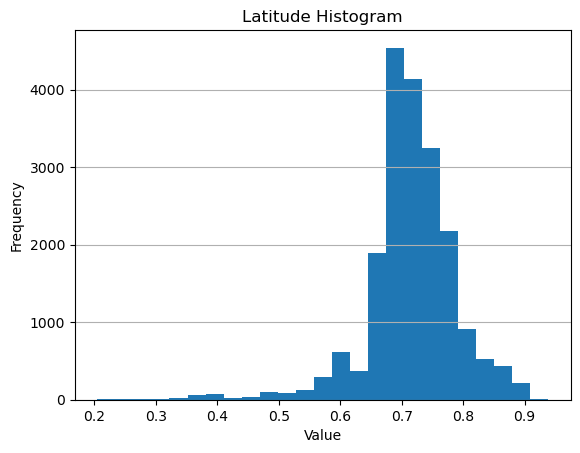

In [62]:
print_range(df['latitude'], 'Latitude')
plot_histogram(df['latitude'], 'Latitude Histogram')

##### (iv) `longitude`
The longitude is converted as well to the same normalized range to help use location data to determine the bird.

Longitude Range Interval: [0.022925555555555536,0.9971727777777779]
Longitude Span: 0.9742472222222224


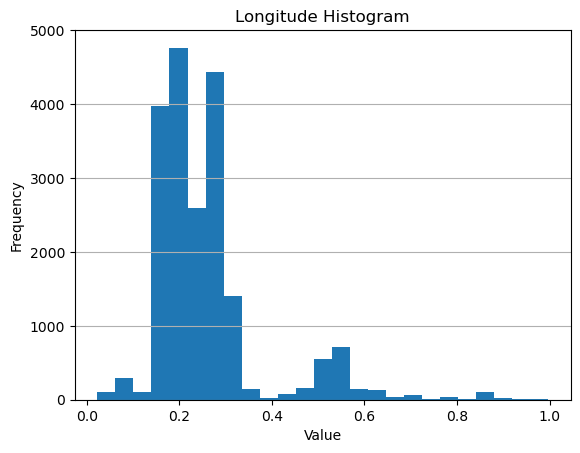

In [63]:
print_range(df['longitude'], 'Longitude')
plot_histogram(df['longitude'], 'Longitude Histogram')

##### (v) `elevation`
Elevation values are normalizes so the largest percentage is in the normalize range to help isolate birds that may be more active in some regions outside of the norm.

Elevation Range Interval: [0.0,1.5220125786163523]
Elevation Span: 1.5220125786163523


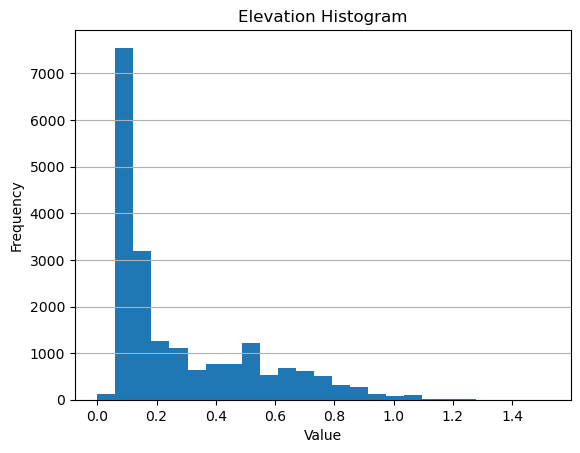

In [64]:
print_range(df['elevation'], 'Elevation')
plot_histogram(df['elevation'], 'Elevation Histogram')

##### (vi) Audio Signal Features
Further in the document we will demonstrate how to add the most important features, which is the overall magnitude of each frequency in the audio signal. Most of this document focuses on what is required to aquire those features from the signal.

#### b) Explaination for Target Columns

In [65]:
print('common_name:', df['common_name'].nunique())
print('sci_name:', df['sci_name'].nunique())
print('order:', df['order'].nunique())
print('family:', df['family'].nunique())
print('species_group:', df['species_group'].nunique())

common_name: 264
sci_name: 264
order: 17
family: 50
species_group: 45


Each one of these poses a potential target with different resolutions. Detecting the scientific name would detect individual species of birds which would be the goal of a perfect model but with such a high output array the model will have a harder time finding good accuracy. The original plan was to use order or family instead but this dataset also has the human understandable "species group" which include groups of birds like `Shorebirds`, `Hummingbirds`, or `Blackbirds`. This will provide a good target that should be understandable by the model, and also still provide useful enough information.

In [66]:
print(df['species_group'].unique())

['Tyrant Flycatchers: Pewees, Kingbirds, and Allies' 'Shorebirds'
 'Herons, Ibis, and Allies' 'Jays, Magpies, Crows, and Ravens'
 'Finches, Euphonias, and Allies' 'Falcons and Caracaras'
 'Wagtails and Pipits' 'Wood-Warblers' 'Thrushes' 'Waterfowl'
 'New World Sparrows' 'Hummingbirds' 'Vultures, Hawks, and Allies'
 'Blackbirds' 'Martins and Swallows' 'Kingfishers' 'Wrens' 'Cuckoos'
 'Tits, Chickadees, and Titmice' 'Cardinals, Grosbeaks, and Allies'
 'Gulls, Terns, and Skimmers' 'Owls' 'Treecreepers'
 'Catbirds, Mockingbirds, and Thrashers' 'Gnatcatchers' 'Vireos'
 'Long-tailed Tits and Bushtit' 'Grouse, Quail, and Allies' 'Waxwings'
 'Swifts' 'Loons' 'Nightjars' 'Cormorants and Anhingas' 'Woodpeckers'
 'Grebes' 'Pigeons and Doves' 'Starlings and Mynas' 'Kinglets' 'Larks'
 'Old World Sparrows' 'Shrikes' 'Silky-flycatchers' 'Nuthatches'
 'Longspurs and Snow Buntings' 'Rails, Gallinules, and Allies']


# § III. Audio Processing Techniques

## A. Audio Metering and Signal Analysis

### 1. Understanding Different Scales
Before delving into advanced audio analysis techniques, it is essential to establish a baseline understanding of some of the concepts explored or nessicary to understand the audio signal effectively. Most properties of sound are percieved non-linearly and here we explore some scales that help us understand aspects of an audio signal.

#### a) Decibel (dB)
The **[decibel](https://en.wikipedia.org/wiki/Decibel)** (symbol: dB) is a relative unit of measurement equal to $\frac{1}{10}$ of a **bel** (B). The **bel** (B) is $\frac{ln(10)}{2}$ **nepers** (not to be confused with a **nat** or a **nepit** which is equal to $\frac{1}{ln(2)}$ **shannons** or, equivalently $\frac{1}{ln(10)}$ **hartleys**). Put together this means: 

$1 dB = \frac{ln(10)}{20} Np$

A neper is named after a John Napier (which notably, is not "John Neper"), One of many mathematicians, statitions, or audio engineers that have things named after them that have funny names, such as Nicholas R. Lomb, and Jeffrey D. Scargle (The minds behind the "Lomb-Scargle Pediogram"). Its important to look at decibels in terms of 'nepers' because it keeps the mood up during this incredibly dry content.

For our calculations, however, we will be looking at comparing the decibel in referenced to a normalized signal magnitude. The decibel is the most common scale to use in audio signal metering and it is applied to many different use cases with slightly different meaning. The decibel itself its simply just a scale but it is applied more specificly depending on the context it is used (ie. dBFS, dBSPL, dBV, dBu all specifically refer to different use cases of the decibel scale all measuring different things). In our case we are applying the decibel scale to our instantaneous signal amplitudes, and the magnitudes of our hilbert envelopes or the frequency magnitudes when converting our time domain signal into a frequency domain signal.

To produce results in reference to the full scale of possible signal magnitude, the signal must be normalized to be in the range [-1,1]. When converting our signal to an array of sample from an audio file it produces values in a range where the maximum and minimum amplitudes corrispond to the largest numbers that could be stored with the datatype used to store each sample, this is refered to as the bit depth of the signal. Traditionally the signal would be normalized such that the minimum and maximum values that could be stored by the datatype are mapped to [-1,1] and the signal is scaled accordingly, but in this case a conscious decision was made to normalize signal values such that the maximum absolute amplitude observed in the signal is what is used to normalize the signal strength. That means that every audio file will have at least one sample at either -1 or 1. This is a simple way to ensure that all of the audio files are percieved by the machine learning model at roughly the same volume.

In [67]:
def normalize_signal(signal: ndarray, max_amplitude: Optional[number]=None) -> ndarray:
    """Normalizes the amplitude of an audio signal to the range [-1,1].
    Can perform normalization on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray): The audio signal to normalize.
        max_amplitude (int | float, optional): The maximum amplitude value in the signal. Defaults to None.
    
    Returns:
        cp.ndarray|np.ndarray: The normalized audio signal. Matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use cupy for GPU operations if the signal is a cupy array
    if max_amplitude is None: # If the maximum amplitude is not provided find the maximum amplitude in the signal
        max_amplitude = math.max(math.abs(signal))
    return signal / max_amplitude # Normalize the signal to the range [-1,1]

To perform the conversion from signal amplitude into decibels, the following formula was used:

$\Large
dB = 20 \cdot \log_{10}(|x[t]+\epsilon|)$

Where $x[t]$ refers to the instantaneous amplitude of the signal at any given time domain. This formula looks and functions the same if the input signal in the time domain is replace with a signal in the frequency domain denoted with the syntax $X[k]$

This deviates from the traditional formula slightly by adding the the constant $\epsilon$ (the number as close to 0 as possible without being 0) to the signal before performing the calculation. This is a simple means of preventing `log(0)` from causing errors. The value for $\epsilon$ is stored in `sys.float_info.epsilon` and by default references that value to perform the calculation.

In [68]:
def magnitude_to_db(signal: ndarray|number, epsilon: float=sys.float_info.epsilon) -> ndarray|number:
    """Calculate the magnitude of an audio signal in decibels.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray | float | int): The audio signal to calculate the magnitude of. Will take either an array or a single value.
        epsilon (float, optional): A small value to prevent `log(0)`. Defaults to `sys.float_info.epsilon`.
        
    Returns:
        cp.ndarray|np.ndarray|float|int: The magnitude of the audio signal in decibels. Return type matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use cupy for GPU operations if the signal is a cupy array
    return 20 * math.log10(math.abs(signal + epsilon)) # Calculate the magnitude in decibels

#### b) Frequency Scaling
The signal will be analized from 20 Hz to 20 kHz in this notebook, but how those frequencies are understood by humans (and presumably by birds) is also non-linear. For example: one octaive in music corrisponds to a doubling in frequency. There are many methods used to scale these values to match how they are percieved by people.

##### (i) Log Scale
Logorithmic scaling is the simplest way to analize the frequency domain of the signal, and does corrispond with octiave scaling. This scale is common enough and simple enough that it can be rendered directly inside of `matplotlib`.

##### (ii) Mel Scale
The [Mel Scale](https://en.wikipedia.org/wiki/Mel_scale) (named after the word *melody*) is one of many scales attempting to map more accurately the frequency domain to useful changes in human perception. The mel scale was mapped to measurements of [just-noticeable differences](https://en.wikipedia.org/wiki/Just-noticeable_difference) of pitch by the human ear. This distribution of frequency data is used by many different audio recognition models.

There are many variations of the formula to calulate the Mel Frequency, in this notebook the following formula (from [Douglas O'Shaughnessy, 1987](https://books.google.com/books?id=mHFQAAAAMAAJ&q=2595)) is used to convert $f$ hertz into $m$ mels:

$\Large
Mel(f) = 2595 \log_{10}(1 + \frac{f}{700})
$

In [69]:
def hz_to_mel(hz: ndarray|number) -> ndarray|number:
    """Convert a frequency value in Hertz to the Mel scale.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.

    Args:
        hz (cp.ndarray | np.ndarray | float | int): The frequency value in Hertz to convert. Will take either an array or a single value.
    
    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to the Mel scale. Return type matches the input signal type.
    
    Formula:
    --------
        mel = 2595 * log10(1 + hz / 700)
    """
    if isinstance(hz, cp.ndarray):
        return 2595 * cp.log10(1 + hz / 700)
    return 2595 * np.log10(1 + hz / 700)


def mel_to_hz(mel: ndarray|number) -> ndarray|number:
    """Convert a frequency value in the Mel scale to Hertz.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.

    Args:
        mel (cp.ndarray | np.ndarray | float | int): The frequency value in the Mel scale to convert. Will take either an array or a single value.
    
    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to Hertz. Return type matches the input signal type.
    
    Formula:
    --------
        hz = 700 * (10 ** (mel / 2595) - 1)
    """
    return 700 * (10 ** (mel / 2595) - 1)

##### (iii) Bark Scale
The [Bark Scale](https://en.wikipedia.org/wiki/Bark_scale) is another psychoacoustical scale with the goal of providing "a frequency scale on which equal distances correspond with perceptually equal distnaces." It is related to, but less popular than the mel scale, however it is the only scale that has the property of emphasizing the relevance of a "middle range" of frequencies and applying less value to higher frequencies as well as lower frequencies. The original formula to convert to the bark scale is:

$\Large
Bark(f) = 13 tan^{-1}(\frac{0.76f}{1000}) + 3.5 tan^{-1}((\frac{f}{7500})^2)
$

This formula has a more pronounced emphases on middle frequencies with less emphasis on very high frequency values, however it is considerably more difficult to inverse. The inverse function rarely needs to be run and it does not need to run on large amounts of data, so this limitaion was allowed remain. The solution to finding the inverse function is using the `scipy.optimize.root_scalar` to brute force the answers.

In [70]:
def hz_to_bark(hz: ndarray|number) -> ndarray|number:
    """Convert a frequency value in Hertz to the Bark scale.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.

    Args:
        hz (cp.ndarray | np.ndarray | float | int): The frequency value in Hertz to convert. Will take either an array or a single value.
    
    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to the Bark scale. Return type matches the input signal type.
    
    Formula:
    --------
        bark = 13 * arctan(0.00076 * hz) + 3.5 * arctan((hz / 7500) ** 2)
    """
    if isinstance(hz, cp.ndarray):
        return 13 * cp.arctan(0.00076 * hz) + 3.5 * cp.arctan((hz / 7500) ** 2)
    return 13 * np.arctan(0.00076 * hz) + 3.5 * np.arctan((hz / 7500) ** 2)


CPU_BARK_KEY = np.arange(0, 20000, 1) # Generate a range of frequencies from 0 to 20000 Hz
CPU_BARK_KEY = hz_to_bark(CPU_BARK_KEY) # Convert the frequencies to the Bark scale
GPU_BARK_KEY = cp.arange(0, 20000, 1) # Generate a range of frequencies from 0 to 20000 Hz on the GPU
GPU_BARK_KEY = hz_to_bark(GPU_BARK_KEY) # Convert the frequencies to the Bark scale on the GPU


def bark_to_hz(bark: ndarray|number) -> ndarray|number:
    """Convert a frequency value in the Bark scale to Hertz.
    Can only perform the conversion on the CPU, but will return a cupy array if the input is a cupy array.
    Slow and inefficient.

    Args:
        bark (cp.ndarray | np.ndarray | float | int): The frequency value in the Bark scale to convert. Will take either an array or a single value.

    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to Hertz. Return type matches the input signal type.
    """
    def single_bark_to_hz(single_bark):
        return sp.optimize.root_scalar(lambda x: hz_to_bark(x) - single_bark, bracket=[0, 24000], method='brentq').root
    
    convert_to_cupy = False # Flag to convert the output back to cupy if the input was cupy
    if isinstance(bark, cp.ndarray):
        convert_to_cupy = True
        bark = bark.get() # Convert the cupy array to a numpy array
    
    vectorized_bark_to_hz = np.vectorize(single_bark_to_hz) # Vectorize the conversion function for numpy arrays
    hz = vectorized_bark_to_hz(bark) # Convert the bark values to hertz

    if convert_to_cupy: # Convert the output back to cupy if the input was cupy
        return cp.array(hz) 
    return hz

def bark_to_hz(bark: ndarray|number) -> ndarray|number:
    """Convert a frequency value in the Bark scale to Hertz by referencing a key.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.

    Args:
        bark (cp.ndarray | np.ndarray | float | int): The frequency value in the Bark scale to convert. Will take either an array or a single value.
    
    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to Hertz. Return type matches the input signal type.
    """
    if isinstance(bark, cp.ndarray):
        return cp.digitize(bark, GPU_BARK_KEY) - 1
    return np.digitize(bark, CPU_BARK_KEY) - 1
    


##### (iv) Equivalent Rectangular Bandwidth Scale (ERBS)
The [Equivelant Rectangular Bandwidth](https://en.wikipedia.org/wiki/Equivalent_rectangular_bandwidth) Scale is the last scale on this list which measures the number of percieved audio filters below any given frequency. It is another scale which is adjusted to the perception of sound, rather than the phsycical properties of sound. The following formula was used to calulate the ERBS:

$\Large
ERBS(f) = 21.4 log_{10}(1 + \frac{0.437f}{100})
$

In [71]:
def hz_to_erbs(hz: ndarray|number) -> ndarray|number:
    """Convert a frequency value in Hertz to the ERB scale.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.

    Args:
        hz (cp.ndarray | np.ndarray | float | int): The frequency value in Hertz to convert. Will take either an array or a single value.

    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to the ERB scale. Return type matches the input signal type.

    Formula:
    --------
        erb = 21.4 * log10(1 + hz * 0.00437)
    """
    if isinstance(hz, cp.ndarray):
        return 21.4 * cp.log10(1 + hz * 0.00437)
    return 21.4 * np.log10(1 + hz * 0.00437)


def erbs_to_hz(erbs: ndarray|number) -> ndarray|number:
    """Convert a frequency value in the ERB scale to Hertz.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.

    Args:
        erbs (cp.ndarray | np.ndarray | float | int): The frequency value in the ERB scale to convert. Will take either an array or a single value.

    Returns:
        cp.ndarray|np.ndarray|float|int: The frequency value converted to Hertz. Return type matches the input signal type.

    Formula:
    --------
        hz = (10 ** (erb / 21.4) - 1) / 0.00437
    """
    return (10 ** (erbs / 21.4) - 1) / 0.00437

##### (v) Visualizing Different Scales
To compare each of these scales, they will all be compared to the logorithmic scale.

In [72]:
def plot_scale_comparisons(scale_functions: List[Callable[[ndarray|number], ndarray|number]],
                           inverse_scale_functions: List[Callable[[ndarray|number], ndarray|number]],
                           bins: int=50) -> None:
    """Plot the comparison of multiple frequency scale conversion functions to a logarithmic scale.
    Groups each frequency value into a bin and plots the frequency value against the bin number for each function.
    
    Args:
        scale_functions (List[Callable[[ndarray|number], ndarray|number]]): The frequency scale conversion functions to compare.
        bins (int, optional): The number of bins to group the frequency values into. Defaults to 100.
    """
    _, ax = plt.subplots(1, len(scale_functions), figsize=(15, 4)) # Set the figure size

    for i, scale_function in enumerate(scale_functions): # Iterate through each scale function
        inverse_scale_function = inverse_scale_functions[i] # Get the inverse scale function

        bin_edges = np.linspace(scale_function(20), scale_function(20000), bins) # Generate the bin values
        bin_edges_hz = inverse_scale_function(bin_edges) # Convert the bin values back to Hz. This keep the spacing consistent to the scale function values

        for j in range(1, len(bin_edges)): # This is essentially the plot, make a box for each bin
            ax[i].fill_betweenx([bin_edges_hz[j-1], bin_edges_hz[j]], j, j+1, color='tab:blue', alpha=1)

        ax[i].set_title(f'{scale_function.__name__} Scale Comparison')
        ax[i].set_ylabel('Frequency (Hz)')
        ax[i].set_yscale('log')
        yticks = np.array([20, 50, 100, 200, 500, 1000, 2000, 5000, 10000, 20000])
        ax[i].set_yticks(yticks, yticks.astype(str))
        ax[i].set_xlabel('Bin Number')
        xticks = np.linspace(1, bin_edges.size, 10).astype(int)
        ax[i].set_xticks(xticks)
        ax[i].grid(True)
    plt.show()

Here we can see how bins grouping frequencies at different scales organize the frequency information at various resolutions. At lower resolutions the plot is easier to understand, and at higher resolutions the curve hidden in each scale becomes more clear.

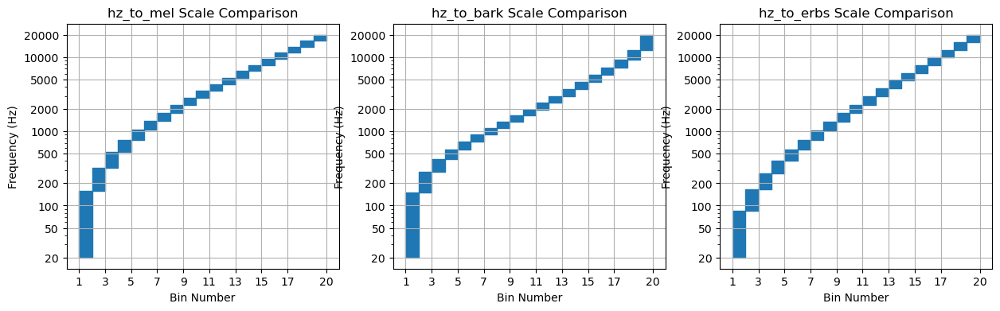

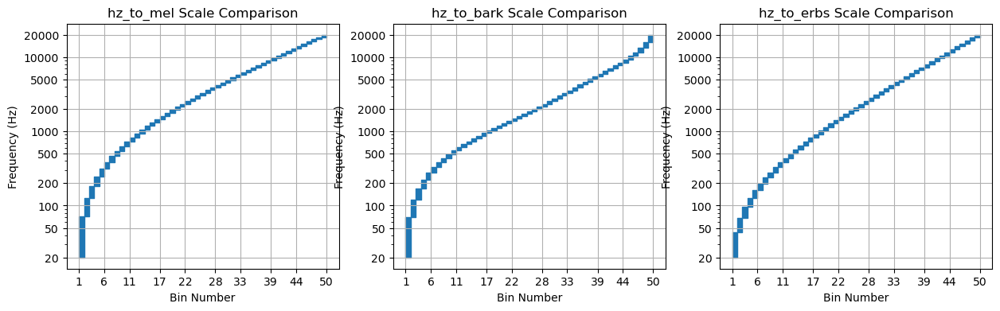

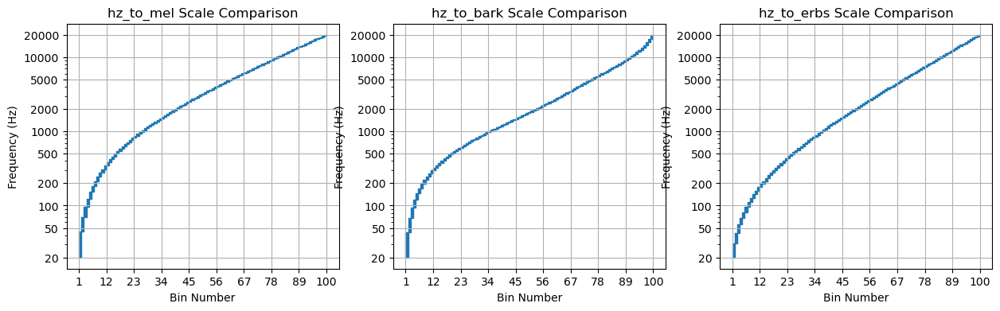

In [73]:
plot_scale_comparisons([hz_to_mel, hz_to_bark, hz_to_erbs], [mel_to_hz, bark_to_hz, erbs_to_hz], bins=20)
plot_scale_comparisons([hz_to_mel, hz_to_bark, hz_to_erbs], [mel_to_hz, bark_to_hz, erbs_to_hz], bins=50)
plot_scale_comparisons([hz_to_mel, hz_to_bark, hz_to_erbs], [mel_to_hz, bark_to_hz, erbs_to_hz], bins=100)

Here we can see on this chart how the frequencies would get grouped together in different scales. A longer vertical line in each bin means that using that scale, more frequencies would be grouped in that bin. The key things to pay attention to are the scales at the edge of this range, where there is the least amount of useful sonic information coming from birdcalls. The majority of bird information is expected to come from the 100 Hz - 10 kHz range, and especially in the 500 Hz - 5 kHz range. It is for this reason that the Bark scale is used to group and display frequencies in this project.

In [74]:
@lru_cache(maxsize=None)
def get_bark_spaced_frequencies(num_bands: int = 100, math: Literal['numpy','cupy'] = 'numpy') -> ndarray:
  """Generate a set of frequencies between 20 and 20000 Hz spaced evenly along the Bark scale.
  The frequencies are cached for faster access and to avoid recalculating the same values.

  Args:
    num_bands (int, optional): The number of frequency bands to generate. Defaults to 100.
    math ('numpy' | 'cupy', optional): The library to use for calculations. Defaults to np.

  Returns:
    ndarray: The frequencies spaced evenly along the Bark scale.
  """
  if math not in ['numpy', 'cupy']: # Check if the math library is valid
    raise ValueError("math must be either 'numpy' or 'cupy'")
  math = np if math == 'numpy' else cp # Select the math library to use
  
  frequencies = math.linspace(hz_to_bark(20), hz_to_bark(20000), num_bands) # Generate the frequency bins
  frequencies = bark_to_hz(frequencies) # Convert the frequency bins back to Hz
  return frequencies

### 2. Plotting Waveforms

With the scale functions in place, waveforms can now be plotted simply and their amplitudes can be displayed in decibels.

In [75]:
def signal_to_time(signal: ndarray, sampling_rate: int) -> ndarray:
    """Calculate the time values for each sample in an audio signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The audio signal to calculate the time values for.
        sampling_rate (int): The sampling rate of the audio signal.
    
    Returns:
        cp.ndarray|np.ndarray: The time values for each sample in the audio signal. Return type matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use cupy for GPU operations if the signal is a cupy array
    return math.arange(signal.size) / sampling_rate # Calculate the time values for each sample


def plot_waveform(sound: AudioSegment, title: str='Waveform', normalization_constant: int=None) -> None:
    """Plot the waveform of an audio signal.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str, optional): The title of the plot. Defaults to 'Waveform'.
        normalization_constant (int, optional): The constant to normalize the signal by. Defaults to None.
    """
    if sound.channels > 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]

    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal, normalization_constant) # Normalize the signal to the range [-1,1]
    time = signal_to_time(signal, sound.frame_rate) # Calculate the time values for each sample
    plt.figure(figsize=(15, 3)) # Long figure to show the RMS signal clearly
    plt.plot(time, signal) # Plot the waveform
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude (dB)')
    plt.axhline(0, color='black', linewidth=0.5) # Add a horizontal black centerline
    yticks = np.linspace(-1, 1, 15) # Add y-ticks
    yticks_labels = [f'{int(magnitude_to_db(y))}' for y in yticks] # Convert the y-ticks to decibels
    yticks_labels[7] = '-∞' # Replace the center y-tick with negative infinity
    plt.ylim(-1, 1)
    plt.yticks(yticks, yticks_labels)
    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1 # Set the depth of the time values
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    plt.show()

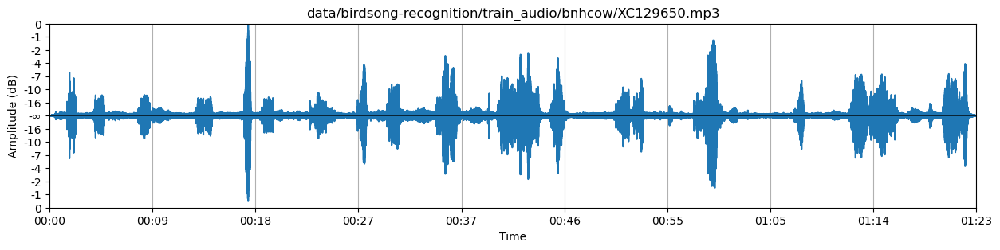

In [76]:
filename = df.sample(1).filename.iloc[0] # Pick a file, any file.      That was me as a magician. I hope you liked it.
sound = load_sound_file(filename) # Load the audio file
plot_waveform(sound, title=filename) # Show me the magic

#### a) RMS Calculations
In addition to directly plotting the signal, another common technique for analizing signal is to view the signal in terms of short term RMS, where in a window of time (usually about 300 ms) the rms is calulated and that rms number is plotted to give a better picture of how volume is changnig over time without as much instantaneous variance.

RMS calculations traditionally only look at sample behind the current sample, meaning the RMS signal has a slight delay in magnitude incresing compared with the true peak signal. This is to be expected. In order to calculate the rms in a window centered around the target sample, rather than behind the target sample, a boolean parameter is added to the rms calulation function, but this is only used for a single abnormal calulation used later in the project for click detection in an audio signal.

In [77]:
def signal_to_rms_signal(signal: ndarray, sample_rate: int, window_size: int=300, centered: bool=False) -> ndarray:
    """Calculate the Root Mean Square (RMS) of an audio signal. The RMS is calculated over a moving window of the signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The audio signal to calculate the RMS of.
        sample_rate (int): The sample rate of the audio signal.
        window_size (int, optional): The size of the moving window in milliseconds. Defaults to 300.
        centered (bool, optional): If True, the RMS is calculated at the center of the window. This is abnormal. Defaults to False.
    
    Returns:
        cp.ndarray|np.ndarray: The RMS of the audio signal. Return type matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use cupy for GPU operations if the signal is a cupy array
    window_size = int(window_size * sample_rate / 1000) # Convert the window size to samples

    pad_width = window_size // 2 if centered else window_size # Calculate the padding width
    padded_signal = math.pad(signal, pad_width, mode='constant') # Pad the area around the signal making it longer

    cumsum = math.cumsum(padded_signal ** 2) # Calculate the cumulative sum of the squared signal
    cumsum = cumsum[window_size:] - cumsum[:-window_size] # Calculate the difference between the cumulative sums to get the sum of the squared signal in the window
    rms_signal = math.sqrt(cumsum / window_size) # Calculate the RMS of the signal

    if signal.size > rms_signal.size: # Add 1 element of padding to the end of the RMS signal with the value 0
        rms_signal = math.concatenate((rms_signal, math.array([0])))
    del padded_signal # Delete the padded signal to free up memory
    return rms_signal[:signal.size] # Remove the padding from the RMS signal if needed

def plot_rms_signal(sound: AudioSegment, title: str='RMS Signal', normalization_constant: int=None) -> None:
    """Plots the Root Mean Square (RMS) of an audio signal over time.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str, optional): The title of the plot. Defaults to 'RMS Signal'.
        normalization_constant (int, optional): The constant to normalize the signal by. Defaults to None.
    """
    if sound.channels > 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]

    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal, normalization_constant) # Normalize the signal to the range [-1,1]
    rms_signal = signal_to_rms_signal(signal, sound.frame_rate) # Calculate the RMS of the signal
    time = signal_to_time(rms_signal, sound.frame_rate) # Calculate the time values for each RMS value
    plt.figure(figsize=(15, 3)) # Long figure to show the RMS signal clearly
    plt.plot(time, rms_signal) # Plot the RMS signal
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('RMS Amplitude (dB)')
    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    yticks = np.linspace(0, 1, 7) # Add y-ticks. If the number of ticks is too high it will show 0 twice.
    yticks_labels = [f'{int(magnitude_to_db(y))}' for y in yticks]  # Convert the y-ticks to decibels
    yticks_labels[0] = '-∞' # Replace the first y-tick with negative infinity
    plt.ylim(0, 1)
    plt.yticks(yticks, yticks_labels)
    plt.fill_between(time, rms_signal, 0, color='tab:blue', alpha=0.5) # Fill the area under the RMS signal
    plt.show()

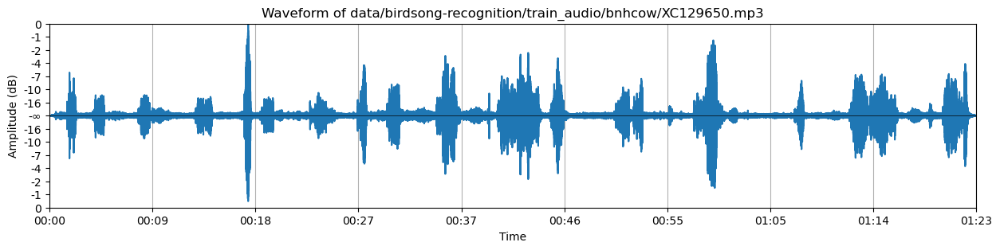

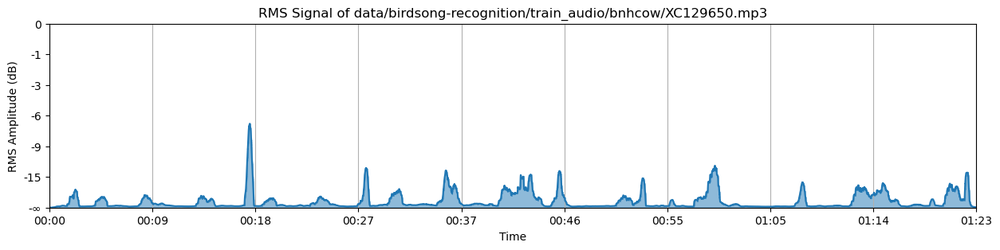

In [78]:
plot_waveform(sound, title=f'Waveform of {filename}')
plot_rms_signal(sound, title=f'RMS Signal of {filename}')

### 3. Understanding Different Signal Transformations
Signal transformations are essential in audio signal processing for analyzing and manipulating signals in ways that reveal patterns or characteristics not immediately apparent in the raw waveform. By default when extracting the array of samples from an audio file, the resulting signal is a real valued signal in the time domain (meaning the array is a real valued array of amplitudes over time). A signal in the time domain is often denoted with $x(t)$ in continuous time signals, and $x[n]$ in discrete time signals. For signals in the frequency domain, $X(f)$ is used for continuous signals, and $X[k]$ in discrete signals.

#### a) The Fourier Transformation
[The Fourier Transformation](https://en.wikipedia.org/wiki/Fourier_transform) is a fundamental tool in signal processing that allows the decomposition of a time-domain signal into its constituent frequencies.

<img src='https://upload.wikimedia.org/wikipedia/commons/7/72/Fourier_transform_time_and_frequency_domains_%28small%29.gif'>

It is also an incredibly complex function that will not get fully described in this notebook. At its most basic it is a means of converting a time domain signal into a complex valued signal in the frequency domain. This new signal describes a signal as the sum of sinusoidal components of varying frequencies, amplitudes, and phases. The greater formula for a fourier transform is as follows:

$\Large
\widehat{f}(\xi) = \displaystyle \int_{-\infty}^{\infty} f(t) e^{-i 2 \pi \xi x} dx
$

But thats just coo-coo for coco-puffs. Calulations for fourier transomations in discrete time signals in the digital realm usually use the Fast Fourier Transform function:

$\Large
X[k] = \displaystyle \sum_{m=0}^{n-1} x_m e^{-i 2 \pi km/n}
$

Much simpler that way right? (...right?)
Good thing someone else implimented the function into `scipy` already. Here a shorthand is defined to handle CPU/GPU agnostic usage, and to manage caching of `cupy` fft plans.

In [79]:
def fourier_transform(signal: ndarray, sample_rate: int, cache: bool=False) -> Tuple[ndarray, ndarray]:
    """Calculate the Fourier Transform of a real valued signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray): The signal to calculate the Fourier Transform of.
        sample_rate (int): The sample rate of the signal.
        cache (bool, optional): If True, the FFT plan is cached for faster computation. Defaults to False.
    
    Returns
    --------
     - **cp.ndarray|np.ndarray:** The frequencies of the Fourier Transform. Matches the input signal type.
     - **cp.ndarray|np.ndarray:** The frequency-signal of the Fourier Transform in decibels. Matches the input signal type.
    """    
    fft = sp.fft # Use scipy for CPU operations by default (faster than numpy at performing FFT)
    if isinstance(signal, cp.ndarray):
        fft = cufft # Use CuPy for GPU operations if the signal is a cupy array
    else:
        if cache: # If the cache is requested but the signal is not a cupy array, print a warning
            print('Warning: Cache is only available for GPU operations.')
    
    def rfft(signal, sample_rate): # Helper function to calculate the Fourier Transform
        n = signal.size # Get the number of samples in the signal
        frequencies = fft.rfftfreq(n, 1/sample_rate) # Calculate the frequencies
        signal = fft.rfft(signal, overwrite_x=True) # Calculate the Fourier Transform of the signal
        signal = signal / (n//2) # Normalize the signal
        return frequencies, signal # Return the frequencies and magnitudes of the Fourier Transform
    
    if isinstance(signal, cp.ndarray) and (cache is False): # If the operation is on the GPU and cache is not requested
        with fft.get_fft_plan(signal, value_type='R2C'): # Create the FFT plan
            return rfft(signal, sample_rate) # Calculate the Fourier Transform using the plan
    else:
        return rfft(signal, sample_rate) # Calculate the Fourier Transform

##### (i) Understanding The Complex Result
###### *To readers familiar with complex analysic or linear algebra this will probably be just a refresher, but this was new information for me so I'm bringing it up here to guide you through the journey I had to go on for the first time.
From here on out: complex numbers become common and it is important some fundimental information about how to think about complex numbers is established.

Complex numbers can be plotted against the compled plane based on their traditional representation: $z = x + yi$ where $x$ and $y$ can be thought of as coordinents in a cartesian plotting system.


<img src='https://upload.wikimedia.org/wikipedia/commons/d/d6/Argandgaussplane.png' height='250px'>
<img src='https://upload.wikimedia.org/wikipedia/commons/d/d3/Examples_of_Polar_Coordinates.svg' height='250px'>

This means the complex number can also be though of as a vector, with a magnitude (the distance from origin) and a phase angle (the angle of direction from the origin).

This format is refered to as the *polar* form. In the figure above the magnitude is denoted with $r$ and the phase angle is denoted with $\phi$ in degrees. In this notebook in reference to complex numbers: 
 - The full complex number is denoted as $z$.
 - The real value is denoted $x$.
 - The imaginary coefficent is denoted $y$.
 - The phase angle is denoted $\theta$ and measured in radians.
 - The magnitude is denoted $|z|$.

In the context of fourier transformations, while all complex numbers will be represented by default in $x + yi$ notation, the information about the signal is stored in the polar notation of the complex number. The magnitude of the complex number is a direct abstraction for the magnitude of the frequency in the signal, and the phase angle of the complex number represents the starting phase angle of that frequency in the signal.

The magnitude can be extracted from the signal by finding the absolute value of the signal. Any time the `math.abs()` function is fun in this entire project, it should be thought of not as an absolute value calculation, but as a calculation of the complex magnitude, because in most cases the numbers in the signals are *not* real numbers. The phase can be extracted from a value from the `math.phase()` function. Conversion *back* is as simple as running the numbers into Euiler's Formula. All of the follow are true and can be converted between eachother:

$\large
z = x + yi
$

$\large
z = |z| (cos\theta + isin\theta)
$

$\large
z = |z| e^{i \theta}
$

In [80]:
def polar_to_complex(magnitudes: ndarray|number, phases: ndarray|number) -> ndarray|complex:
    """Convert polar coordinates to complex numbers using Euler's formula.
    Can convert either a single value or an array of values.
    Can perform the conversion on either the CPU or GPU, depending on the input signal type.
    Does not check if both inputs are the same type or shape.

    Args:
        magnitudes (cp.ndarray | np.ndarray | float | int): The magnitudes of the complex numbers.
        phases (cp.ndarray | np.ndarray | float | int): The phases of the complex numbers.
    
    Returns:
        cp.ndarray|np.ndarray|complex: The complex numbers. Return type matches the input signal type.
    """
    if isinstance(magnitudes, cp.ndarray):
        return magnitudes * cp.exp(1j * phases) # In python, j is the imaginary unit
    return magnitudes * np.exp(1j * phases)     # This follows the convention used in electrical engineering

##### (ii) Advantage of GPU Parallelization when Performing Fourier Transformations
Performing Fourier Transforms, especially on large datasets, can be computationally intensive. The GPU offers a significant advantage for such tasks due to its ability to execute many calculations in parallel. Fourier Transforms, particularly the Fast Fourier Transform (FFT), involve repetitive mathematical operations that are ideal for parallel execution. Additionally, under the hood, CuPy leverages NVIDIA's cuFFT library, a CUDA-optimized toolkit specifically designed for performing FFTs efficiently on GPUs.

To verify the benefits of gpu processing for this task, a test was run in which a large amount of data is preloaded for performing an fft, and the fft is run on both the CPU with `scipy.fft` and on the GPU with `cupyx.scipy.fft` and the times taken to finish the entire dataset were compared over a 10 iterations.

In [81]:
def fourier_transform_speed_test(cache_filepath: str, dataset_size_limit: float, iterations: int) -> None:
    """Test the speed of the Fourier Transform on a dataset of a given size.
    Preload the entire dataset into memory before the timer starts to prevent IO bottlenecks.
    
    Args:
        cache_file_path (str): The path to the cache file for the Fourier Transform.
        dataset_size_limit (float): The size of the dataset to test in MB.
        iterations (int): The number of iterations to run the test.
    """
    if os.path.exists(f'exports/{cache_filepath}'): # Check if the cache file exists
        print_boundry(f'{cache_filepath[:-4]} Results')
        cached_df = pd.read_csv(f'exports/{cache_filepath}') # Load the cached results
        cpu_times = cached_df['CPU Time'].values
        gpu_times = cached_df['GPU Time'].values
        improvement = (cpu_times / gpu_times) - 1 # Calculate the improvement
        print(f'Avg CPU Time: {time_to_human_readable(cpu_times.mean(), depth=1)} ± {cpu_times.std():.1f} seconds')
        print(f'Avg GPU Time: {time_to_human_readable(gpu_times.mean(), depth=1)} ± {gpu_times.std():.1f} seconds')
        print(f'Avg GPU Improvement: {improvement.mean():.0%} ± {improvement.std():.0%}')
        return
    
    clear_gpu_memory() # Clear the GPU memory
    print_boundry(f'Running {cache_filepath[:-4]} Test')
    mean_array_size = df['array_size'].mean() # Calculate the mean size of the audio arrays
    dataset_size_limit *= 1024**2 # Convert the dataset size limit to bytes
    print(f'Mean Array Size: {bytes_to_human_readable(mean_array_size)}')
    print(f'Dataset Size Limit: {bytes_to_human_readable(dataset_size_limit)}')
    print(f'Estimated Number of Files: {int(dataset_size_limit / mean_array_size)}')
    cpu_times = [] # Initialize an empty list to store the CPU times
    gpu_times = [] # Initialize an empty list to store the GPU times
    
    for i in range(iterations):
        print_boundry(f'Iteration {i+1}/{iterations}: Preloading {bytes_to_human_readable(dataset_size_limit)} of data into memory')
        dataset = [] # Initialize an empty list to store the dataset
        dataset_size = 0 # Initialize the dataset size to 0
        print()
      
        while dataset_size + mean_array_size < dataset_size_limit: # Load samples until the dataset size exceeds the limit
            clear_gpu_memory() # Clear the GPU memory
            sample = df.sample(1).iloc[0] # Get a random sample from the dataframe
            if dataset_size + sample.array_size > dataset_size_limit:
                continue # If the dataset size exceeds the limit, load another sample
            sound = load_sound_file(sample.filename).split_to_mono()[0] # Load the audio file
            signal_sample_rate_pair = normalize_signal(np.array(sound.get_array_of_samples())), sound.frame_rate # Get the signal and sample rate
            dataset.append(signal_sample_rate_pair) # Add the signal and sample rate to the dataset
            dataset_size += sample.array_size # Add the size of the sample to the dataset size
      
        print(f'Testing CPU FFT Speed with {bytes_to_human_readable(dataset_size)} of data')
        cpu_start = time.time() # Mark the start time
        for signal, sample_rate in dataset: # Iterate through each sample in the dataset
            fourier_transform(signal, sample_rate) # Calculate the Fourier Transform
        cpu_time = time.time() - cpu_start # Calculate the CPU time
        cpu_times.append(cpu_time) # Add the CPU time to the list
        print(f'CPU Time: {cpu_time:.4f} seconds')

        dataset = [(cp.array(signal), sample_rate) for signal, sample_rate in dataset] # Load the dataset to VRAM
        print()
        print(f'Testing GPU FFT Speed with {bytes_to_human_readable(dataset_size)} of data')
        gpu_start = time.time() # Mark the start time
        for signal, sample_rate in dataset: # Iterate through each sample in the dataset
            fourier_transform(signal, sample_rate) # Calculate the Fourier Transform
        gpu_time = time.time() - gpu_start # Calculate the GPU time
        gpu_times.append(gpu_time) # Add the GPU time to the list
        print(f'GPU Time: {gpu_time:.4f} seconds')
        print()
        del dataset # Clear the dataset from memory
        clear_gpu_memory() # Clear the GPU memory

    print_boundry(f'{cache_filepath[:-4]} Results')
    cpu_times = np.array(cpu_times)
    gpu_times = np.array(gpu_times)
    improvement = (cpu_times / gpu_times) - 1 # Calculate the improvement
    print(f'Avg CPU Time: {time_to_human_readable(cpu_times.mean(), depth=1)} ± {cpu_times.std():.1f} seconds')
    print(f'Avg GPU Time: {time_to_human_readable(gpu_times.mean(), depth=1)} ± {gpu_times.std():.1f} seconds')
    print(f'Avg GPU Improvement: {improvement.mean():.0%} ± {improvement.std():.0%}')
    cached_df = pd.DataFrame({'CPU Time': cpu_times, 'GPU Time': gpu_times}) # Create a dataframe with the results
    cached_df.to_csv(f'exports/{cache_filepath}', index=False) # Cache the results
    print_boundry() # Separate the results
    print()

In [82]:
fourier_transform_speed_test('FFT_Speed_Test_64MB_10.csv', 64, 10)   # Lets!
fourier_transform_speed_test('FFT_Speed_Test_128MB_10.csv', 128, 10) # Run!
fourier_transform_speed_test('FFT_Speed_Test_256MB_10.csv', 256, 10) # Some!
fourier_transform_speed_test('FFT_Speed_Test_512MB_10.csv', 512, 10) # Tests!

clear_gpu_memory() # Clear the GPU memory

-------------------------------- Running FFT_Speed_Test_64MB_10 Test --------------------------------
Mean Array Size: 5.01 MB
Dataset Size Limit: 64.00 MB
Estimated Number of Files: 12
---------------------- Iteration 1/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU FFT Speed with 62.21 MB of data
CPU Time: 2.3568 seconds

Testing GPU FFT Speed with 62.21 MB of data
GPU Time: 0.1476 seconds

---------------------- Iteration 2/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU FFT Speed with 63.32 MB of data
CPU Time: 2.3529 seconds

Testing GPU FFT Speed with 63.32 MB of data
GPU Time: 0.1399 seconds

---------------------- Iteration 3/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU FFT Speed with 60.66 MB of data
CPU Time: 1.4029 seconds

Testing GPU FFT Speed with 60.66 MB of data
GPU Time: 0.0718 seconds

---------------------- Iteration 4/10: Preloading 64.00 MB of data into memory ------

Now ***that*** is coo-coo for cocopuffs.

##### (iii) Grouping Frequencies Together
Grouping frequencies together simplifies audio analysis by reducing complexity, aligning with human auditory perception, and shrinking the input array to a manageable size. Using the Bark Scale, frequencies are grouped into bins, and the frequency with the highest magnitude will be selected as the representative magnitude for that frequency bin. This process emphasized the importance of frequencies that stand out against the noisefloor, while reducing the data dimentionality. Another option for grouping frequencies is to average the groups with an RMS calculation. This will be added to the function to test, with the idea that it would smooth out outliers in frequency data, but for some signals that may not be desired.

In [83]:
def group_frequencies(frequencies: ndarray,
                      freq_signal: ndarray,
                      freq_bins: Optional[ndarray]=None,
                      num_groups: int=100,
                      ) -> Tuple[ndarray, ndarray]:
    """Group the frequencies of a Fourier Transform into a smaller number of groups by calculating the RMS of each group.
    Each group is spaced evenly along the Bark Scale.
    Can perform the grouping on either the CPU or GPU, depending on the input signal type.

    Args:
        frequencies (cp.ndarray | np.ndarray): The frequencies of the Fourier Transform.
        freq_signal (cp.ndarray | np.ndarray): The resulting complex signal from the Fourier Transform.
        freq_bins (cp.ndarray | np.ndarray, optional): The frequency bins to group the frequencies into. Defaults to None.
        num_groups (int, optional): The number of groups to create. Defaults to 100.
      
    Returns
    -------
    - **cp.ndarray|np.ndarray**: The grouped frequencies. Matches the input signal type.
    - **cp.ndarray|np.ndarray**: The magnitude value for the bin. Matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(frequencies, cp.ndarray):
        math = cp # Use cupy for GPU operations if the signal is a cupy array

    if freq_bins is None: # If the frequency bins are not provided
        freq_bins = get_bark_spaced_frequencies(num_groups, math.__name__) # Get the Bark spaced frequencies
    bin_indicies = math.digitize(frequencies, freq_bins) - 1 # Group the frequencies into bins
    reduced_freq_signal = math.zeros(len(freq_bins)) # Initialize an array to store the maximum magnitude in each bin
    for i in range(len(freq_bins)): # Iterate through each bin
        bin_values = freq_signal[bin_indicies == i] # Get the values in the bin
        reduced_freq_signal[i] = math.sqrt(math.mean(math.abs(bin_values) ** 2)) # Calculate the RMS of the bin
    return freq_bins, reduced_freq_signal # Return the grouped frequencies and maximum magnitudes

##### (iv) Example Frequency Spectrums
To visualize the grouped frequency data, we will define plotting functions that create clear, interpretable frequency spectrums displayed in the bark scale.

In [84]:
def plot_fourier_analysis(sound: AudioSegment, title: str='Fourier Analysis', group: bool=True) -> None:
    """Plot the Fourier Transform of an audio signal.
    Can group the frequencies into a smaller number of bins for easier visualization.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str, optional): The title of the plot. Defaults to 'Fourier Analysis'.
        group_frequencies (bool, optional): Dictates if the frequencies should be grouped. Defaults to 'True'.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]
    
    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal) # Normalize the signal to the range [-1,1]
    frequencies, freq_signal = fourier_transform(signal, sound.frame_rate) # Calculate the Fourier Transform
    if group: # If the frequencies should be grouped
        frequencies, freq_signal = group_frequencies(frequencies, freq_signal) # Group the frequencies
    freq_signal = magnitude_to_db(freq_signal) # Convert the magnitudes to decibels

    plt.figure(figsize=(15, 5)) # Set the figure size
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude (dB)')
    xticks = np.array([20, 100, 200, 400, 600, 1000, 2000, 4000, 6000, 10000, 20000]) # Set the x-ticks
    plt.xlim(hz_to_bark(20), hz_to_bark(20000)) # Set the x-axis limits to the Bark scale
    plt.xticks(hz_to_bark(xticks), xticks) # Convert the x-ticks to the Bark scale
    plt.ylim(-150, 0) # Set the y-axis limits
    plt.yticks([0, -20, -40, -60, -80, -100, -120, -140], [0, -20, -40, -60, -80, -100, -120, -140]) # Set the y-ticks
    plt.grid(True, which="both", axis='x', ls="--") # Add a grid to the plot
    plt.plot(hz_to_bark(frequencies), freq_signal) # Plot the Fourier Transform
    plt.fill_between(hz_to_bark(frequencies), freq_signal, -150, color='tab:blue', alpha=0.2) # Fill the area under the Fourier Transform
    plt.show()

Here are what the fourier transformations look like from some generated signals. Different grouping patterns will be visualized for each signal to highlight the information lost from each grouping style.

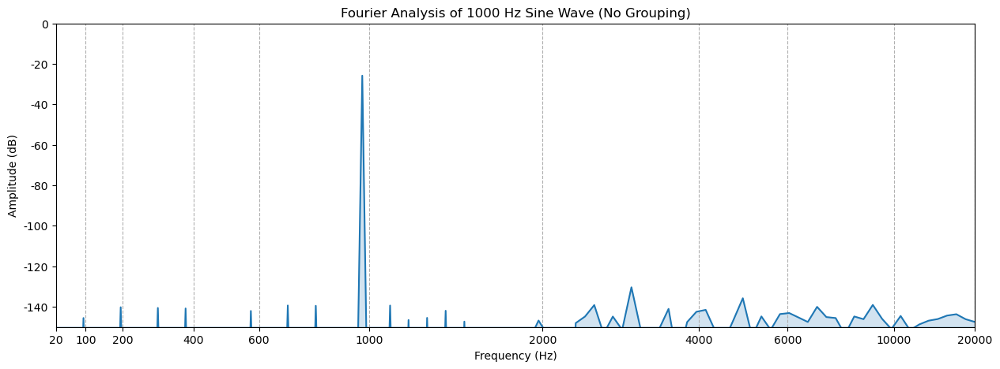

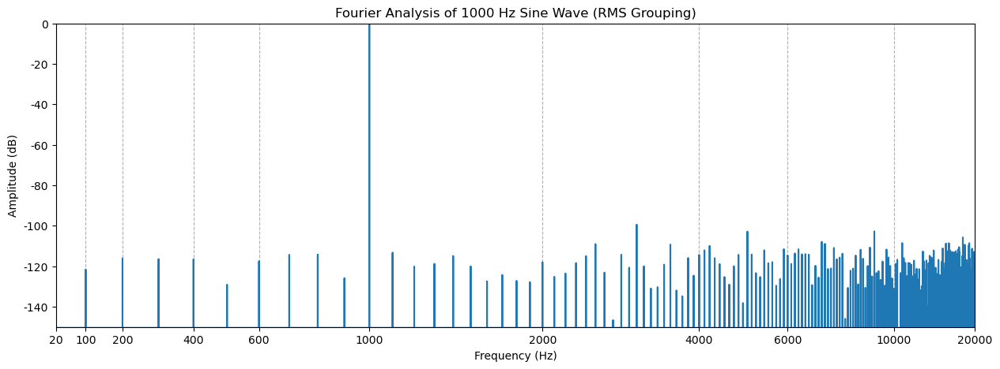

In [85]:
plot_fourier_analysis(generate_sine_wave(1000, 10), title='Fourier Analysis of 1000 Hz Sine Wave (No Grouping)', group=True)
plot_fourier_analysis(generate_sine_wave(1000, 10), title='Fourier Analysis of 1000 Hz Sine Wave (RMS Grouping)', group=False)

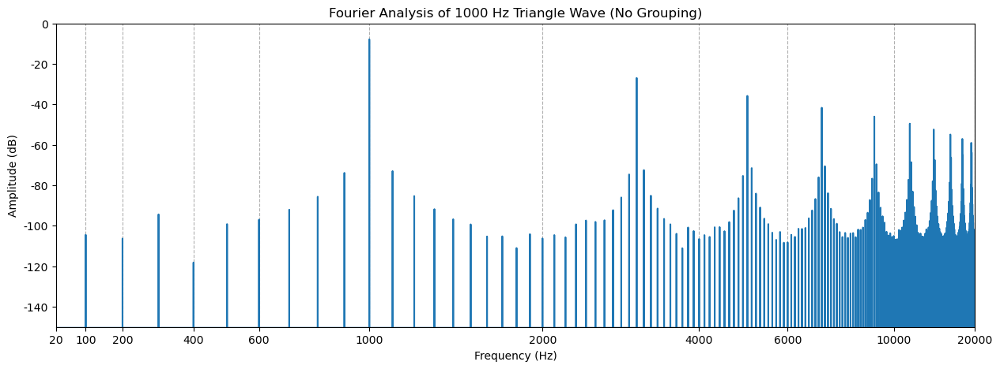

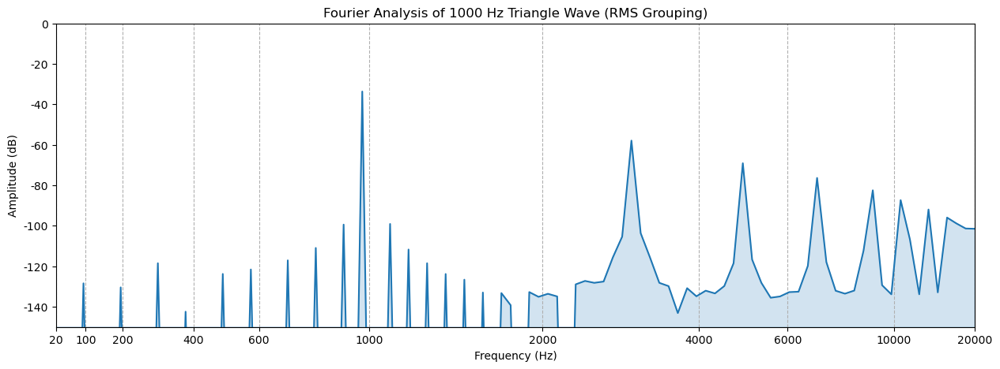

In [86]:
plot_fourier_analysis(generate_triangle_wave(1000, 10), title='Fourier Analysis of 1000 Hz Triangle Wave (No Grouping)', group=False)
plot_fourier_analysis(generate_triangle_wave(1000, 10), title='Fourier Analysis of 1000 Hz Triangle Wave (RMS Grouping)', group=True)

The information lost in the files is more apparent because of the abnormal frequency balance of the files because of their electronic nature. Natural recordings and things with a wider array of frequencies respond much more naturally to this form of frequency grouping.

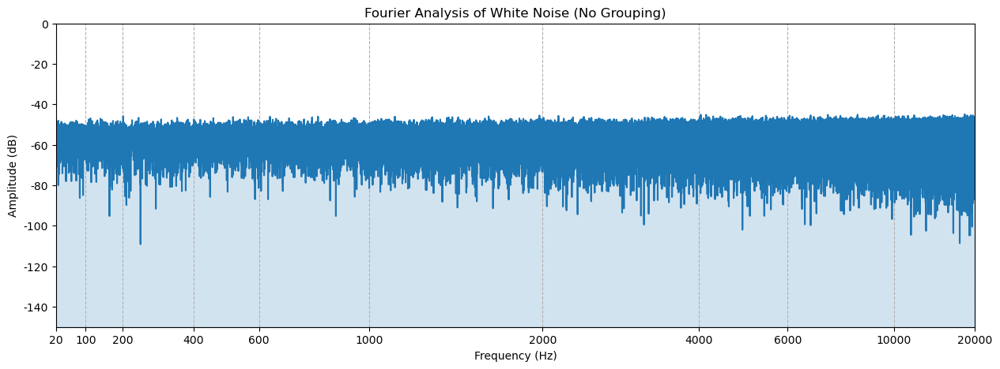

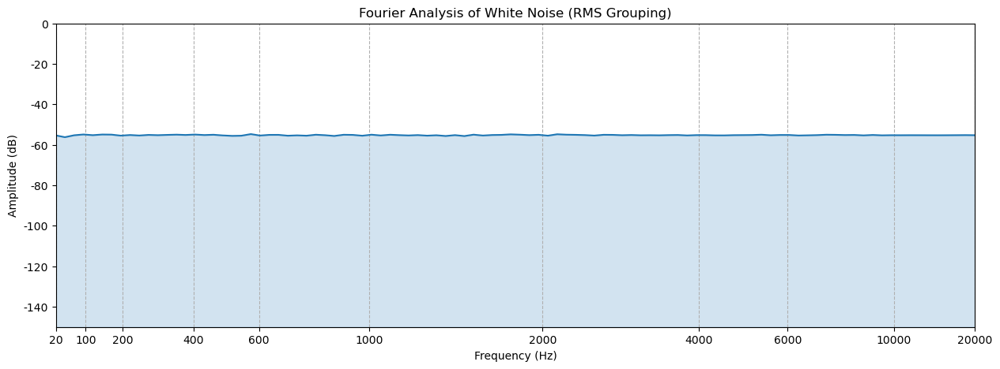

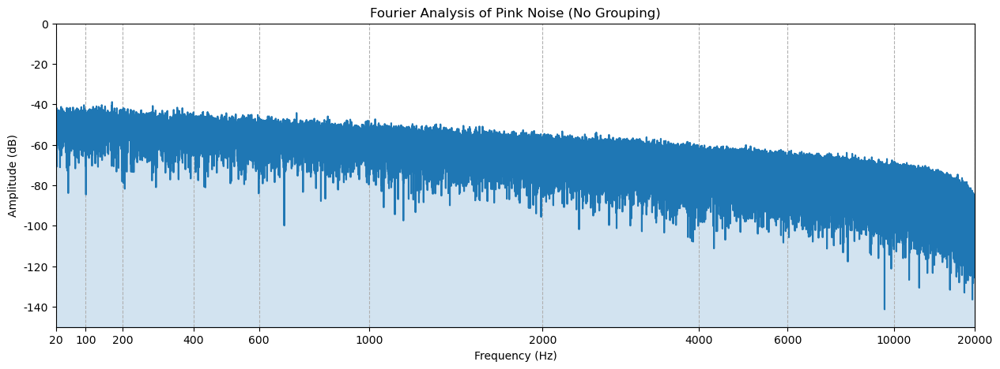

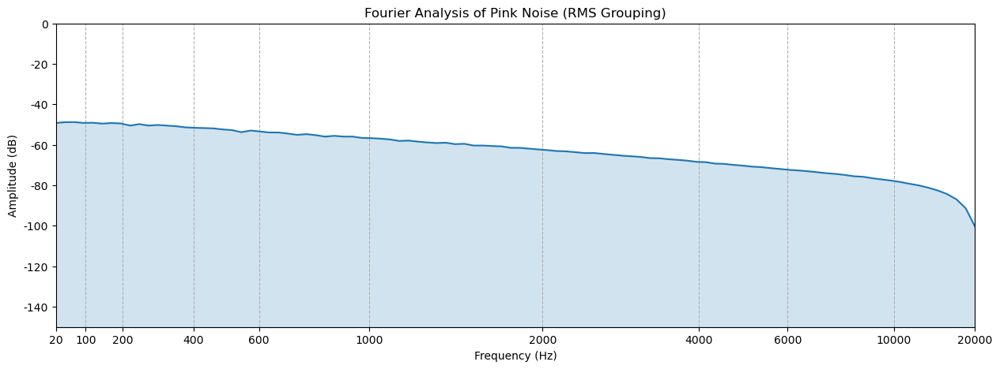

In [87]:
plot_fourier_analysis(generate_white_noise(10), title='Fourier Analysis of White Noise (No Grouping)', group=False)
plot_fourier_analysis(generate_white_noise(10), title='Fourier Analysis of White Noise (RMS Grouping)', group=True)
plot_fourier_analysis(generate_pink_noise(10), title='Fourier Analysis of Pink Noise (No Grouping)', group=False)
plot_fourier_analysis(generate_pink_noise(10), title='Fourier Analysis of Pink Noise (RMS Grouping)', group=True)

Here are some example audio files from this dataset to show what real world data looks like when plotted this way.

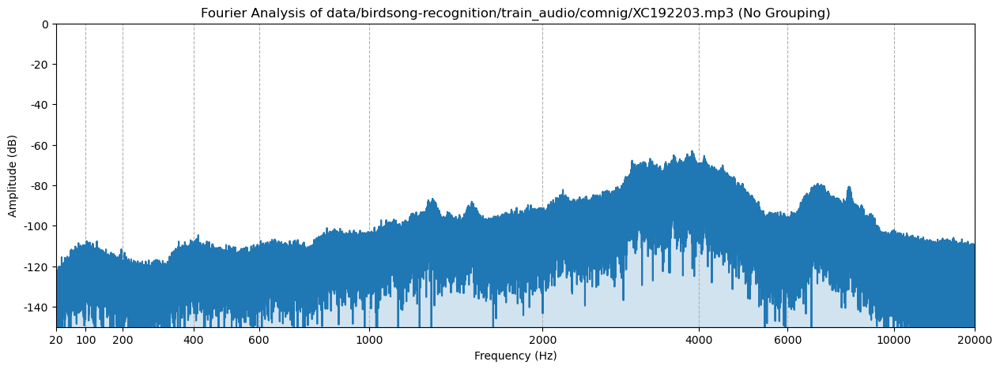

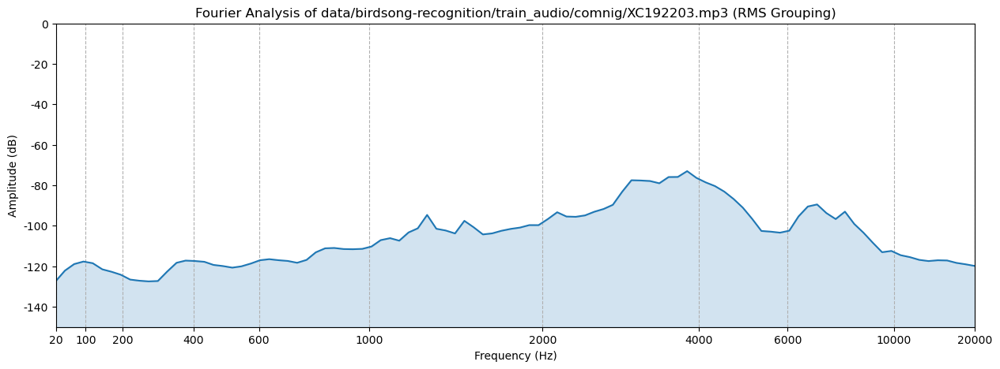

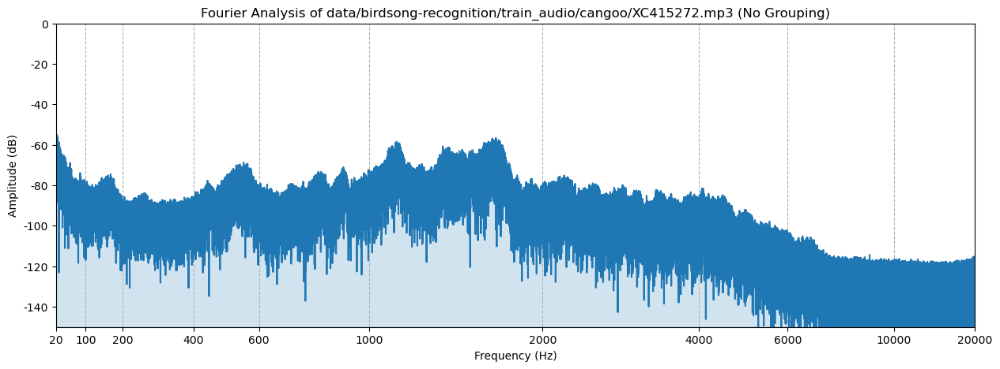

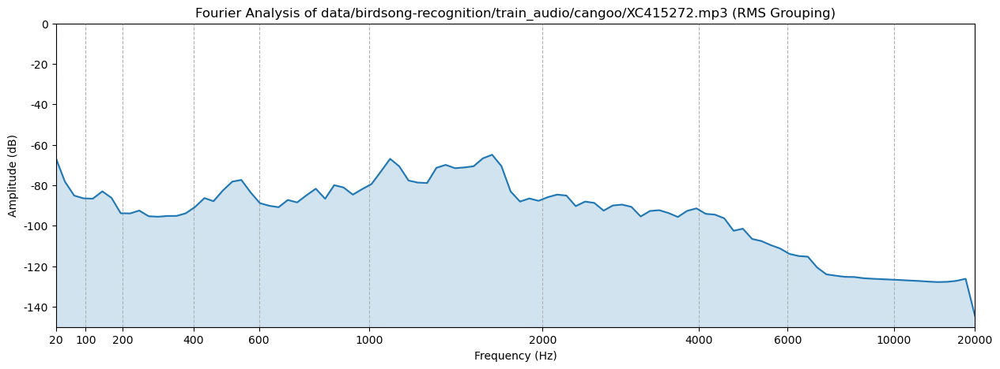

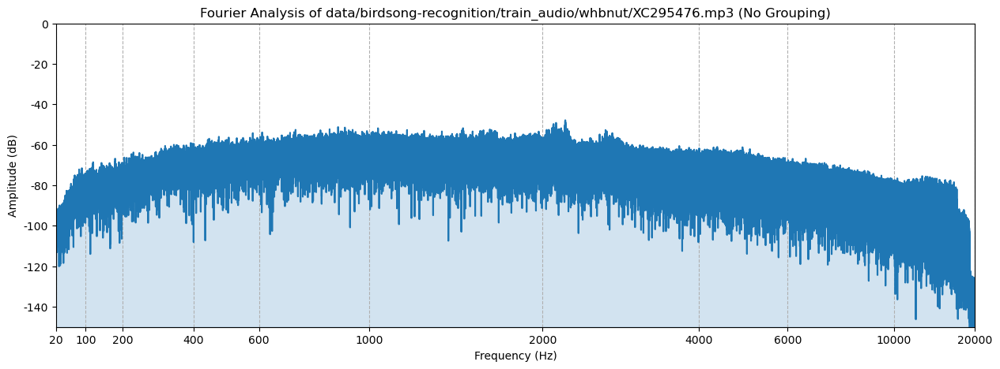

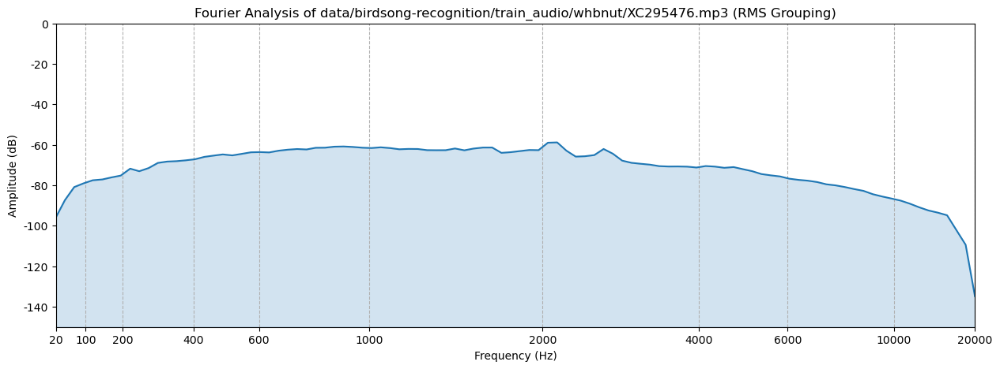

In [88]:
samples = df[df.duration < 60].sample(3).filename.values # Get 3 random samples from the dataframe (less than 1 minute long to prevent long processing times)
for sample in samples:
    sound = load_sound_file(sample)
    plot_fourier_analysis(sound, title=f'Fourier Analysis of {sample} (No Grouping)', group=False)
    plot_fourier_analysis(sound, title=f'Fourier Analysis of {sample} (RMS Grouping)', group=True)

#### b) The Short-Time Fourier Transformation (STFT)
The Short-Time Fourier Transform (STFT) is an extension of the Fourier Transform that analyzes how a signal's frequency content changes over time. It works by segmenting the signal into overlapping windows and performing a Discrete Fourier Transform on each window. This produces a time-frequency representation, making it especially useful for analyzing non-stationary signals where frequency components vary over time.

In [89]:
def short_time_fourier_transform(signal: ndarray, sample_rate: int, nperseg_constant: int=10, noverlap_constant: int=2) -> Tuple[ndarray, ndarray, ndarray]:
    """Calculate the Short Time Fourier Transform (STFT) of an audio signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The audio signal to calculate the STFT of.
        sample_rate (int): The sample rate of the audio signal.
        nperseg_constant (int, optional): The constant to determine the window size used in the formula nperseg = sample_rate / nperseg_constant. Defaults to 10.
        noverlap_constant (int, optional): The constant to determine the overlap size used in the formula noverlap = nperseg / noverlap_constant. Defaults to 2.
    
    Returns
    -------
    - **cp.ndarray|np.ndarray:** The frequencies of the STFT. Matches the input signal type.
    - **cp.ndarray|np.ndarray:** The time values of the STFT. Matches the input signal type.
    - **cp.ndarray|np.ndarray:** The complex time-frequency signal from the STFT. Matches the input signal type.
    """
    sig = sp.signal # Use scipy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        sig = cusig # Use CuPy for GPU operations if the signal is a cupy array
    nperseg = sample_rate // nperseg_constant # Calculate the window size
    noverlap = nperseg // noverlap_constant # Calculate the overlap size

    return sig.stft(signal, fs=sample_rate, nperseg=nperseg, noverlap=noverlap) # Calculate the STFT

##### (i) Advantage of GPU Parallelization when Performing Short-Time Fourier Transformations
The same speed test used for Fourier Transforms, was adapted for STFTs, to compare CPU and GPU performance.

In [90]:
def stft_speed_test(cache_filepath: str, dataset_size_limit: float, iterations: int) -> None:
    """Test the speed of the Short Time Fourier Transform on a dataset of a given size.
    Preload the entire dataset into memory before the timer starts to prevent IO bottlenecks.
    
    Args:
        cache_file_path (str): The path to the cache file for the STFT.
        dataset_size_limit (float): The size of the dataset to test in MB.
        iterations (int): The number of iterations to run the test.
    """
    if os.path.exists(f'exports/{cache_filepath}'): # Check if the cache file exists
        print_boundry(f'{cache_filepath[:-4]} Results')
        cached_df = pd.read_csv(f'exports/{cache_filepath}') # Load the cached results
        cpu_times = cached_df['CPU Time'].values
        gpu_times = cached_df['GPU Time'].values
        improvement = (cpu_times / gpu_times) - 1 # Calculate the improvement
        print(f'Avg CPU Time: {time_to_human_readable(cpu_times.mean(), depth=1)} ± {cpu_times.std():.1f} seconds')
        print(f'Avg GPU Time: {time_to_human_readable(gpu_times.mean(), depth=1)} ± {gpu_times.std():.1f} seconds')
        print(f'Avg GPU Improvement: {improvement.mean():.0%} ± {improvement.std():.0%}')
        return
    
    clear_gpu_memory() # Clear the GPU memory
    print_boundry(f'Running {cache_filepath[:-4]} Test')
    mean_array_size = df['array_size'].mean() # Calculate the mean size of the audio arrays
    dataset_size_limit *= 1024**2 # Convert the dataset size limit to bytes
    print(f'Mean Array Size: {bytes_to_human_readable(mean_array_size)}')
    print(f'Dataset Size Limit: {bytes_to_human_readable(dataset_size_limit)}')
    print(f'Estimated Number of Files: {int(dataset_size_limit / mean_array_size)}')
    cpu_times = [] # Initialize an empty list to store the CPU times
    gpu_times = [] # Initialize an empty list to store the GPU times
    
    for i in range(iterations):
        clear_gpu_memory() # Clear the GPU memory
        print_boundry(f'Iteration {i+1}/{iterations}: Preloading {bytes_to_human_readable(dataset_size_limit)} of data into memory')
        dataset = [] # Initialize an empty list to store the dataset
        dataset_size = 0 # Initialize the dataset size to 0
        print()

        while dataset_size + mean_array_size < dataset_size_limit: # Load samples until the dataset size exceeds the limit
            sample = df.sample(1).iloc[0] # Get a random sample from the dataframe
            if dataset_size + sample.array_size > dataset_size_limit:
                continue
            sound = load_sound_file(sample.filename).split_to_mono()[0] # Load the audio file
            signal_sample_rate_pair = normalize_signal(np.array(sound.get_array_of_samples())), sound.frame_rate # Get the signal and sample rate
            dataset.append(signal_sample_rate_pair) # Add the signal and sample rate to the dataset
            dataset_size += sample.array_size # Add the size of the sample to the dataset size
        
        print(f'Testing CPU STFT Speed with {bytes_to_human_readable(dataset_size)} of data')
        cpu_start = time.time() # Mark the start time
        for signal, sample_rate in dataset: # Iterate through each sample in the dataset
            short_time_fourier_transform(signal, sample_rate) # Calculate the STFT
        cpu_time = time.time() - cpu_start # Calculate the CPU time
        cpu_times.append(cpu_time) # Add the CPU time to the list
        print(f'CPU Time: {cpu_time:.4f} seconds')

        dataset = [(cp.array(signal), sample_rate) for signal, sample_rate in dataset] # Load the dataset to VRAM
        print()
        print(f'Testing GPU STFT Speed with {bytes_to_human_readable(dataset_size)} of data')
        gpu_start = time.time() # Mark the start time
        for signal, sample_rate in dataset: # Iterate through each sample in the dataset
            short_time_fourier_transform(signal, sample_rate) # Calculate the STFT
        gpu_time = time.time() - gpu_start # Calculate the GPU time
        gpu_times.append(gpu_time) # Add the GPU time to the list
        print(f'GPU Time: {gpu_time:.4f} seconds')
        print()
        del dataset # Clear the dataset from memory
        clear_gpu_memory()

    print_boundry(f'{cache_filepath[:-4]} Results')
    cpu_times = np.array(cpu_times)
    gpu_times = np.array(gpu_times)
    improvement = (cpu_times / gpu_times) - 1 # Calculate the improvement
    print(f'Avg CPU Time: {time_to_human_readable(cpu_times.mean(), depth=1)} ± {cpu_times.std():.1f} seconds')
    print(f'Avg GPU Time: {time_to_human_readable(gpu_times.mean(), depth=1)} ± {gpu_times.std():.1f} seconds')
    print(f'Avg GPU Improvement: {improvement.mean():.0%} ± {improvement.std():.0%}')
    cached_df = pd.DataFrame({'CPU Time': cpu_times, 'GPU Time': gpu_times}) # Create a dataframe with the results
    cached_df.to_csv(f'exports/{cache_filepath}', index=False) # Cache the results
    print_boundry() # Separate the results
    print()

In [ ]:
stft_speed_test('STFT_Speed_Test_64MB_10.csv', 64, 10)   # Lets!
stft_speed_test('STFT_Speed_Test_128MB_10.csv', 128, 10) # Run!
stft_speed_test('STFT_Speed_Test_256MB_10.csv', 256, 10) # Some!
stft_speed_test('STFT_Speed_Test_512MB_10.csv', 512, 10) # Tests!
clear_gpu_memory() # Clear the GPU memory

-------------------------------- Running STFT_Speed_Test_64MB_10 Test --------------------------------
Mean Array Size: 5.01 MB
Dataset Size Limit: 64.00 MB
Estimated Number of Files: 12
---------------------- Iteration 1/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU STFT Speed with 60.09 MB of data
CPU Time: 0.3484 seconds

Testing GPU STFT Speed with 60.09 MB of data
GPU Time: 0.0517 seconds

---------------------- Iteration 2/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU STFT Speed with 59.60 MB of data
CPU Time: 0.3419 seconds

Testing GPU STFT Speed with 59.60 MB of data
GPU Time: 0.0229 seconds

---------------------- Iteration 3/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU STFT Speed with 59.20 MB of data
CPU Time: 0.3289 seconds

Testing GPU STFT Speed with 59.20 MB of data
GPU Time: 0.0310 seconds

---------------------- Iteration 4/10: Preloading 64.00 MB of data into memory

##### (ii) The Inverse Short-Time Fourier Transformation
A Fourier Transformation is reversable to produce back the frequencies it represented as a continuous signal, and when they are are bunched together in a Short-Time Fourier Transformation, the movement of the frequencies is also there and can be inverted, meaning a signal can be converted into the time frequency domain, and then back into a signal with no information loss. This also means a signal can be converted into the time-frequency domain, and then modified in that domain, and then converted back into a completely ordinary signal. This serves as the basis for a large subset of signal processes, some of which will be used in this document.

In [ ]:
def inverse_short_time_fourier_transform(signal: ndarray, sample_rate: int, nperseg_constant: int=10, noverlap_constant: int=2) -> ndarray:
    """Calculate the Inverse Short Time Fourier Transform (ISTFT) of an audio signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The audio signal to calculate the ISTFT of.
        sample_rate (int): The sample rate of the audio signal.
        nperseg_constant (int, optional): The constant to determine the window size used in the formula nperseg = sample_rate / nperseg_constant. Defaults to 10.
        noverlap_constant (int, optional): The constant to determine the overlap size used in the formula noverlap = nperseg / noverlap_constant. Defaults to 2.
    
    Returns:
    cp.ndarray|np.ndarray: The audio signal after applying the ISTFT. Matches the input signal type.
    """
    sig = sp.signal # Use scipy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        sig = cusig # Use CuPy for GPU operations if the signal is a cupy array
    nperseg = sample_rate // nperseg_constant # Calculate the window size
    noverlap = nperseg // noverlap_constant # Calculate the overlap size

    return sig.istft(signal, fs=sample_rate, nperseg=nperseg, noverlap=noverlap)[1] # Calculate the ISTFT. The 0th value is the time values, the 1st value is the audio signal.

##### (iii) the NOLA and COLA Constraints

Fourier transformations and short time fourier transformtaions have different resolutions and properties depending on the size and shape of the array going into them, and for a short time fourier transformation to be fully reversable with no loss it is important the window follows a few rules about how they overlap based on the Non-zero OverLap Add contstrain and the Constant Overlap Add constraints. There are many solutions to both of those constrains and why they exist is quite interesting and complicated but the important thing is that the windows of short time fourier transformations were tested against the `scipy.signal.check_NOLA` and `scipy.signal.check_COLA` functions.

##### (iv) Grouping Frequencies Together

If time-frequency representations are used as an input array, it is also important to group the frequencies of the STFT as well. Below is a function to groups frequencies from an STFT.

In [ ]:
def group_time_frequencies(frequencies: ndarray,
                           time_freq_signal: ndarray,
                           num_groups: int=100,
                           ) -> Tuple[ndarray, ndarray]:
    """Group the frequency values of a Short Time Fourier Transform into a smaller array.
    Each group is spaced evenly along the Bark Scale. The time values are kept the same.
    GPU operations are quite slow so this function converts the arrays to numpy arrays before processing.
    
    Args:
        frequencies (cp.ndarray | np.ndarray): The frequencies of the Short Time Fourier Transform.
        time_freq_signal (cp.ndarray | np.ndarray): The resulting complex signal from the Short Time Fourier Transform.
        num_groups (int, optional): The number of frequency groups to create. Defaults to 100.
    
    Returns
    -------
    - **cp.ndarray|np.ndarray:** The grouped frequencies. Matches the input signal type.
    - **cp.ndarray|np.ndarray:** The magnitude value for the bin. Matches the input signal type.
    """
    to_cupy = False # Marker to reconvert the arrays to cupy arrays
    if isinstance(frequencies, cp.ndarray):
        to_cupy = True # If the arrays are cupy arrays, mark them for conversion
        frequencies = frequencies.get()
        time_freq_signal = time_freq_signal.get()

    freq_bins = get_bark_spaced_frequencies(num_groups, np.__name__) # Get the Bark spaced frequencies
    reduced_time_freq_signal = np.zeros((num_groups, time_freq_signal.shape[1])) # Initialize the reduced time-frequency signal array
    for i in range(time_freq_signal.shape[1]): # Iterate over each column (time slice)
        freq_bins, reduced_time_freq_signal[:, i] = group_frequencies(frequencies, time_freq_signal[:, i], freq_bins, num_groups) # Group the frequencies for each time slice
    
    if to_cupy:
        return cp.array(freq_bins), cp.array(reduced_time_freq_signal) # Convert the arrays back to cupy arrays
    return freq_bins, reduced_time_freq_signal # Return the grouped frequencies and maximum magnitudes

##### (v) Example Spectrograms

In [ ]:
def plot_spectrogram(sound: AudioSegment, title: str='Spectrogram', group: bool=True) -> None:
    """Plots the spectrogram of an audio signal from the results of a Short Time Fourier Transform.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str, optional): The title of the plot. Defaults to 'Spectrogram'.
        group (bool, optional): Dictates if and how the frequencies should be grouped. Defaults to True.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]

    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal) # Normalize the signal to the range [-1,1]
    frequencies, times, time_freq_signal = short_time_fourier_transform(signal, sound.frame_rate) # Calculate the STFT
    if group: # If the frequencies should be grouped
        frequencies, time_freq_signal = group_time_frequencies(frequencies, time_freq_signal) # Group the frequencies
    time_freq_signal = magnitude_to_db(time_freq_signal) # Convert the magnitudes to decibels

    plt.figure(figsize=(15, 5)) # Set the figure size   
    plt.title(title)
    plt.pcolormesh(times, hz_to_bark(frequencies), time_freq_signal, cmap='plasma') # Plot the spectrogram
    yticks = np.array([20, 200, 500, 1000, 2000, 5000, 10000, 20000]) # Set the y-ticks 
    plt.ylim(hz_to_bark(20), hz_to_bark(20000)) # Set the y-axis limits to the Bark scale
    plt.yticks(hz_to_bark(yticks), yticks) # Convert the y-ticks to the Bark scale
    plt.ylabel('Frequency (Hz)')
    xticks = np.linspace(0, times[-1], 10) # Set the x-ticks
    depth = 2 if times[-1] > 10 else 1
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, times[-1]) # Set the x-axis limits
    plt.xticks(xticks, xticks_labels)
    plt.xlabel('Time')
    plt.colorbar(label='Amplitude (dB)')
    plt.clim(-120, 0) # Set the color limits
    plt.show()

In the function below all maps showing '(RMS Grouping)' exist as 100x100 matrixes exactly as a machine learning algorithm might see them.

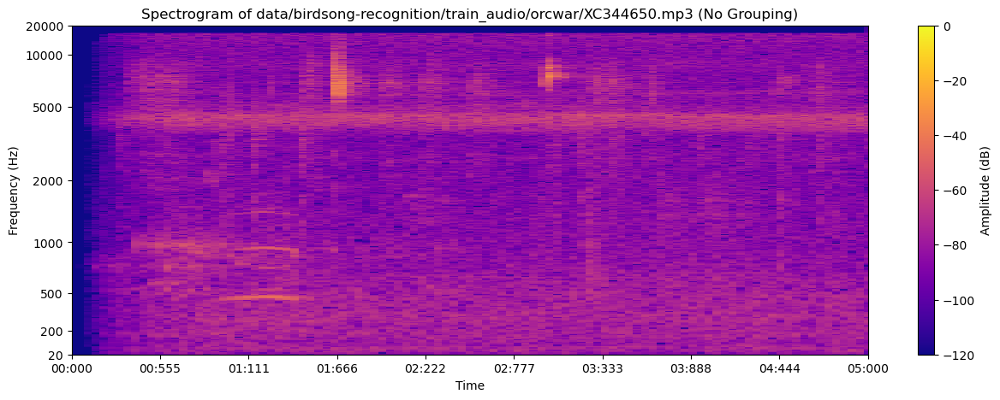

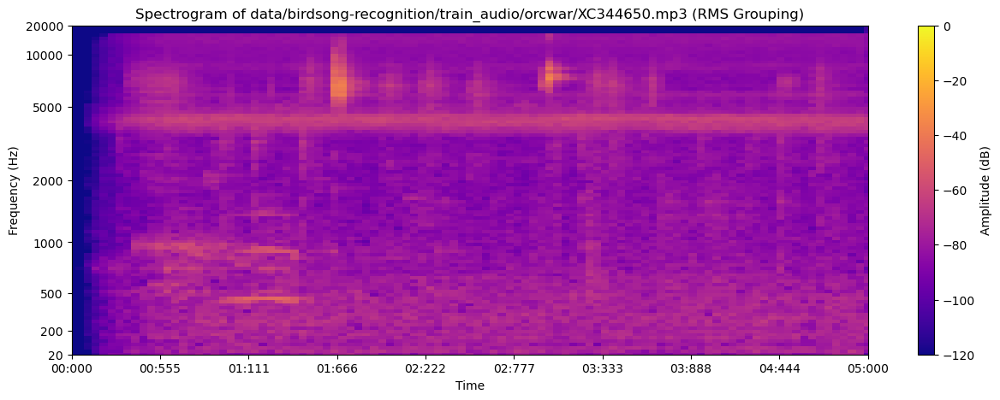

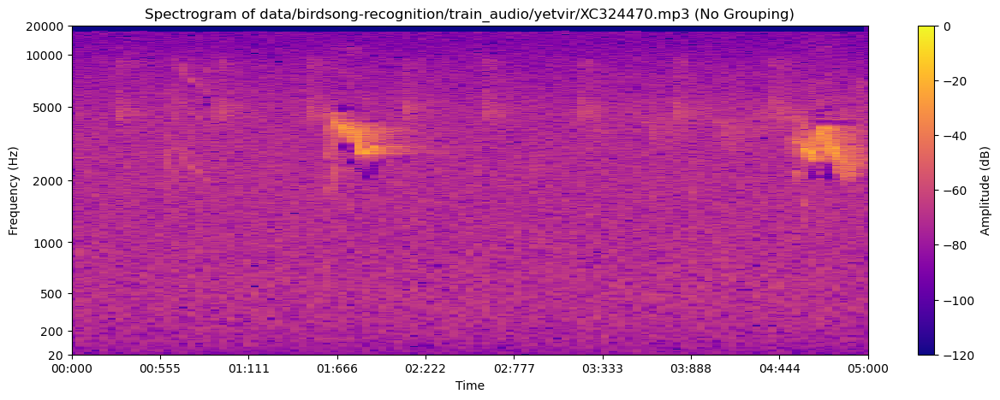

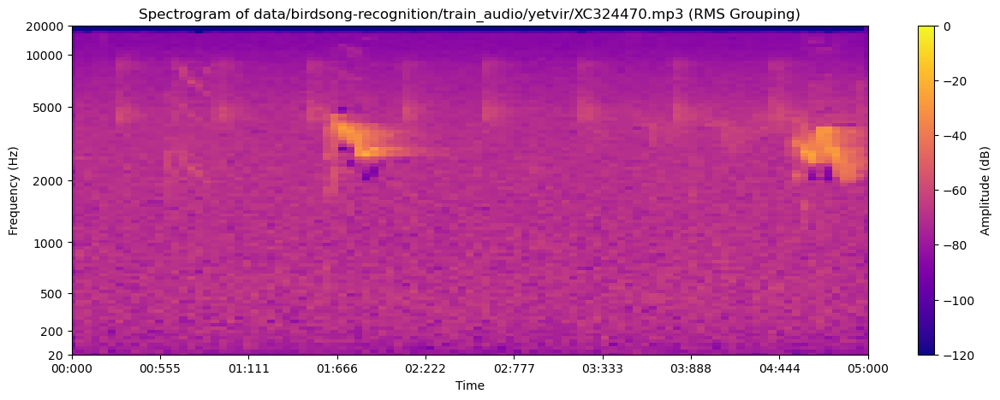

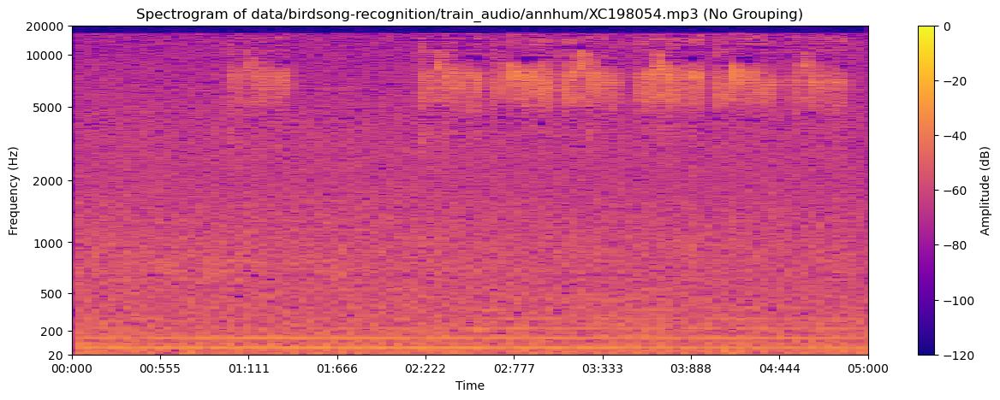

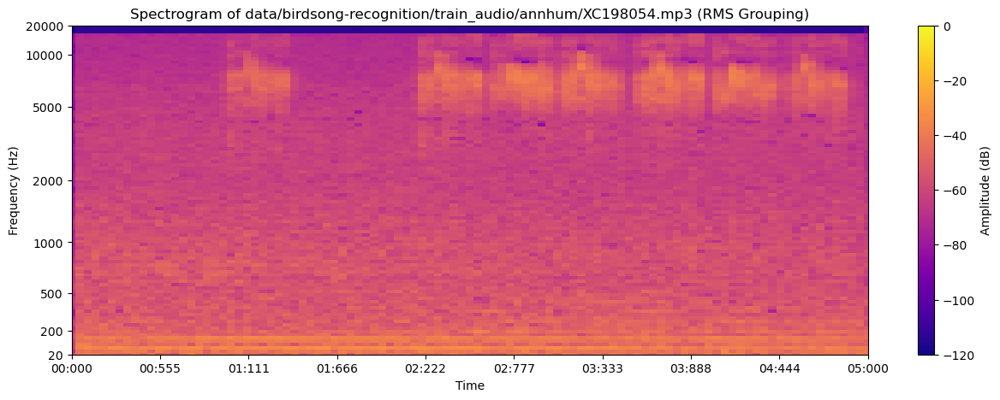

In [ ]:
samples = df[df.duration > 5].sample(3).filename.values
for sample in samples:
    sound = load_sound_file(sample)
    sound = sound[:4999]
    plot_spectrogram(sound, title=f'Spectrogram of {sample} (No Grouping)', group=False)
    plot_spectrogram(sound, title=f'Spectrogram of {sample} (RMS Grouping)', group=True)

#### c) The Hilbert Transformation

The last major signal transformation performed in this document is the hilbert transformation which provides a way to look at the signal from a different light. The basis is that if a signal is put into a time frequency domain, and the phase of the entire signal is shifted, and the signal is reconverted back into just the time domain, the signal exists as a complex time signal refered to as an analytic signal. The analytic signal contains useful information about the signal.

In [ ]:
def hilbert_transform(signal: ndarray) -> ndarray:
    """Calculate the analytic signal of a real valued signal using the Hilbert Transform.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to calculate the analytic signal of.
    
    Returns:
        cp.ndarray|np.ndarray: The analytic signal. Return type matches the input signal type.
    """
    sig = sp.signal # Use scipy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        sig = cusig # Use CuPy for GPU operations if the signal is a cupy array
    return sig.hilbert(signal) # Calculate the analytic signal

##### (i) Understanding the Analytic Signal

<img src='https://upload.wikimedia.org/wikipedia/commons/8/89/Unfasor.gif'>

In the figure above you can see a direct comparison between the original signal and the analytic signal. By shifting the signal into the complex plane the signal no longer travels through the origin, but instead around the origin in the complex plane. This gives us information about the overal magnitude of the signal, or what is refered to as the envelope of the signal, as well as retaining information about the original real signal in the form of the real value of the analytic signal. In the figure above you can see how the real signal and complex signal map to eachother perfectly. As well as both the real signal and the envelope, information about the instantaneous phase of the signal can also be extracted, which is very interesting, but not useful for this project.

##### (ii) Advantage of GPU Parallelization when Performing Hilbert Transformations

In [ ]:
def hilbert_transform_speed_test(cache_filepath: str, dataset_size_limit: float, iterations: int) -> None:
    """Test the speed of the Hilbert Transform on a dataset of a given size.
    Preload the entire dataset into memory before the timer starts to prevent IO bottlenecks.
    
    Args:
        cache_file_path (str): The path to the cache file for the Hilbert Transform.
        dataset_size_limit (float): The size of the dataset to test in MB.
        iterations (int): The number of iterations to run the test.
    """
    if os.path.exists(f'exports/{cache_filepath}'): # Check if the cache file exists
        print_boundry(f'{cache_filepath[:-4]} Results')
        cached_df = pd.read_csv(f'exports/{cache_filepath}') # Load the cached results
        cpu_times = cached_df['CPU Time'].values
        gpu_times = cached_df['GPU Time'].values
        improvement = (cpu_times / gpu_times) - 1 # Calculate the improvement
        print(f'Avg CPU Time: {time_to_human_readable(cpu_times.mean(), depth=1)} ± {cpu_times.std():.1f} seconds')
        print(f'Avg GPU Time: {time_to_human_readable(gpu_times.mean(), depth=1)} ± {gpu_times.std():.1f} seconds')
        print(f'Avg GPU Improvement: {improvement.mean():.0%} ± {improvement.std():.0%}')
        return
    
    clear_gpu_memory() # Clear the GPU memory
    print_boundry(f'Running {cache_filepath[:-4]} Test')
    mean_array_size = df['array_size'].mean() # Calculate the mean size of the audio arrays
    dataset_size_limit *= 1024**2 # Convert the dataset size limit to bytes
    print(f'Mean Array Size: {bytes_to_human_readable(mean_array_size)}')
    print(f'Dataset Size Limit: {bytes_to_human_readable(dataset_size_limit)}')
    print(f'Estimated Number of Files: {int(dataset_size_limit / mean_array_size)}')
    cpu_times = [] # Initialize an empty list to store the CPU times
    gpu_times = [] # Initialize an empty list to store the GPU times

    for i in range(iterations):
        clear_gpu_memory() # Clear the GPU memory
        print_boundry(f'Iteration {i+1}/{iterations}: Preloading {bytes_to_human_readable(dataset_size_limit)} of data into memory')
        dataset = []
        dataset_size = 0
        print()

        while dataset_size + mean_array_size < dataset_size_limit: # Load samples until the dataset size exceeds the limit
            sample = df.sample(1).iloc[0] # Get a random sample from the dataframe
            if dataset_size + sample.array_size > dataset_size_limit:
                continue
            sound = load_sound_file(sample.filename).split_to_mono()[0] # Load the audio file
            signal = normalize_signal(np.array(sound.get_array_of_samples())) # Get the signal
            dataset.append(signal) # Add the signal to the dataset
            dataset_size += sample.array_size # Add the size of the sample to the dataset size
        
        print(f'Testing CPU Hilbert Transform Speed with {bytes_to_human_readable(dataset_size)} of data')
        cpu_start = time.time() # Mark the start time
        for signal in dataset: # Iterate through each sample in the dataset
            hilbert_transform(signal) # Calculate the Hilbert Transform
        cpu_time = time.time() - cpu_start # Calculate the CPU time
        cpu_times.append(cpu_time) # Add the CPU time to the list
        print(f'CPU Time: {cpu_time:.4f} seconds')

        dataset = [cp.array(signal) for signal in dataset] # Load the dataset to VRAM
        print()
        print(f'Testing GPU Hilbert Transform Speed with {bytes_to_human_readable(dataset_size)} of data')
        gpu_start = time.time() # Mark the start time
        for signal in dataset: # Iterate through each sample in the dataset
            hilbert_transform(signal) # Calculate the Hilbert Transform
        gpu_time = time.time() - gpu_start # Calculate the GPU time
        gpu_times.append(gpu_time) # Add the GPU time to the list
        print(f'GPU Time: {gpu_time:.4f} seconds')
        print()
        del dataset # Clear the dataset from memory
        clear_gpu_memory() # Clear the GPU memory

    print_boundry(f'{cache_filepath[:-4]} Results')
    cpu_times = np.array(cpu_times)
    gpu_times = np.array(gpu_times)
    improvement = (cpu_times / gpu_times) - 1 # Calculate the improvement
    print(f'Avg CPU Time: {time_to_human_readable(cpu_times.mean(), depth=1)} ± {cpu_times.std():.1f} seconds')
    print(f'Avg GPU Time: {time_to_human_readable(gpu_times.mean(), depth=1)} ± {gpu_times.std():.1f} seconds')
    print(f'Avg GPU Improvement: {improvement.mean():.0%} ± {improvement.std():.0%}')
    cached_df = pd.DataFrame({'CPU Time': cpu_times, 'GPU Time': gpu_times}) # Create a dataframe with the results
    cached_df.to_csv(f'exports/{cache_filepath}', index=False) # Cache the results
    print_boundry() # Separate the results
    print()

In [ ]:
hilbert_transform_speed_test('Hilbert_Speed_Test_64MB_10.csv', 64, 10)   # Lets!
hilbert_transform_speed_test('Hilbert_Speed_Test_128MB_10.csv', 128, 10) # Run!
hilbert_transform_speed_test('Hilbert_Speed_Test_256MB_10.csv', 256, 10) # Some!
hilbert_transform_speed_test('Hilbert_Speed_Test_512MB_10.csv', 512, 10) # Tests!

clear_gpu_memory() # Clear the GPU memory

------------------------------ Running Hilbert_Speed_Test_64MB_10 Test ------------------------------
Mean Array Size: 5.01 MB
Dataset Size Limit: 64.00 MB
Estimated Number of Files: 12
---------------------- Iteration 1/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU Hilbert Transform Speed with 62.33 MB of data
CPU Time: 2.9392 seconds

Testing GPU Hilbert Transform Speed with 62.33 MB of data
GPU Time: 0.2428 seconds

---------------------- Iteration 2/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU Hilbert Transform Speed with 59.28 MB of data
CPU Time: 3.7502 seconds

Testing GPU Hilbert Transform Speed with 59.28 MB of data
GPU Time: 0.1426 seconds

---------------------- Iteration 3/10: Preloading 64.00 MB of data into memory ----------------------

Testing CPU Hilbert Transform Speed with 60.00 MB of data
CPU Time: 3.2837 seconds

Testing GPU Hilbert Transform Speed with 60.00 MB of data
GPU Time: 0.1434 seconds

-

OutOfMemoryError: Out of memory allocating 6,039,797,760 bytes (allocated so far: 5,023,877,120 bytes, limit set to: 12,448,088,064 bytes).

##### (iii) Example Plots of Analytic Envelopes

In [ ]:
def plot_analytic_envelope(sound: AudioSegment, title: str='Analytic Envelope', emphasis: int=1, normalization_constsnt: Optional[int]=None) -> None:
    """Plot the Analytic Envelope of an audio signal using the Hilbert Transform.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str, optional): The title of the plot. Defaults to 'Analytic Envelope'.
        emphasis (int, optional): The line width of the envelope. Defaults to 1.
        normalization_constant (int, optional): The constant to normalize the signal by. Defaults to None.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]

    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal, normalization_constsnt) # Normalize the signal to the range [-1,1]
    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    envelope = np.abs(analytic_signal) # Calculate the envelope of the analytic signal
    time = signal_to_time(signal, sound.frame_rate) # Calculate the time values for each sample

    plt.figure(figsize=(15, 3)) # Long figure to show the RMS signal clearly
    plt.plot(time, signal, label='Signal', color='tab:blue') # Plot the original signal
    plt.plot(time, envelope, label='Envelope', color='tab:pink', alpha=0.9, linewidth=emphasis) # Plot the envelope
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude (dB)')
    plt.axhline(0, color='black', linewidth=0.5) # Add a horizontal black centerline
    yticks = np.linspace(-1.2, 1.2, 17) # Add y-ticks
    yticks_labels = [f'{magnitude_to_db(y):.0f}' for y in yticks] # Convert the y-ticks to decibels and round to the nearest whole number
    yticks_labels[8] = '-∞' # Replace the center y-tick with negative infinity
    plt.ylim(-1.2, 1.2)
    plt.yticks(yticks, yticks_labels)
    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1 # Set the depth of the time values
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    plt.legend()
    plt.show()

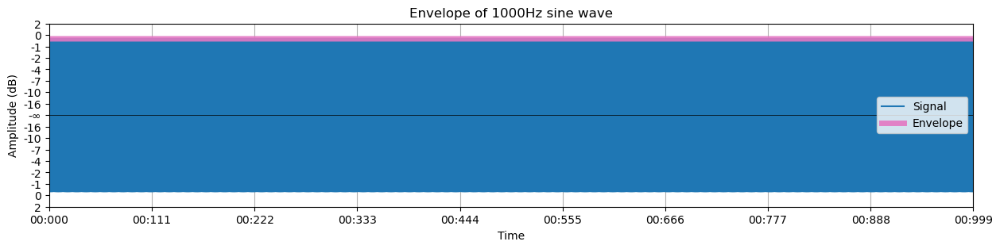

In [ ]:
plot_analytic_envelope(generate_sine_wave(1000, 1),
                      title='Envelope of 1000Hz sine wave',
                      emphasis=5) # The line should be straight in this case, so we can emphasize it

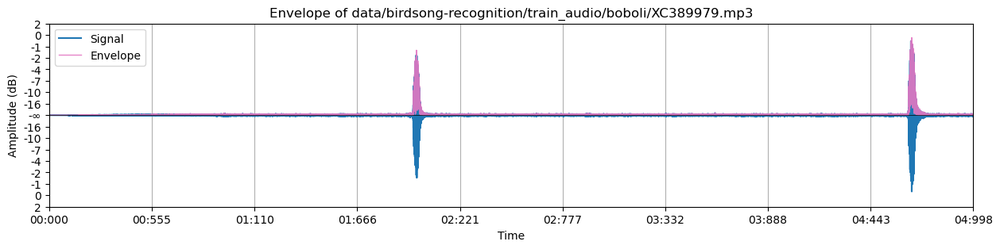

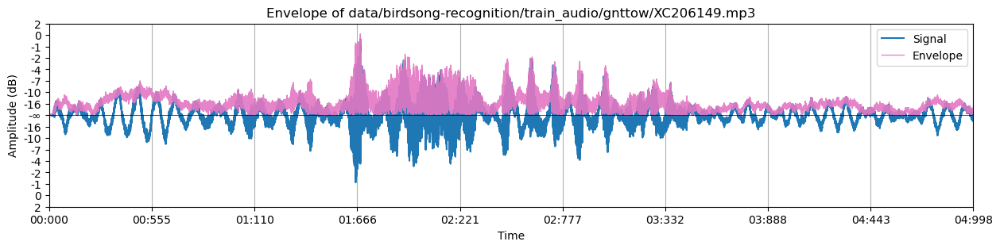

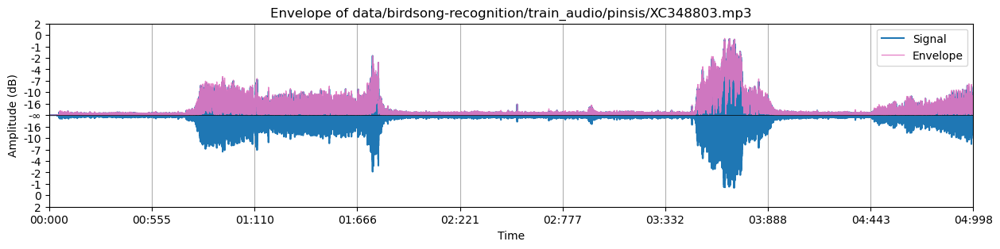

In [ ]:
samples = df[df.duration > 5].sample(3).filename.values
for sample in samples:
    sound = load_sound_file(sample)
    sound = sound[:4999]
    plot_analytic_envelope(sound, title=f'Envelope of {sample}')

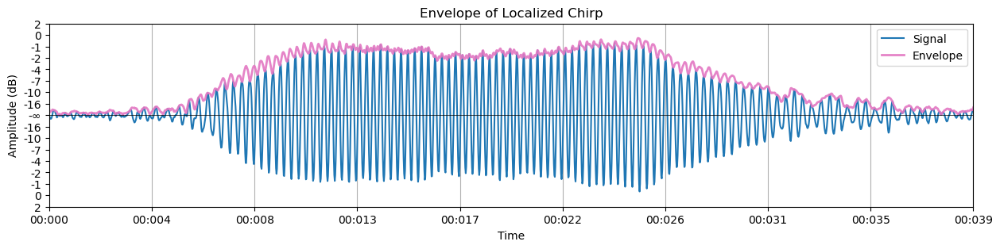

<_io.BufferedRandom name='exports/localized_chirp.wav'>

In [ ]:
sample = df.filename.iloc[0]
sound = load_sound_file(sample)
sound = sound[1430:1470]
plot_analytic_envelope(sound, title=f'Envelope of Localized Chirp', emphasis=2)
sound.export('exports/localized_chirp.wav', format='wav')

<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/localized_chirp.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

##### (vii) Example Plots of Signal Phase Angles
Everything below is purely for the curiosity of hilbert transformations. We will not be tracking the instantaneous phase of any signals in this project.

In [ ]:
def plot_analytic_phase(sound: AudioSegment, title: str='Analytic Phase', normalization_constant: Optional[int]=None):
    """Plot the Analytic Phase of an audio signal using the Hilbert Transform.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str, optional): The title of the plot. Defaults to 'Analytic Phase'.
        normalization_constant (int, optional): The constant to normalize the signal by. Defaults to None.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]
    
    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal, normalization_constant) # Normalize the signal to the range [-1,1]
    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    phase = np.angle(analytic_signal) # Calculate the phase of the analytic signal
    phase = phase / (np.pi * 2) # Normalize the phase to the range [-0.5,0.5] for plotting
    time = signal_to_time(signal, sound.frame_rate) # Calculate the time values for each sample

    plt.figure(figsize=(15, 3))
    plt.plot(time, signal, label='Signal', color='tab:blue') # Plot the original signal
    plt.plot(time, phase, label='Phase' ,color='tab:orange', alpha=0.9) # Plot the phase
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude (dB)')
    plt.axhline(0, color='black', linewidth=0.5) # Add a horizontal black centerline
    yticks = np.linspace(-1, 1, 15) # Add y-ticks for the signal
    yticks_labels = [f'{magnitude_to_db(y):.0f}' for y in yticks] # Convert the y-ticks to decibels and round to the nearest whole number
    yticks_labels[7] = '-∞' # Replace the center y-tick with negative infinity
    plt.ylim(-1, 1)
    plt.yticks(yticks, yticks_labels)

    plt.axhline(0.5, color='grey', linestyle='--', linewidth=0.5) # Add a horizontal grey edge line for phase
    plt.axhline(-0.5, color='grey', linestyle='--', linewidth=0.5) # Add a horizontal grey edge line for phase
    ax2 = plt.gca().twinx() # Create a second y-axis with the phase information
    yticks_phase = np.linspace(-0.5, 0.5, 5) # Add y-ticks for the phase signal
    yticks_phase_labels = ['-π', '-π/2', '0', 'π/2', 'π'] # Add y-ticks for the phase signal
    ax2.set_ylim(-1, 1)
    ax2.set_yticks(yticks_phase)
    ax2.set_yticklabels(yticks_phase_labels)
    ax2.set_ylabel('Phase (radians)')

    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1 # Set the depth of the time values
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    plt.show()

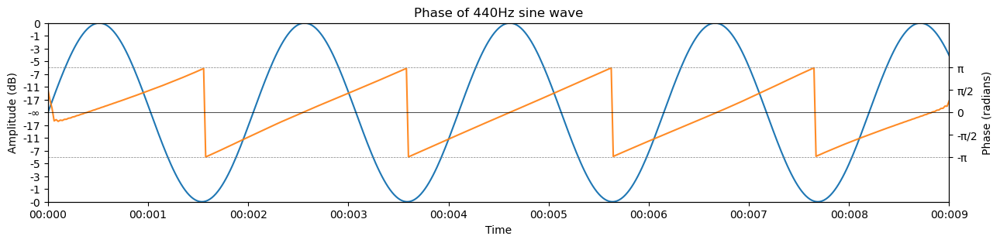

In [ ]:
sound = generate_sine_wave(440, 1)
sound = sound[:10]
plot_analytic_phase(sound, title='Phase of 440Hz sine wave')

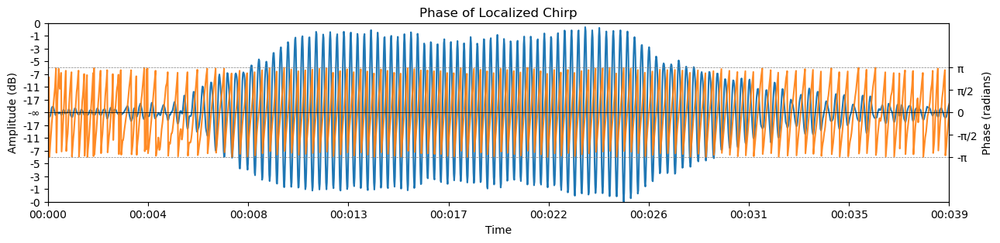

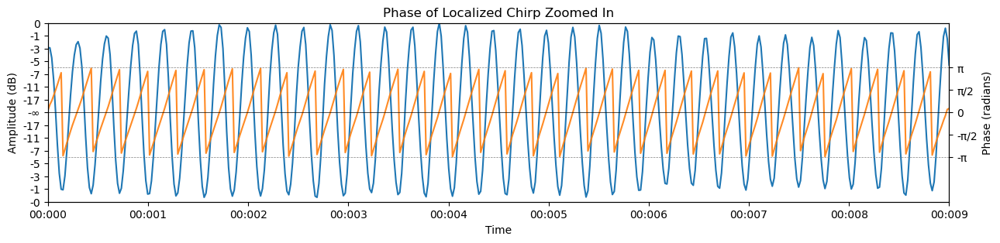

In [ ]:
sample = df.filename.iloc[0]
sound = load_sound_file(sample)
sound = sound[1430:1470]
plot_analytic_phase(sound, title=f'Phase of Localized Chirp')
sound = sound[10:20]
plot_analytic_phase(sound, title=f'Phase of Localized Chirp Zoomed In')

## B. Generation of Raw Frequency Representation Dataset
The first generated will be the results of performing a Discrete Fourier Transformation on each individual audio signal as is, and grouping each frequency into 100 bins evenly spaced along the Bark scale. Each of the magnitude values will be normalized to the range [0,1] where anything below -120db is mapped to 0 and 0db is mapped to 1. Those magnitude values will be added to a dataframe.

### 1. Performing the Bulk Calculation

In [ ]:
def normalize_decibels(signal: ndarray) -> ndarray:
    """Normalize the decibel values of a signal to the range [0,1] from -120 to 0 db.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray): The signal to normalize.
    
    Returns:
        cp.ndarray|np.ndarray: The normalized signal. Return type matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU operations if the signal is a cupy array

    signal = math.clip(signal, -120, 0) # Clip the signal to the range [-120,0]
    signal = signal + 120 # Shift the signal to the range [0,120]
    signal = signal / 120 # Normalize the signal to the range [0,1]
    return signal

In [ ]:
freq_bins = get_bark_spaced_frequencies(100, np.__name__) # Get the Bark spaced frequencies
new_columns = {f'{int(freq)}Hz': 0 for freq in freq_bins} # Create a dictionary with the new column names
new_columns_df = pd.DataFrame(new_columns, index=df.index) # Create a dataframe with the new columns
raw_frequency_df = pd.concat([df, new_columns_df], axis=1) # Concatenate the new columns to the dataframe
raw_frequency_df.head() # Display the first few rows of the dataframe

,rating,ebird_code,channels,date,duration,filename,latitude,sampling_rate,type,elevation,...,9862Hz,10403Hz,11010Hz,11700Hz,12495Hz,13428Hz,14548Hz,15925Hz,17676Hz,19999Hz
0,3.5,aldfly,1,0.394521,25.488,data/birdsong-recognition/train_audio/aldfly/X...,0.748850,48000,call,0.144654,...,0,0,0,0,0,0,0,0,0,0
1,4.0,aldfly,2,0.400000,36.310,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0,0,0,0,0,0,0,0,0,0
2,4.0,aldfly,2,0.400000,39.236,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0,0,0,0,0,0,0,0,0,0
3,3.5,aldfly,2,0.400000,33.593,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0,0,0,0,0,0,0,0,0,0
4,4.0,aldfly,2,0.400000,36.023,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0,0,0,0,0,0,0,0,0,0


Because of the large number of points of data and the processing power required to perform a discrete fourier transformation, the dataframe was split into batches of 1gb of audio, and any files longer than 5 minutes were split into equal sized smaller files and processed individually, because performaing fourier transformations on excessively long files is too computationally intensive for my GPU to be able to handle.

In [ ]:
def generate_raw_frequency_df_from_batch(batch: pd.DataFrame, display_handler: Optional[DisplayHandle]=None) -> pd.DataFrame:
    """Generate a dataframe with the raw frequency values of each audio file in a batch.
    Return the dataframe with the new columns.
    Prints the progress of the operation using the display handler.

    Args:
        batch (pd.DataFrame): The batch of audio files to process.
        display_handler (DisplayHandle, optional): The display handler to show the progress. Defaults to None.
    
    Returns:
        pd.DataFrame: The dataframe with the raw frequency values of each audio file.
    """
    clear_gpu_memory() # Clear the GPU memory

    # LOAD EVERYTHING INTO THE GPU FIRST FOR FASTER PROCESSING
    index_signal_sample_size = [] # Initialize an empty list to store the index, signal, and sample rates. Getting everythong ready and on the gpu
    count = 0 # Initialize a counter to 0
    for index, row in batch.iterrows(): 
        count += 1 # Increment the counter
        sound = load_sound_file(row.filename) # Load the audio file
        max_duration = 5 # Set the maximum duration in minutes
        max_duration *= 60*1000 # Convert the maximum duration to milliseconds
        channels = [sound] # Initialize an empty list to store the channels
        size = row.array_size # Get the size of the audio file

        while len(channels[0]) > max_duration: # Split the audio file into smaller chunks if it exceeds the maximum duration
            size = size // 2 # Halve the size of the audio file
            split_time = len(channels[0]) // 2 # Split the audio file in half
            first_half = [channel[:split_time] for channel in channels] # Get the first half of the audio file
            second_half = [channel[split_time:] for channel in channels] # Get the second half of the audio file
            channels = first_half + second_half # Combine the two halves

        channels = [sample for channel in channels for sample in channel.split_to_mono()] # Split the audio file into mono channels and flatten the list
        for channel in channels: # Iterate through each channel
            index_signal_sample_size.append((index, cp.array(channel.get_array_of_samples()), channel.frame_rate, size)) # Add the index, signal, sample rate, and size to the list
        display_handler = print_progress_bar(count, len(batch), 'Loading Batch Signals', display_handler)

    # CALCULATE THE FREQUENCY VALUES
    count = 0 # Reset the counter to 0
    index_signal_size = [] # Initialize an empty list to store the signal and index pairs 
    for index, signal, sample_rate, size in index_signal_sample_size:
        count += 1 # Increment the counter
        signal = normalize_signal(signal) # Normalize the signal to the range [-1,1]
        frequencies, freq_signal = fourier_transform(signal, sample_rate) # Calculate the Fourier Transform
        frequencies, freq_signal = group_frequencies(frequencies, freq_signal) # Group the frequencies to minimize the number of columns
        freq_signal = magnitude_to_db(freq_signal) # Convert the magnitudes to decibels
        freq_signal = normalize_decibels(freq_signal) # Normalize the decibels to the range [0,1]
        index_signal_size.append((index, freq_signal, size)) # Add the index and signal to the list
        display_handler = print_progress_bar(count, len(index_signal_sample_size), 'Converting Signal To Frequency Domain', display_handler)
    index_signal_size = [(index, freq_signal.get(), size) for index, freq_signal, size in index_signal_size] # Move the signals out of the gpu
    
    # ADD THE FREQUENCY VALUES TO THE DATAFRAME
    count = 0 # Reset the counter to 0
    batch_frequency_df = pd.DataFrame(columns=batch.columns) # Initialize a dataframe to store the frequency values
    for index, freq_signal, size in index_signal_size: # Iterate through each index and frequency signal
        count += 1 # Increment the counter
        row = batch.loc[index].copy() # Get the row from the batch
        row['array_size'] = size # Update the size of the audio file if it has changed (some files are shrunk)
        freq_bins = get_bark_spaced_frequencies(len(freq_signal), np.__name__) # Get the Bark spaced frequencies
        for freq, value in zip(freq_bins, freq_signal):
            row[f'{int(freq)}Hz'] = value
        batch_frequency_df = pd.concat([batch_frequency_df, row.to_frame().T], ignore_index=True)
        display_handler = print_progress_bar(count, len(index_signal_size), 'Adding Frequency Values To Dataframe', display_handler)

    del index_signal_sample_size, index_signal_size # Clear the signals from memory
    clear_gpu_memory() # Clear the GPU memory
    return batch_frequency_df, display_handler # Return the dataframe with the frequency values

In [ ]:
if not os.path.exists('exports/raw_frequency_df.csv'): # If the dataframe has not been cached
    print_boundry('Creating Raw Frequency DataFrame')
    start_time = time.time() # Mark the start time
    batch_display_handler = None # Initialize the display handler displaying sub-progress
    total_display_handler = print_progress_bar(0,
                                               raw_frequency_df.total_array_size.sum(),
                                               calculate_time_remaining(start_time, 0, raw_frequency_df.total_array_size.sum()),
                                               treat_as_data=True) # Initialize the display handler displaying total progress
    batch_size_limit = 1 # Set the batch size limit in GB
    batch_size_limit *= 1024**3 # Convert the batch size limit to bytes
    batch_size = 0 # Initialize the batch size
    batch = [] # Initialize an empty list to store the batch data
    new_frequency_df = pd.DataFrame(columns=raw_frequency_df.columns) # Initialize a new dataframe to store the frequency values

    index = 0 # Initialize the index to outside of the for loop to be able to access the "next" row from the for loop itself.
    row = raw_frequency_df.iloc[0] # Initialize the row as well
    for next_index, next_row in raw_frequency_df[1:].iterrows(): # Iterate through each row in the dataframe
        batch.append(row) # Add the row to the batch
        batch_size += row.total_array_size # Add the size of the row to the batch size
        if batch_size + next_row.total_array_size > batch_size_limit: # If the batch size exceeds the limit
            batch = pd.DataFrame(batch) # Convert the batch to a dataframe
            batch_df, batch_display_handler = generate_raw_frequency_df_from_batch(batch, batch_display_handler) # Process the batch
            new_frequency_df = pd.concat([new_frequency_df, batch_df]) # Concatenate the batch dataframe to the new dataframe
            total_display_handler = print_progress_bar(new_frequency_df.array_size.sum(),
                                                       raw_frequency_df.total_array_size.sum(),
                                                       calculate_time_remaining(start_time,
                                                                                new_frequency_df.array_size.sum(),
                                                                                raw_frequency_df.total_array_size.sum()),
                                                       total_display_handler,
                                                       treat_as_data=True) # Update the total progress
            batch_size = 0 # Reset the batch size
            batch = [] # Reset the batch
        index = next_index # Update the index
        row = next_row # Update the row
    
    batch.append(row) # Add the last row to the batch
    batch = pd.DataFrame(batch) # Convert the last batch to a dataframe
    batch_df, batch_display_handler = generate_raw_frequency_df_from_batch(batch, batch_display_handler) # Process the last batch
    new_frequency_df = pd.concat([new_frequency_df, batch_df]) # Concatenate the last batch dataframe to the new dataframe
    total_display_handler = print_progress_bar(new_frequency_df.array_size.sum(),
                                               raw_frequency_df.total_array_size.sum(),
                                               calculate_time_remaining(start_time,
                                                                        new_frequency_df.array_size.sum(),
                                                                        raw_frequency_df.total_array_size.sum()),
                                               total_display_handler,
                                               treat_as_data=True) # Update the total progress
    
    new_frequency_df.to_csv('exports/raw_frequency_df.csv', index=False) # Cache the dataframe
    raw_frequency_df = new_frequency_df # Update the dataframe
    print_boundry('Raw Frequency DataFrame Created')
else:
    raw_frequency_df = pd.read_csv('exports/raw_frequency_df.csv') # Load the cached dataframe
    print_boundry('Raw Frequency DataFrame Loaded')

----------------------------------- Raw Frequency DataFrame Loaded -----------------------------------


In [ ]:
print(f'Null Values: {raw_frequency_df.isnull().sum().sum()}') # Display the number of null values in the dataframe
raw_frequency_df = raw_frequency_df.dropna() # Drop columns with all null values
print(f'Rows Values After Drop: {len(raw_frequency_df)}') # Display the number of null values in the dataframe

Null Values: 498
Rows Values After Drop: 29817


In [ ]:
raw_frequency_df.head()

,rating,ebird_code,channels,date,duration,filename,latitude,sampling_rate,type,elevation,...,9862Hz,10403Hz,11010Hz,11700Hz,12495Hz,13428Hz,14548Hz,15925Hz,17676Hz,19999Hz
0,3.5,aldfly,1,0.394521,25.488,data/birdsong-recognition/train_audio/aldfly/X...,0.748850,48000,call,0.144654,...,0.112062,0.077983,0.070640,0.065772,0.068644,0.064404,0.057652,0.013916,0.0,0.0
1,4.0,aldfly,2,0.400000,36.310,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0.177393,0.177317,0.173863,0.172392,0.172459,0.172760,0.169332,0.000000,0.0,0.0
2,4.0,aldfly,2,0.400000,36.310,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0.173684,0.173537,0.170190,0.168737,0.168706,0.168886,0.165452,0.000000,0.0,0.0
3,4.0,aldfly,2,0.400000,39.236,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0.180301,0.174907,0.165788,0.164601,0.155614,0.151728,0.145994,0.000000,0.0,0.0
4,4.0,aldfly,2,0.400000,39.236,data/birdsong-recognition/train_audio/aldfly/X...,0.700592,44100,"call, song",0.610063,...,0.178019,0.172645,0.163576,0.162386,0.153375,0.149392,0.143653,0.000000,0.0,0.0


### 2. Visualizations of Resulting Data

To visualize the data, a function was made to plot the histograms of each fourier analysis within each unique value in a target group.

In [ ]:
def plot_heatmap_matrix(df: pd.DataFrame, x_length: int=5, column: str='ebird_code', normalization_scale: number=17.5) -> None:
    """Plot a heatmap matrix of the frequency values in the dataframe for each unique value in the specified column.
    
    Args:
        df (pd.DataFrame): The dataframe to plot.
        x_length (int, optional): The number of plots to display in each row. Defaults to 3.
        column (str, optional): The column to group the plots by. Defaults to 'ebird_code'.
    """
    total_plots = len(df[column].unique()) # Get the total number of plots to make
    y_length = int(np.ceil(total_plots / x_length)) # Calculate the number of rows needed
    fig, axes = plt.subplots(y_length, x_length, figsize=(x_length * 6, y_length * 3)) # Create the matrix of plots
    axes = axes.flatten() # Flatten the matrix
    for i, bird in enumerate(df[column].unique()): # Iterate through each unique value in the specified column
        subset = df[df[column] == bird] # Get the subset of the dataframe for the current value
        x = [] # Initialize an empty list to store the x values
        y = [] # Initialize an empty list to store the y values
        for index, row in subset.iterrows(): # Iterate through each row in the subset
            frequencies = [int(column[:-2]) for column in row.index if column.endswith("Hz")] # Get the frequencies from the column names
            freq_signal = row[[f'{frequency}Hz' for frequency in frequencies]].values  # Get the frequency values
            x.append(frequencies) # Add the frequencies to the x values
            y.append(freq_signal) # Add the frequency values to the y values
        x = np.array(x) # Convert the x values to an array
        y = np.array(y) # Convert the y values to an array
        
        x_edges = np.unique(x) # Get the unique x values
        y_edges = np.linspace(0, 1, x.shape[1]) # Create the y edges

        histogram, x_edges, y_edges = np.histogram2d(x.flatten(), y.flatten(), bins=(x_edges, y_edges)) # Create the 2D histogram

        # Calculate the x and y ticks
        xticks_labels = np.array([20, 200, 400, 600, 1000, 2000, 4000, 6000, 10000, 20000])
        xtickvalues = np.abs(x_edges - xticks_labels[:, np.newaxis]).argmin(axis=1)
        yticks_labels = np.array([0, -20, -40, -60, -80, -100, -120])
        ytickvalues = normalize_decibels(yticks_labels)
        ytickvalues = np.abs(y_edges - ytickvalues[:, np.newaxis]).argmin(axis=1)

        ax = axes[i] # Get the current axis
        norm = mcolors.Normalize(vmin=0, vmax=np.max(histogram) / normalization_scale) # Normalize the histogram values to account for most >18kHz frequencies being 0
        im = ax.imshow(histogram.T, cmap='plasma', aspect='auto', origin='lower', interpolation='nearest', norm=norm)
        ax.set_title(f'{bird} - {len(subset)} entries')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Amplitude (dB)')
        ax.set_xticks(xtickvalues)
        ax.set_xticklabels(xticks_labels)
        ax.set_yticks(ytickvalues)
        ax.set_yticklabels(yticks_labels)
        fig.colorbar(im, ax=ax)

    plt.tight_layout()
    plt.show()

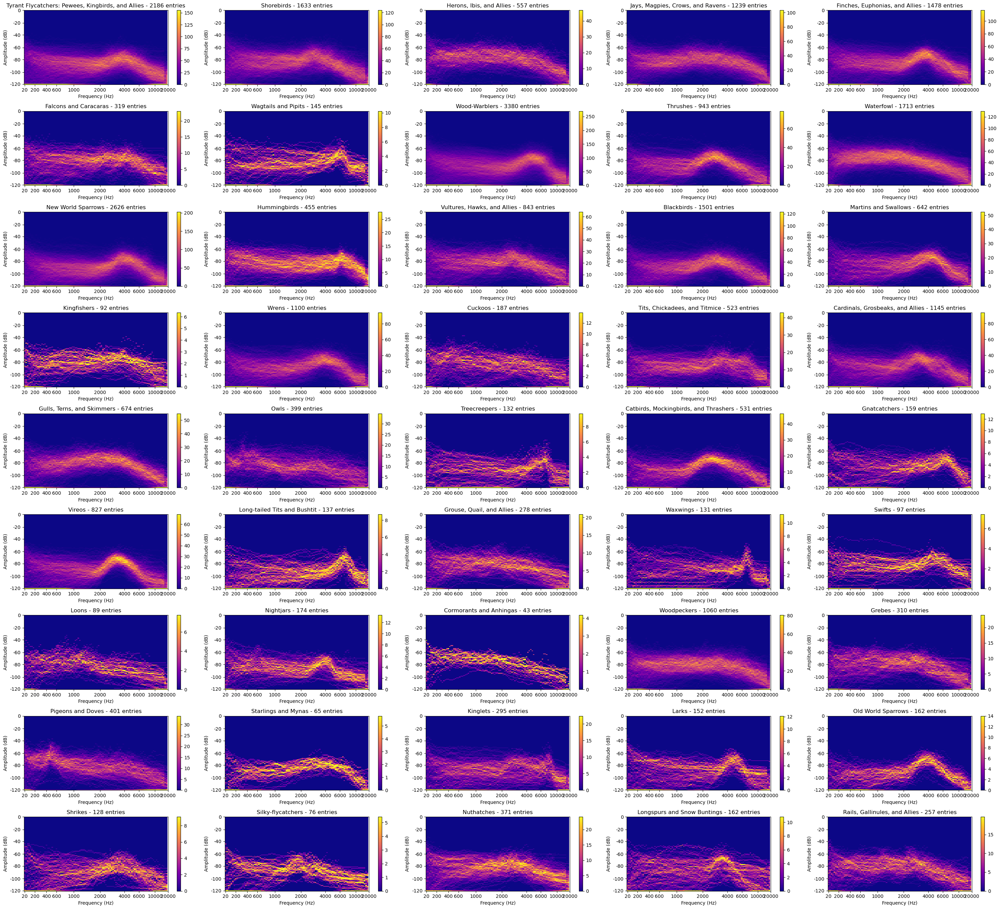

In [ ]:
plot_heatmap_matrix(raw_frequency_df, column='species_group')

## C. Audio Signal Processing Techniques
Now in order to improve the quality of the data, a few different signal processing techniques were applied to the files before creating a new dataset in order to impove the corelation between the frequency representation of the spectrum and the target.

### 1. Reduction of the Noise Floor

#### a) Issues Caused by Noise Floor
The first, and most important is the reduction of the noise floor from the signal in order to make the signal from the birds more prominent in the data. These files were recorded by voluenteers, mostly hobbiest bird watchers, not audio engineers. Some files are recorded in poor quality with a low signal to noise ratio. By reducing the frequencies of noise the frequencies represented by the fouier transformation will be more closely linked with the bird. Below are a few examples of a files with a high noise floor, analized in multiple representations.

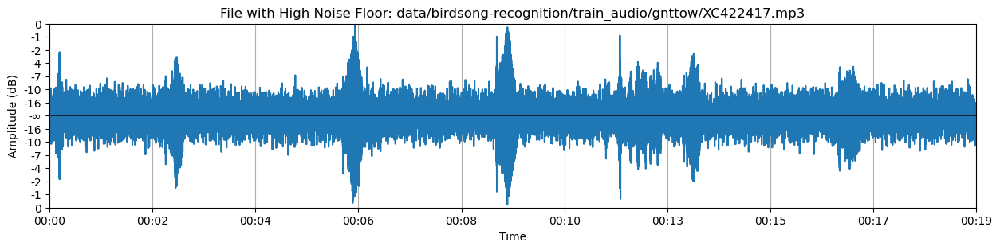

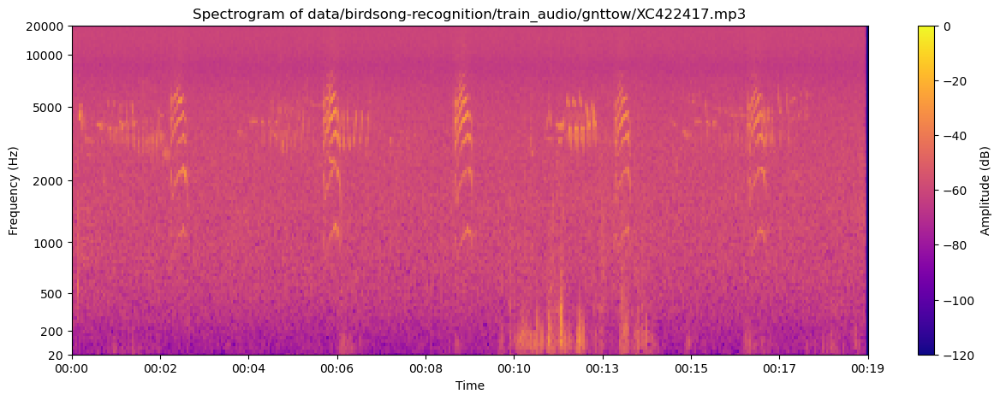

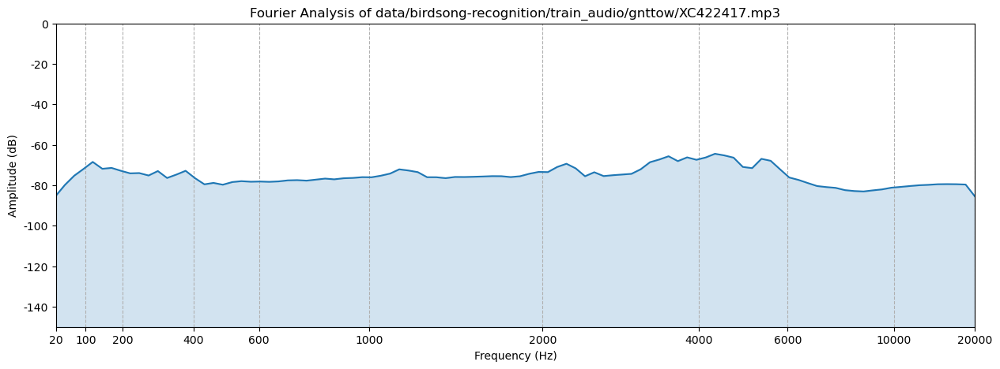

In [ ]:
file = 'data/birdsong-recognition/train_audio/gnttow/XC422417.mp3'
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=f'File with High Noise Floor: {file}')
plot_spectrogram(sound, title=f'Spectrogram of {file}')
plot_fourier_analysis(sound, title=f'Fourier Analysis of {file}')

This highlights how the informaition masking is at its worst with the flat frequency representation of the signal, reducing the response to that almost the same as white noise.

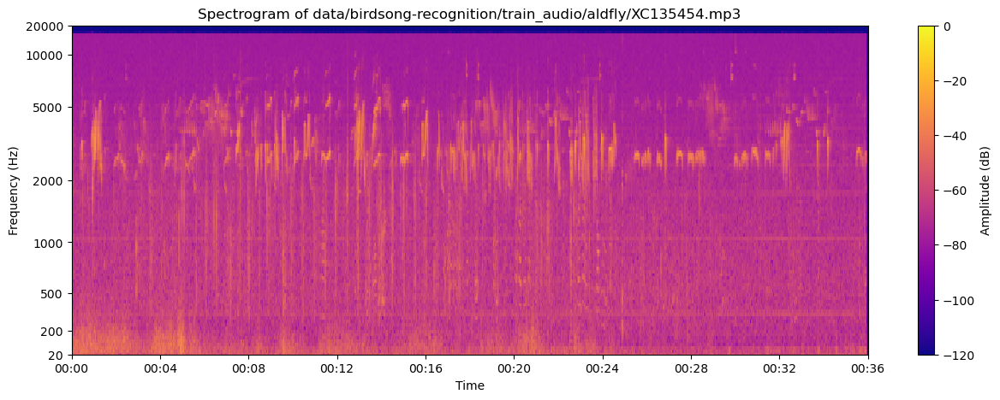

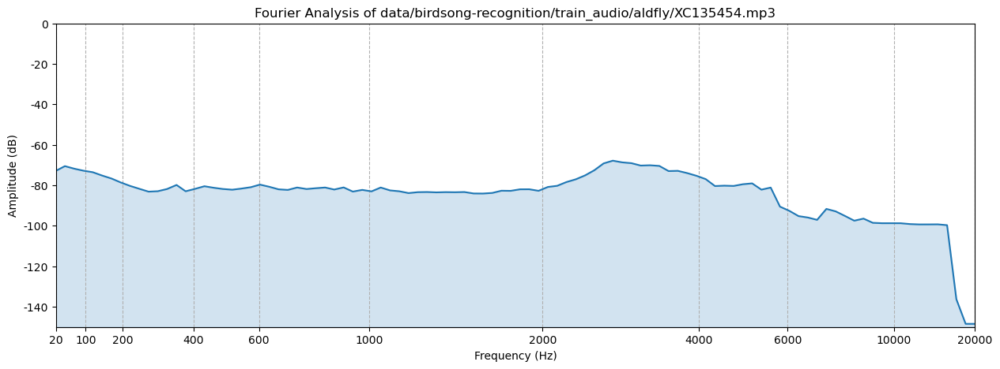

In [ ]:
file = df[df.ebird_code == 'aldfly'].filename.iloc[1]
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
plot_spectrogram(sound, title=f'Spectrogram of {file}')
plot_fourier_analysis(sound, title=f'Fourier Analysis of {file}')

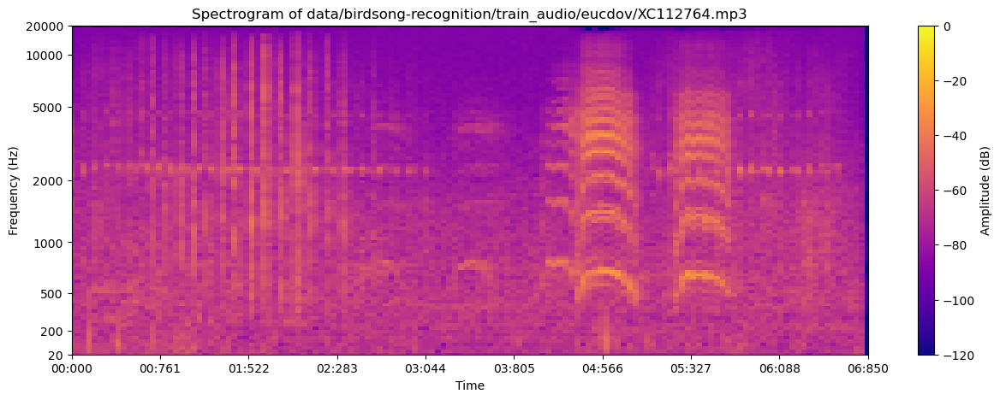

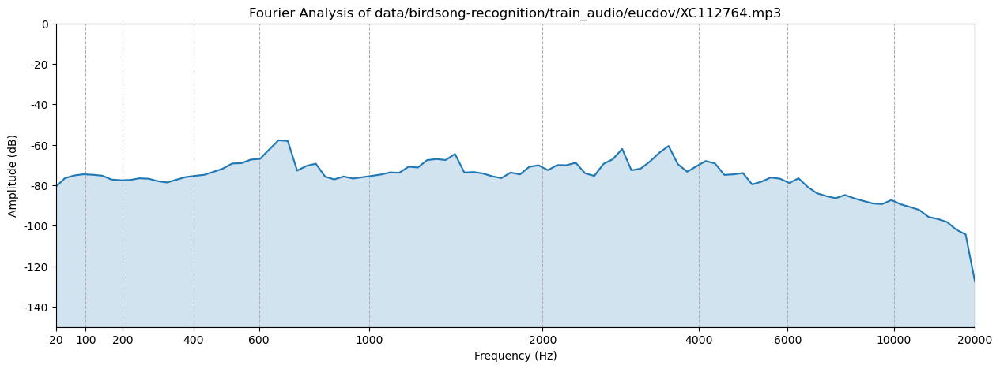

In [ ]:
file = df[df.ebird_code == 'eucdov'].filename.iloc[1]
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
plot_spectrogram(sound, title=f'Spectrogram of {file}')
plot_fourier_analysis(sound, title=f'Fourier Analysis of {file}')

#### b) Method of Noise Reduction

The idea behind the noise reduction algorithm is to make convert the signal to a time-frequency representation with an STFT and then finding a minimum magnitude value for each frequency. When searching for the *true* minimum, a 0 magnitude value will be found at some point for nearly every case, so instead of finding a true minimum, a low percentile is calculated instead, and this map of low percentile values for each frequency is what we interpret as the noisefloor. That number is then multiplied by a coefficent called `reduction_coefficent` which amplifies the values of the noisefloor to make its reduction more prominent. This noisefloor value is then redudes from each time slice of the time-frequency representation of the signal, by subtracting the magnitude of the orginal complex value from the noisefloor value, and then recalculating the full complex number with this new magnitude and the original phase angle, this way all other information about the signal is preserved, just the magnitude of the noisefloor is reduced from the frequency spectrum of each time slice. This new modified time-frequency signal is then reconverted into a real valued signal with an ISTFT.

In [ ]:
def reduce_noise_floor(signal: ndarray, sample_rate: int, noise_floor_percentile: number=2.5, reduction_coefficient: number=7.5) -> ndarray:
    """Reduce the noise floor of a signal by determining the noise floor using the Short Time Fourier Transform.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Method
    ------
    1. Calculate the Short Time Fourier Transform of the audio signal.
    2. Determine the noise floor by taking a low percentile of the magnitudes in each frequency bin.
    3. Subtract the noise floor from the magnitudes. Only the magnitude should be reduced, which means the complex value must be recomputed using the phase.
    4. Calculate the Inverse Short Time Fourier Transform on the modified time-frequency signal to get the new real time signal.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to reduce the noise floor of.
        sample_rate (int): The sample rate of the signal.
        noise_floor_percentile (number, optional): The percentile of the magnitudes to use as the noise floor. Defaults to 2.5.
        reduction_coefficient (number, optional): The coefficient to reduce the noise floor by. Defaults to 10.
    
    Returns:
        cp.ndarray|np.ndarray: The signal with the noise floor reduced. Return type matches the input signal type.
    """
    math = np # Use numpy for CPU operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU operations if the signal is a cupy array

    nperseg_constant = 100 # Set the constant to determine the window size
    noverlap_constant = 2 # Set the constant to determine the overlap size
        
    _, _, Zxx = short_time_fourier_transform(signal, sample_rate, nperseg_constant, noverlap_constant) # Calculate the Short Time Fourier Transform with high time resolution
    noise_floor = math.zeros(Zxx.shape[0]) # Initialize an array to store the noise floor
    for i in range(Zxx.shape[0]): # Iterate through each frequency bin
        # Calculate the noise floor as a percentile of the magnitudes. (min value is always 0, so a low percentile is used instead)
        noise_floor[i] = math.percentile(math.abs(Zxx[i]), noise_floor_percentile) 
        noise_floor[i] *= reduction_coefficient # Reduce the noise floor by the reduction coefficient to adjust the amount of reduction applied.
    for i in range(Zxx.shape[1]): # Iterate through each time slice
        # Subtract the noise floor from the magnitudes and recompute the complex values with the phase (minimum value magnitude is 0)
        Zxx[:, i] = polar_to_complex(math.maximum(math.abs(Zxx[:, i]) - noise_floor, 0), math.angle(Zxx[:, i]))
    del noise_floor # Clear the noise floor from memory
    return inverse_short_time_fourier_transform(Zxx, sample_rate, nperseg_constant, noverlap_constant) # Calculate the Inverse Short Time Fourier Transform to get the noise reduced signal

#### c) Noise Reduction Examples
This noise reduction algorithm was then applied to the same problem file highlighted in 

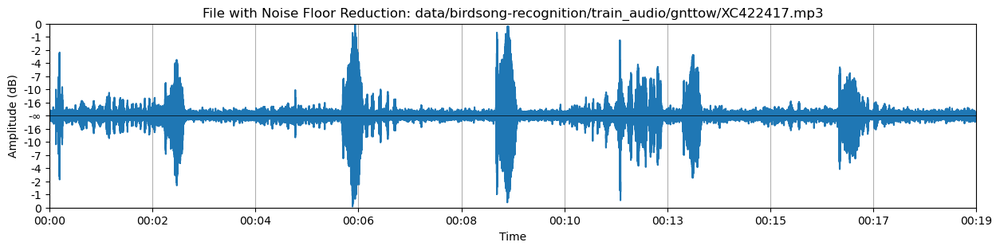

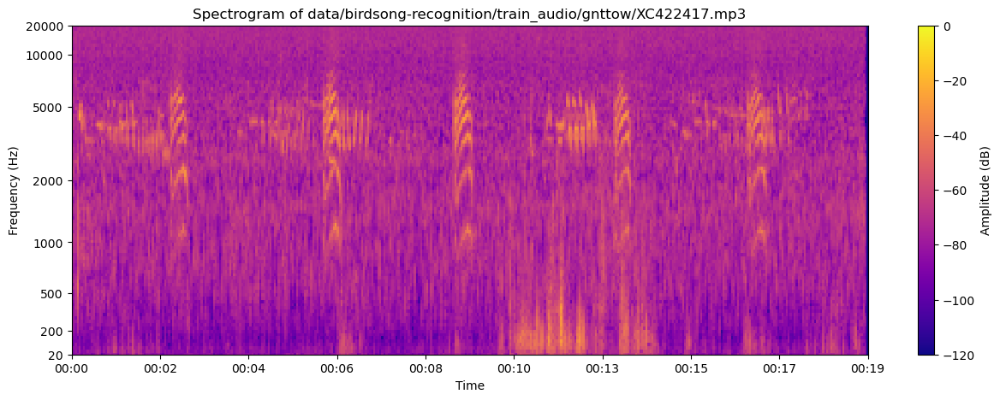

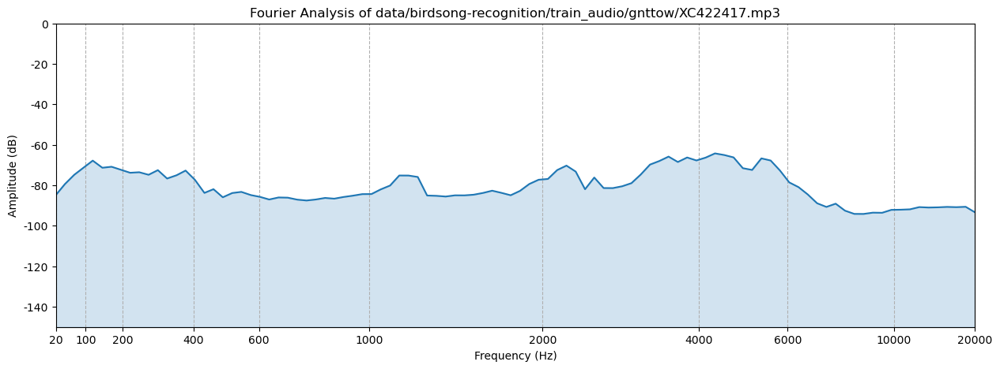

<_io.BufferedRandom name='exports/gnttow_noise_reduced.wav'>

In [ ]:
file = 'data/birdsong-recognition/train_audio/gnttow/XC422417.mp3'
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
sound.export('exports/gnttow_original.wav', format='wav')
signal = np.array(sound.get_array_of_samples())
signal = reduce_noise_floor(signal, sound.frame_rate)
sound = signal_to_audio(signal, sound.frame_rate)
plot_waveform(sound, title=f'File with Noise Floor Reduction: {file}')
plot_spectrogram(sound, title=f'Spectrogram of {file}')
plot_fourier_analysis(sound, title=f'Fourier Analysis of {file}')
sound.export('exports/gnttow_noise_reduced.wav', format='wav')


##### (i) Original
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/gnttow_original.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

##### (ii) Noise Reduced
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/gnttow_noise_reduced.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

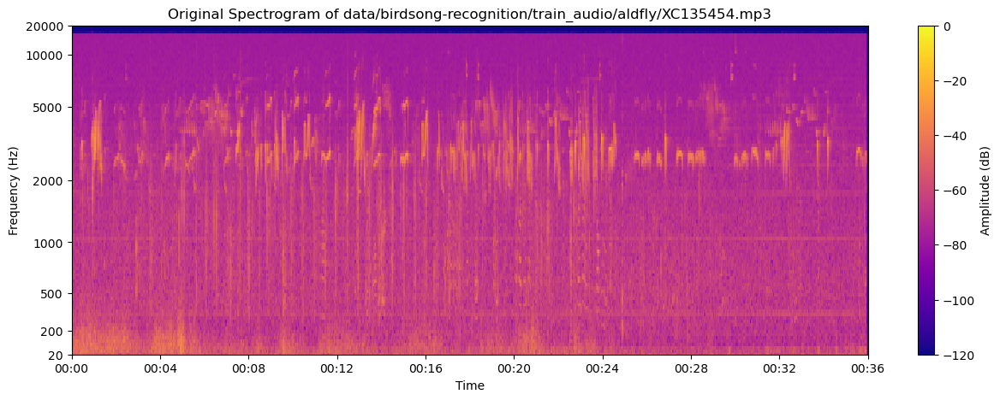

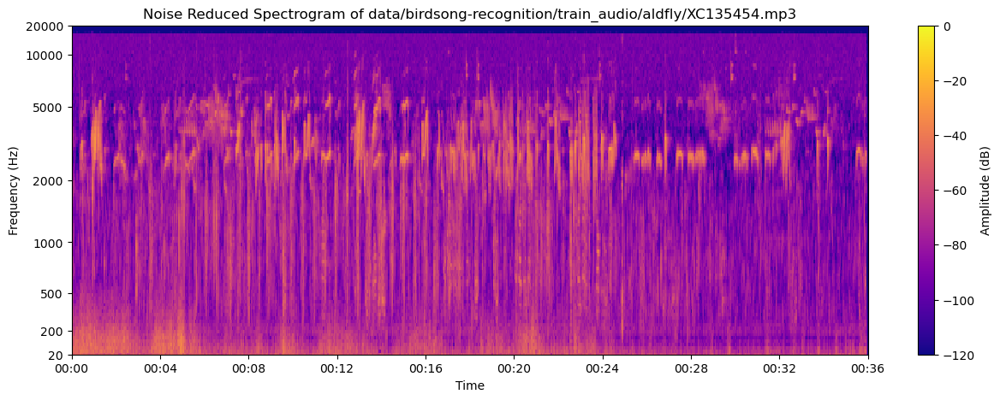

In [ ]:
file = df[df.ebird_code == 'aldfly'].filename.iloc[1]
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
sound.export('exports/aldfly_original.wav', format='wav')
plot_spectrogram(sound, title=f'Original Spectrogram of {file}')
signal = np.array(sound.get_array_of_samples())
signal = reduce_noise_floor(signal, sound.frame_rate)
sound = signal_to_audio(signal, sound.frame_rate)
sound.export('exports/aldfly_noise_reduced.wav', format='wav')
plot_spectrogram(sound, title=f'Noise Reduced Spectrogram of {file}')

##### (i) Original
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/aldfly_original.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

##### (ii) Noise Reduced
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/aldfly_noise_reduced.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

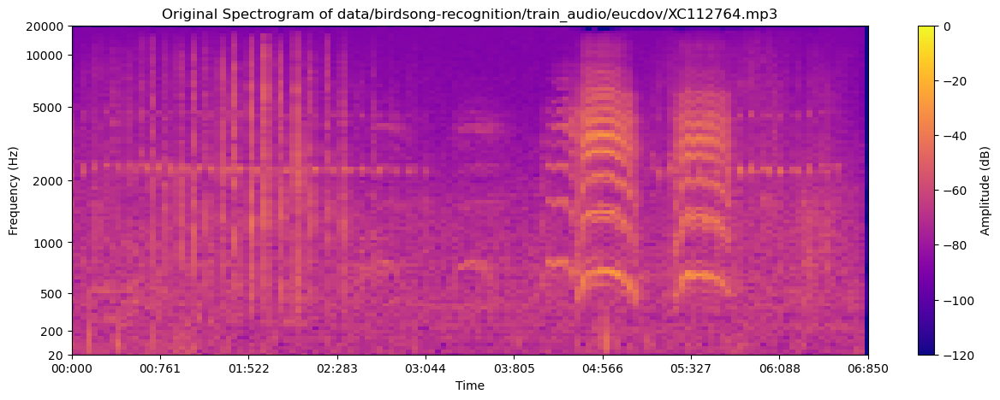

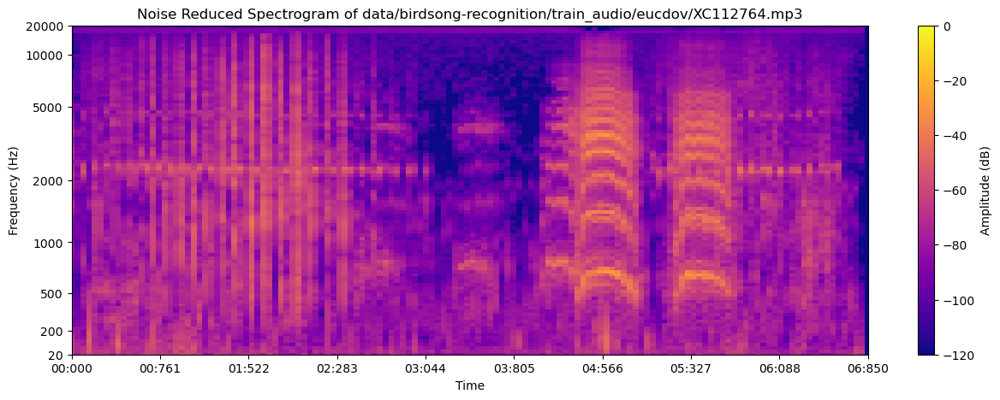

In [ ]:
file = df[df.ebird_code == 'eucdov'].filename.iloc[1]
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
sound.export('exports/eucdov_original.wav', format='wav')
plot_spectrogram(sound, title=f'Original Spectrogram of {file}')
signal = np.array(sound.get_array_of_samples())
signal = reduce_noise_floor(signal, sound.frame_rate)
sound = signal_to_audio(signal, sound.frame_rate)
sound.export('exports/eucdov_noise_reduced.wav', format='wav')
plot_spectrogram(sound, title=f'Noise Reduced Spectrogram of {file}')

##### (i) Original
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/eucdov_original.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

##### (ii) Noise Reduced
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/eucdov_noise_reduced.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

### 2. Reduction of Momentary Clicks

#### a) Issued Caused by Clicks
As well as loud noisefloors, there are also some issues that prevent proper normalization of the amplitude of the signal. Ideally, the signal of the sound of the bird is as loud as possible but the signal will be normalized based on the loudes sound in the signal. Often dignal clicks will happen from things touching the microphone, the cable attached to the microphone, or other artifacts, and some of these clicks are loud enough to cause substantial problems in the normalization of the audio signal. Below is an example of a signal that can not be normalized because of the existance of overly loud digital clicks.

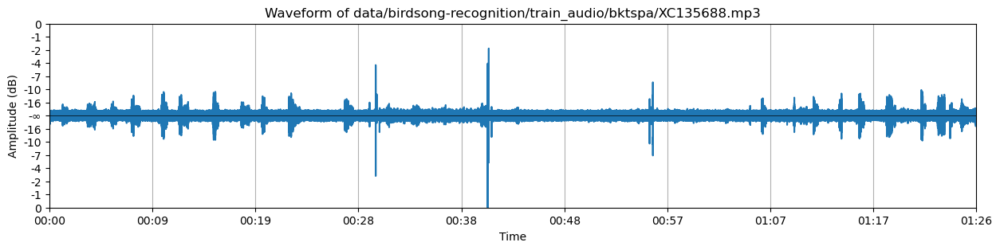

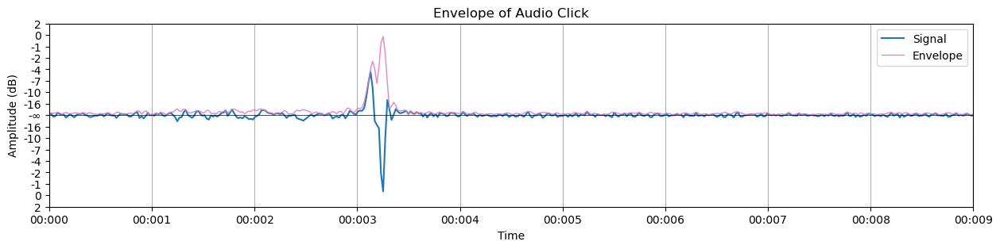

In [ ]:
filename = 'data/birdsong-recognition/train_audio/bktspa/XC135688.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=f'Waveform of {filename}')
plot_analytic_envelope(sound[40965:40975], title='Envelope of Audio Click')

#### b) Means of Detecting Clicks

##### (i) Peak Detection
The first method of click detection was using `scipy.signal.find_peaks`, so a function was created facilitate that in a cpu/gpu agnostic way.

In [ ]:
def find_clicks(signal: ndarray,
                sample_rate: int,
                height_threshold: float=0.25,
                envelope_threshold: float=0.033,
                width_max: float=0.1,
                prominence: float=0.2
                ) -> ndarray:
    """Find the clicks in an audio signal using the peak finding algorithm.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to find the clicks in.
        sample_rate (int): The sample rate of the signal.
        height_threshold (float, optional): The minimum height of a peak. Defaults to 0.25.
        envelope_threshold (float, optional): The minimum height of the envelope. Defaults to 0.033.
        width_max (float, optional): The maximum width of a peak in ms. Defaults to 0.1.
        prominence (float, optional): The prominence of the peak. Defaults to 0.2.
    
    Returns:
        cp.ndarray|np.ndarray: An array with the indices of the clicks. Matches input type.
    """
    math = np # Use numpy for CPU math operations by default
    sig = sp.signal # Use scipy for CPU signal operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU math operations if the signal is a cupy array
        sig = cusig  # Use CuPy for GPU signal operations if the signal is a cupy array
      
    width_max = int(width_max * sample_rate / 1000) # Convert the width to samples 
    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    envelope = math.abs(analytic_signal) # Calculate the envelope of the analytic signal
    return sig.find_peaks(envelope,
                          height=height_threshold,
                          threshold=envelope_threshold,
                          prominence=prominence,
                          width=(0, width_max))[0] # Find the peaks in the envelope

In [ ]:
def plot_waveform_clicks(sound: AudioSegment, title: str='Clicks') -> None:
    """Plot the waveform and mark the moments where clicks are detected based on the input array.
    Does not calculate the clicks, only plots them.

    Args:
        sound (AudioSegment): The audio signal to plot.
        clicks (np.ndarray): The indices of the clicks.
        title (str, optional): The title of the plot. Defaults to 'Clicks'.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]

    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal) # Normalize the signal to the range [-1,1]
    clicks = find_clicks(signal, sound.frame_rate) # Find the clicks in the signal
    time = signal_to_time(signal, sound.frame_rate) # Calculate the time values for each sample
    plt.figure(figsize=(15, 3)) # Long figure
    plt.plot(time, signal) # Plot the original signal

    for click in clicks: 
        plt.axvline(time[click], color='tab:red', linestyle='--')

    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude (dB)')
    plt.axhline(0, color='black', linewidth=0.5) # Add a horizontal black centerline
    yticks = np.linspace(-1, 1, 15) # Add y-ticks
    yticks_labels = [f'{magnitude_to_db(y):.0f}' for y in yticks] # Convert the y-ticks to decibels and round to the nearest whole number
    yticks_labels[7] = '-∞' # Replace the center y-tick with negative infinity
    plt.ylim(-1, 1)
    plt.yticks(yticks, yticks_labels)
    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1 # Set the depth of the time values
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    plt.show()

This with some adjustment was able to detect some clicks in audio sucessfully.

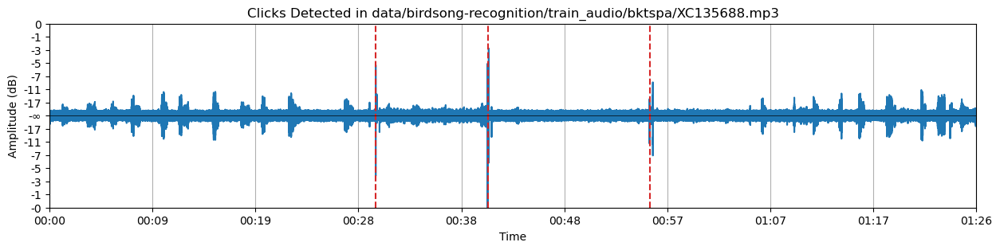

In [ ]:
filename = 'data/birdsong-recognition/train_audio/bktspa/XC135688.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform_clicks(sound, title=f'Clicks Detected in {filename}')

However it also produced some false positives, like in this example. The Common Grackle simply has a short chirp, these are not problems in the signal, this is the real signal.

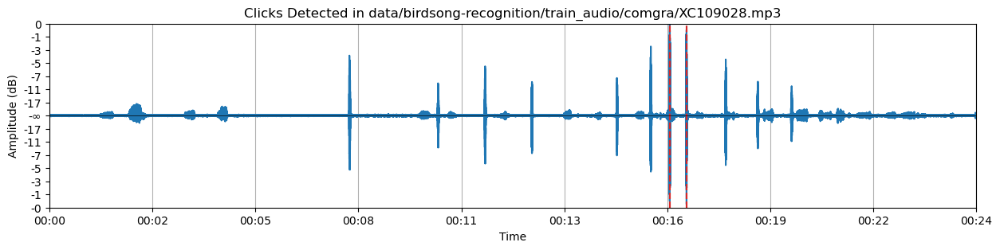

In [ ]:
common_grackle = df[df['common_name'] == 'Common Grackle']
filename = common_grackle.iloc[0].filename
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform_clicks(sound, title=f'Clicks Detected in {filename}')

##### (ii) Calcuating the Click-Sensitive Signal
The main thing differentiating the clicks that are problems from real signal is that these highly transient very loud instantaneous clicks happen in an incredibly short period of time and do not have any real signal decay or reverb, because they are mostly digital problems and artifacts.

A new novel method was attempted where:
 1. The envelope of the audio signal was calculated
 2. A thin-windowed ***center calculated*** RMS signal was created from the envelope
 3. A second ***even thinner*** center calculated RMS signal was created from the original signal envelope
 4. The two RMS signals are added together. This produces a slight variation of a very low resolution RMS average of the signal envelope, with a much higher emphasis on very small localized areas.
 5. The adjusted rms envelope is then subtracted from the original envelope
 6. A threshold signal magnitude adjustment is then subtracted from this new click sensitive envelope
 7. Any value above 0 is kept, and those values refer to the location and magnitude of the clicks detected.
 8. The signal is taken to the power of $\frac{1}{2}$ (the square root is found) in order to accent the signal with a nonlinear scale. This only works assuming the signal has been normalized to [-1,1] before this function began.

In [ ]:
def calculate_click_envelope(signal: ndarray, sample_rate: int, click_threshold: float=0.05, large_window_size: number=30, small_window_size: number=0.3) -> ndarray:
    """Calculate the envelope of the clicks in an audio signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray): The signal to calculate the envelope of. **Must be normalized to the range [-1,1]**
        sample_rate (int): The sample rate of the signal.
        click_threshold (float, optional): The threshold for the magnitude of the clicks. Defaults to 0.1.
        large_window_size (number, optional): The size of the wide window for the RMS envelope. Defaults to 30.
        small_window_size (number, optional): The size of the thin window for the RMS envelope. Defaults to 0.3.

    Returns:
        cp.ndarray|np.ndarray: The envelope of the clicks. Matches input type.
    """ 
    math = np # Use numpy for CPU math operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU math operations if the signal is a cupy array

    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    envelope = math.abs(analytic_signal) # Calculate the envelope of the analytic signal
    wide_rms_envelope = signal_to_rms_signal(envelope, sample_rate, large_window_size, centered=True) # Calculate a wide RMS envelope of the envelope
    thin_rms_envelope = signal_to_rms_signal(envelope, sample_rate, small_window_size, centered=True) # Calculate a thin RMS envelope of the envelope
    adjusted_envelope = wide_rms_envelope + thin_rms_envelope # Add the two envelopes together
    click_envelope = envelope - adjusted_envelope # Subtract the adjusted envelope from the envelope
    click_envelope = click_envelope - click_threshold # Subtract the threshold from the envelope
    click_envelope = math.maximum(click_envelope, 0) # Return only the positive values
    click_envelope = click_envelope ** (1/2) # Take the square root of the envelope to make the clicks more visible
    del analytic_signal, envelope, wide_rms_envelope, thin_rms_envelope, adjusted_envelope # Clear the variables from memory
    return click_envelope

And in order to remove those clicks from the signal, a function was written to widen the signal so that a little bit of the area around the signal is removes as well. To do this, at each non-zero value in the signal, a gaussian function was applied with the same peak as the original signal. This is not a gaussian filter, which would normalize to the area around, this is a modified approach that ensures the peaks are the same magnitude.

In [ ]:
def widen_peaks(signal: ndarray, sample_rate: int=44100, width: number=2) -> ndarray:
    """Widen the peaks in an audio signal using a Gaussian function.
    Calculation is done on the CPU.
    If the input signal is a CuPy array, it will be converted to a NumPy array during the calculation and converted back to a CuPy array before returning.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to widen the peaks of.
        width (number, optional): The width of the Gaussian filter in ms. Defaults to 2.
        sample_rate (int, optional): The sample rate of the signal. Defaults to 44100.
    
    Returns:
        cp.ndarray|np.ndarray: The signal with the widened peaks. Matches input type.
    """
    convert_to_cupy = False # Initialize a variable to convert the signal to a CuPy array
    if isinstance(signal, cp.ndarray):
        convert_to_cupy = True # Set the variable to convert the signal to a CuPy array
        signal = signal.get() # Convert the signal to a NumPy array

    width = int(width * sample_rate / 1000) # Convert the width to samples

    # Create a Gaussian function
    gaussian_filter = np.exp(-((np.arange(-width//2, width//2) / (width//4))**2))

    # Apply the Gaussian filter to the signal
    widened_signal = signal.copy() # Copy the signal to avoid modifying the original
    for index in range(len(signal)):
        if signal[index] != 0: # If the signal is not zero
            start = max(0, index - width//2) # Calculate the start of the filter
            end = min(len(signal), index + width//2) # Calculate the end of the filter
            filter_start = max(0, width//2 - index) # Calculate the start of the filter
            filter_end = min(width, width//2 + (len(signal) - index)) # Calculate the end of the filter
            filter = gaussian_filter * signal[index] # Normalize the filter by the signal value
            widened_signal[start:end] = np.maximum(widened_signal[start:end], filter[filter_start:filter_end]) # Apply the function to the signal

    if convert_to_cupy: # If the signal was originally a CuPy array
        widened_signal = cp.array(widened_signal) # Convert the signal back to a CuPy array
    return widened_signal
        

In [ ]:
def plot_click_envelope(sound: AudioSegment, title: str, widen: bool=False, normalization_constant: Optional[int]=None) -> None:
    """Plots the envelope of the clicks in an audio signal.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str): The title of the plot.
        normalization_constant (int, optional): The constant to normalize the signal by. Defaults to None.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]
    
    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal, normalization_constant) # Normalize the signal to the range [-1,1]
    click_envelope = calculate_click_envelope(signal, sound.frame_rate) # Calculate the envelope of the clicks
    if widen:
        click_envelope = widen_peaks(click_envelope, sound.frame_rate) # Widen the peaks of the envelope
    time = signal_to_time(signal, sound.frame_rate) # Calculate the time values for each sample
    plt.figure(figsize=(15, 3)) # Long figure
    plt.plot(time, click_envelope, color='tab:red') # Plot the original signal
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude (dB)')
    yticks = np.linspace(0, 1, 7) # Add y-ticks
    yticks_labels = [f'{magnitude_to_db(y):.0f}' for y in yticks] # Convert the y-ticks to decibels and round to the nearest whole number
    yticks_labels[0] = '-∞' # Replace the last y-tick with negative infinity
    plt.ylim(0, 1)
    plt.yticks(yticks, yticks_labels)
    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1 # Set the depth of the time values
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    plt.fill_between(time, click_envelope, 0, where=click_envelope > 0, color='tab:red', alpha=0.2) # Fill the area under the envelope
    plt.show()

This method proved quite sucessful, even at sucessfully detecting clicks in the end of this signal that were not originally detected.

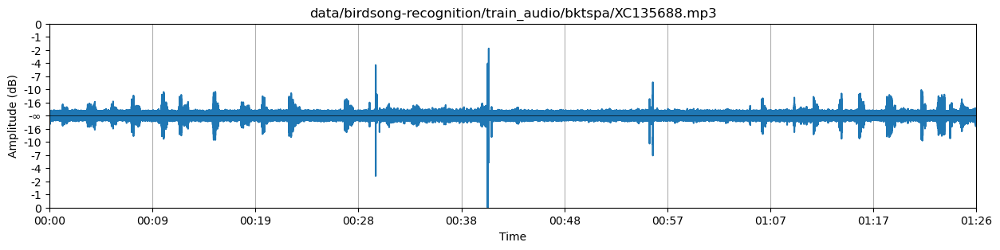

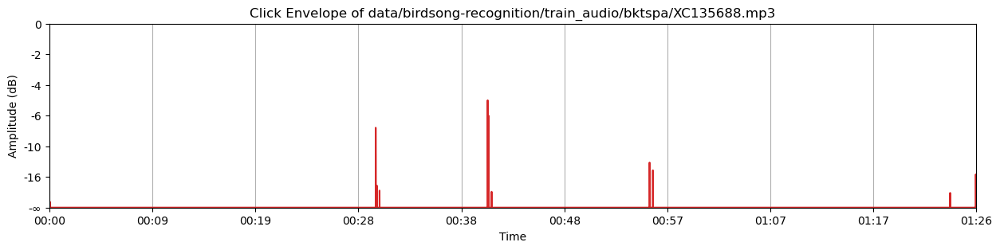

In [ ]:
filename = 'data/birdsong-recognition/train_audio/bktspa/XC135688.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=filename)
plot_click_envelope(sound, title=f'Click Envelope of {filename}')

While also not detecting any of the same false positives.

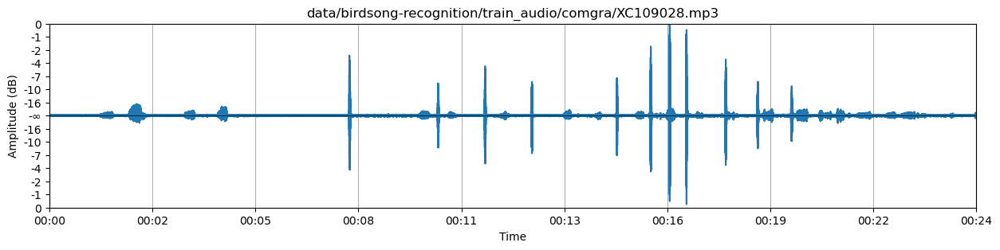

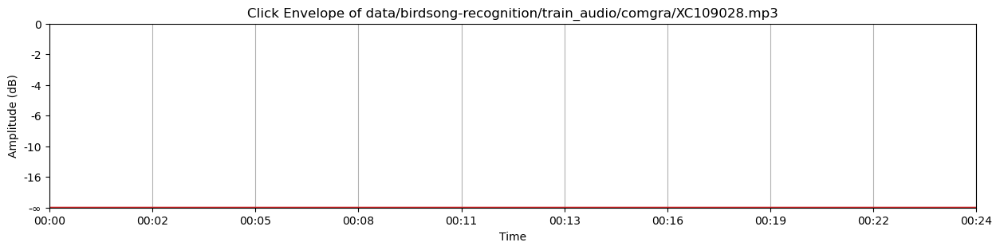

In [ ]:
common_grackle = df[df['common_name'] == 'Common Grackle']
filename = common_grackle.iloc[0].filename
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=filename)
plot_click_envelope(sound, title=f'Click Envelope of {filename}')

Here a closeup of a single click in the audio was shown comparing the original signal, with this new click envelope, and it after the gaussian function was applied to widen it.

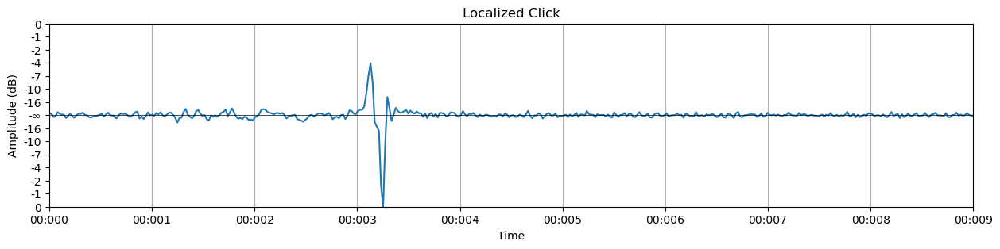

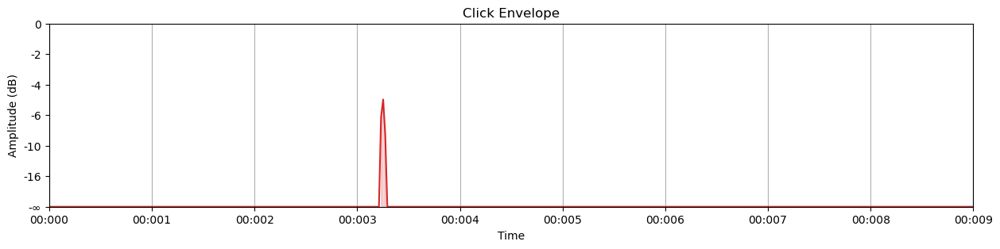

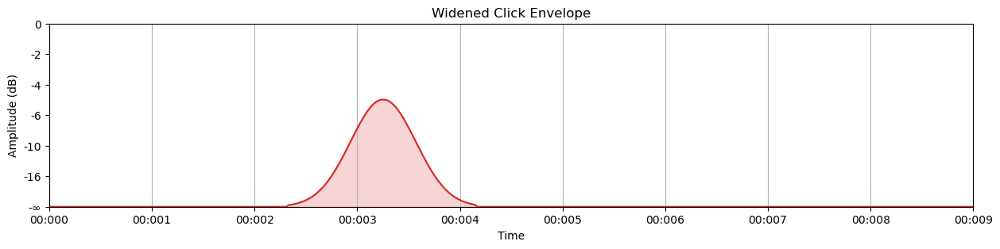

In [ ]:
filename = 'data/birdsong-recognition/train_audio/bktspa/XC135688.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound[40965:40975], title='Localized Click')
plot_click_envelope(sound[40965:40975], title='Click Envelope')
plot_click_envelope(sound[40965:40975], title='Widened Click Envelope', widen=True)

#### c) Reducing Magnitude around Clicks
The algorithm for removing clicks is quite simple once a means of detecting them sucessfully. The high-level idea is:
 1. Calculate this click envelope (A coefficent is added to the signal at this stage to amplify the response of the click reduction)
 2. Widen the peaks of the click envelope
 3. Calcualte the analytic signal (from the original signal)
 4. Subtract the magnitudes of the click envelope from the magnitudes of the analytic signal
 5. Normalize any value below 0 to be 0 so that there are no negative magnitudes
 6. Use the adjusted magnitude valuse to recalcuate the complex analaytic signal from the original instantaneous phase angles
 7. Extract the real signal from the new analytic signal by casting away the imaginary values

In [ ]:
def reduce_clicks(signal: ndarray, sample_rate: int, click_widening: number=2, click_strengthening: number=4) -> ndarray:
    """Reduce the clicks in an audio signal by determining the clicks using the envelope.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to reduce the clicks of.
        sample_rate (int): The sample rate of the signal.
        click_widening (number, optional): The amount to widen the clicks by in ms. Defaults to 2.
        click_strengthening (number, optional): The amount to strengthen the clicks by. Defaults to 2.
    
    Returns:
        cp.ndarray|np.ndarray: The signal with the clicks reduced. Matches input type.
    """
    math = np # Use numpy for CPU math operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU math operations if the signal is a cupy array
    click_envelope = calculate_click_envelope(signal, sample_rate) * click_strengthening # Calculate the envelope of the clicks
    click_envelope = widen_peaks(click_envelope, sample_rate, width=click_widening) # Widen the peaks of the envelope
    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    envelope = math.abs(analytic_signal) # Calculate the envelope of the analytic signal
    envelope = envelope - click_envelope # Subtract the click envelope from the envelope
    envelope = math.maximum(envelope, 0) # Return only the positive values
    analytic_signal = polar_to_complex(envelope, math.angle(analytic_signal)) # Recreate the analytic signal with the new envelope
    del envelope, click_envelope # Clear the envelope and click envelope from memory
    return analytic_signal.real # Return the real part of the analytic signal as the new signal

Here this displays how big of a change in the results after the signal normalization whe the clicks are removed.

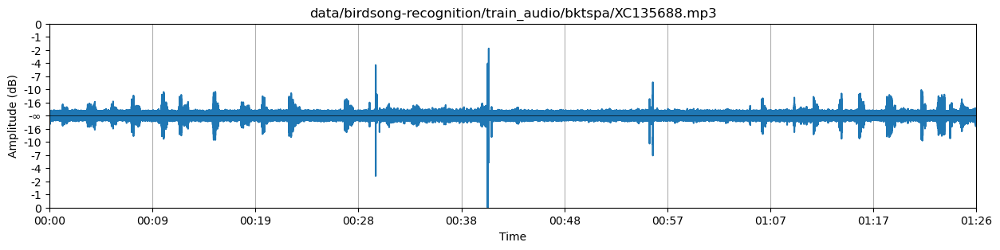

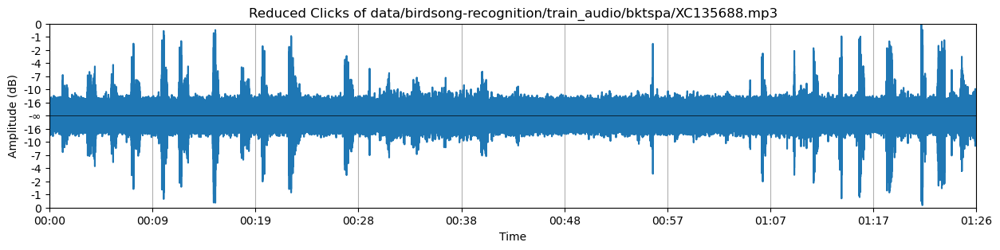

<_io.BufferedRandom name='exports/reduced_clicks.wav'>

In [ ]:
filename = 'data/birdsong-recognition/train_audio/bktspa/XC135688.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
sound.export('exports/original_clicks.wav', format='wav')
plot_waveform(sound, title=filename)
signal = np.array(sound.get_array_of_samples())
signal = normalize_signal(signal)
signal = reduce_clicks(signal, sound.frame_rate)
signal = normalize_signal(signal)
sound = signal_to_audio(signal, sound.frame_rate, denormalize=True)
plot_waveform(sound, title=f'Reduced Clicks of {filename}')
sound.export('exports/reduced_clicks.wav', format='wav')

This highlights exactly how much a small click can effect the normalization of the signal.
##### (i) Original
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/original_clicks.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

##### (ii) Noise Reduced
<audio controls>
  <source src="https://github.com/LookItVal/FinalProject/raw/refs/heads/master/exports/reduced_clicks.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

### 3. Retuction Of Transient Response

#### a) Introduction to Signal Transients

<img src='https://majormixing.com/wp-content/uploads/2023/01/a0e634ae-5e10-48d0-83b6-8f7133aa6923-768x511.png' height='300px'>

In audio signal processing and acoustics, a *transient* a high amplitude, short duration sound at the begining of a waveform. Transients are important in accoustic and audio production and analysis for a number of complicated reasons including their unique effect on the perception of the sounds to a human, and the difficulty for the replication and recording of transients in a signal. For the purposes of this document the only important things to note is these are common in many natural signals, and they are disproportantely louder than the rest of the signal.

#### b) Issues Caused by Transients
This means they have the potential to cause the same problems in the signal as flyaway clicks, they can prevent the normalization of the rest of the signal to make the tonal noise the loudest part of the signal (transients tend to be atonal). Below is a good example of a signal with excessove tramsients. It is worth noting that the transients in the signal be low **are** part of the actual birdcall itself, however because of the atonal nature of transients, the information about the frequency of the birdcall is moretly in the sustain portion of the waveform, and the transient contains little frequency information.

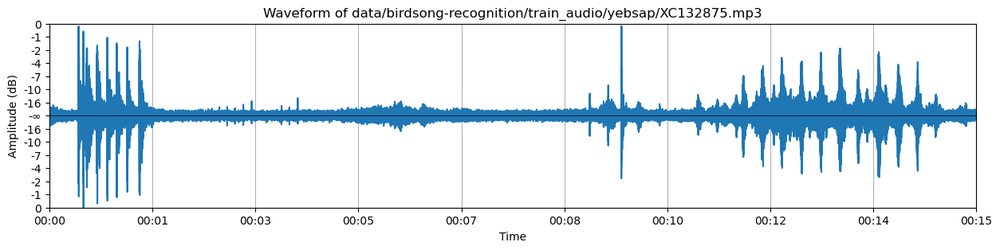

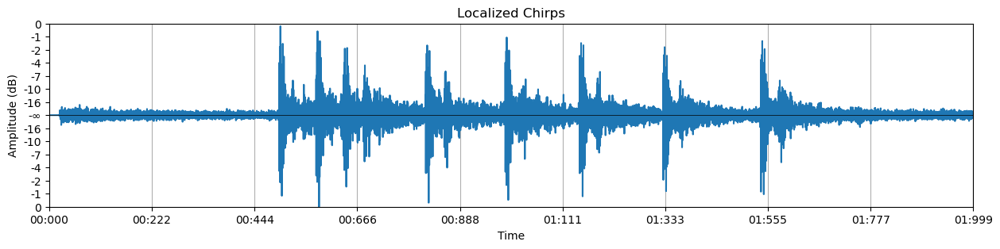

In [ ]:
filename = 'data/birdsong-recognition/train_audio/yebsap/XC132875.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=f'Waveform of {filename}')
plot_waveform(sound[:2000], title='Localized Chirps')

This closeup really highlights the shape of these full waveforms and the transients inside of them.

#### c) Calculating the Transient-Sensitive Signal
The method for detecting transients is quite similar to detecting clicks except instead of using a centered RMS calculation, the traditional RMS envelope can be compared to the true peak signal to find moments where the peak signal deviates from the RMS and "pulls" the RMS signal up to match it. The high level algorithm is:
 1. Calculate the analytic signal
 2. Calculate the signal envelope
 3. Calculate the RMS envelope, using a smaller window than would normally be used in an RMS calculation, but bigger than the window used in the click detection algorithm.
 4. Multiply the RMS envelope by a constant to make the signal louder (the rms signal will naturally be quieter than the true peak signal)
 5. Subtract the Peak Envelope from the RMS envelope to make the new Transient Sensitive Envelope.
 6. Keep only the values above 0. This is the final Transient Signal

In [ ]:
def calculate_transient_envelope(signal: ndarray, sample_rate: int, rms_coefficent: number=4, window_size: number=10) -> ndarray:
    """Calculate the envelope of the transients in an audio signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray): The signal to calculate the envelope of. **Must be normalized to the range [-1,1]**
        sample_rate (int): The sample rate of the signal.
        rms_coefficent (number, optional): The coefficient to adjust the RMS envelope by. Defaults to 4.
        window_size (number, optional): The size of the window in ms. Defaults to 10.

    Returns:
        cp.ndarray|np.ndarray: The envelope of the clicks. Matches input type.
    """ 
    math = np # Use numpy for CPU math operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU math operations if the signal is a cupy array

    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    envelope = math.abs(analytic_signal) # Calculate the envelope of the analytic signal
    rms_envelope = signal_to_rms_signal(envelope, sample_rate, window_size) # Calculate a wide RMS envelope of the envelope
    transient_envelope = envelope - (rms_envelope * rms_coefficent) # Subtract the adjusted envelope from the envelope
    transient_envelope = math.maximum(transient_envelope, 0) # Return only the positive values
    del analytic_signal, envelope, rms_envelope # Clear the variables from memory
    return transient_envelope

In order to widen the peaks of the transients, because they are more common in the signal, the decision was made to use a gaussian filter for the smoothing of these peaks, because applying the gaussian function to each peak was a quite linear function that did not scale well to large data moments of signal. For the clicks this was not a problem because of the size and shape of each peak but in the case of these transiets it is considerably faster to apply a gaussian filter to the signal, buy this also reduces the maximum amplitude of each peak by a large amount. To compensate for this the square root was applied to this widening function as a nonlinear way of amplifying the signal.

In [ ]:
def smooth_peaks(signal: ndarray, sample_rate: int, width: number=0.5) -> ndarray:
    """Round out the peaks of a signal with a Gaussian Filter to smooth the signal.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.
    
    Args:
        signal (cp.ndarray | np.ndarray): The signal to smooth the peaks of.
        sample_rate (int): The sample rate of the signal.
        window_size (number, optional): The size of the Gaussian filter in ms. Defaults to 1.
        
    Returns:
        cp.ndarray|np.ndarray: The signal with the smoothed peaks. Matches input type.
    """
    ndimage = sp.ndimage # Use scipy for CPU signal operations by default
    if isinstance(signal, cp.ndarray):
        ndimage = cpx.scipy.ndimage # Use CuPy for GPU signal operations if the signal is a cupy array
    
    width = int(width * sample_rate / 1000) # Convert the window size to samples
    return ndimage.gaussian_filter1d(signal, width) ** (1/2)# Apply the Gaussian filter to the signal

In [ ]:
def plot_transient_envelope(sound: AudioSegment, title: str, widen: bool=False, normalization_constant: Optional[int]=None) -> None:
    """Plots the envelope of the clicks in an audio signal.
    
    Args:
        sound (AudioSegment): The audio signal to plot.
        title (str): The title of the plot.
        normalization_constant (int, optional): The constant to normalize the signal by. Defaults to None.
    """
    if sound.channels != 1: # If the audio signal has multiple channels, convert it to mono
        sound = sound.split_to_mono()[0]
    
    signal = np.array(sound.get_array_of_samples()) # Get the audio signal as an array
    signal = normalize_signal(signal, normalization_constant) # Normalize the signal to the range [-1,1]
    click_envelope = calculate_transient_envelope(signal, sound.frame_rate) # Calculate the envelope of the clicks
    if widen:
        click_envelope = smooth_peaks(click_envelope, sound.frame_rate, width=0.5) # Widen the peaks of the envelope
    time = signal_to_time(signal, sound.frame_rate) # Calculate the time values for each sample
    plt.figure(figsize=(15, 3)) # Long figure
    plt.plot(time, click_envelope, color='tab:purple') # Plot the original signal
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Amplitude (dB)')
    yticks = np.linspace(0, 1, 7) # Add y-ticks
    yticks_labels = [f'{magnitude_to_db(y):.0f}' for y in yticks] # Convert the y-ticks to decibels and round to the nearest whole number
    yticks_labels[0] = '-∞' # Replace the last y-tick with negative infinity
    plt.ylim(0, 1)
    plt.yticks(yticks, yticks_labels)
    plt.grid(True, axis='x')
    xticks = np.linspace(0, time[-1], 10) # Add x-ticks
    depth = 2 if time[-1] > 10 else 1 # Set the depth of the time values
    xticks_labels = [time_to_human_readable(x, depth=depth) for x in xticks] # Convert the x-ticks to human readable time
    plt.xlim(0, time[-1])
    plt.xticks(xticks, xticks_labels)
    plt.fill_between(time, click_envelope, 0, where=click_envelope > 0, color='tab:purple', alpha=0.2) # Fill the area under the envelope
    plt.show()

Below is the detection of transients on the same sample shown above

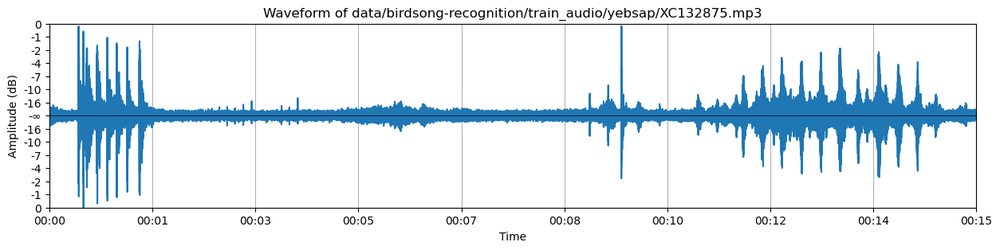

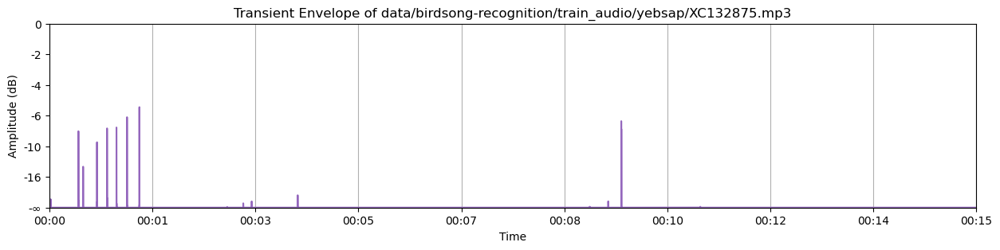

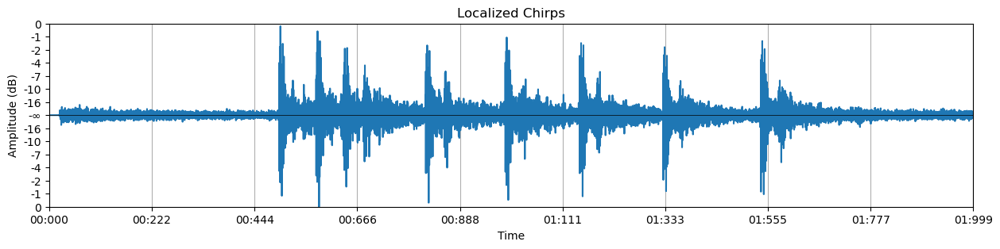

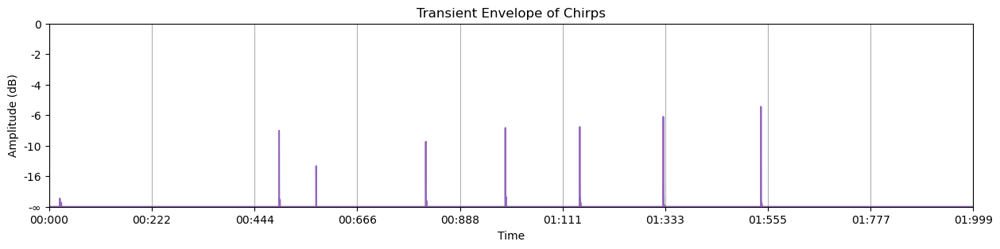

In [ ]:
filename = 'data/birdsong-recognition/train_audio/yebsap/XC132875.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=f'Waveform of {filename}')
plot_transient_envelope(sound, title=f'Transient Envelope of {filename}')
plot_waveform(sound[:2000], title='Localized Chirps')
plot_transient_envelope(sound[:2000], title='Transient Envelope of Chirps')

And a visualizaion of how the widened signal looks.

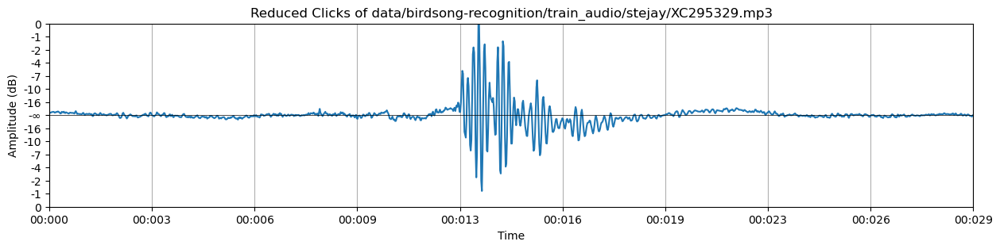

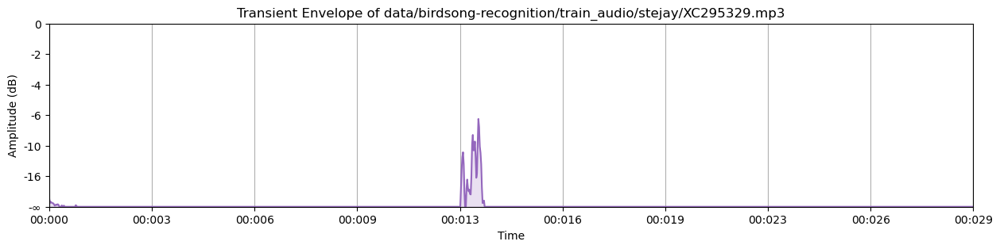

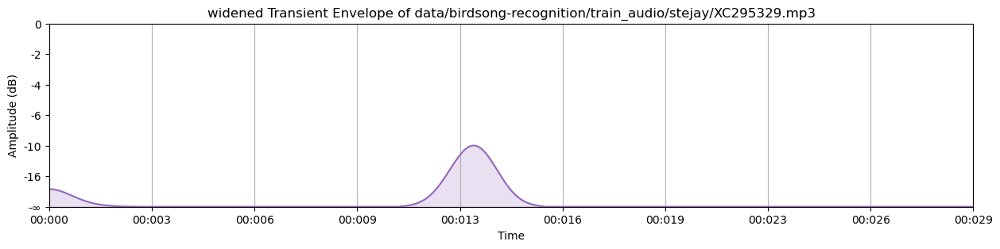

In [ ]:
filename = 'data/birdsong-recognition/train_audio/stejay/XC295329.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound[-30:], title=f'Reduced Clicks of {filename}')
plot_transient_envelope(sound[-30:], title=f'Transient Envelope of {filename}')
plot_transient_envelope(sound[-30:], title=f'widened Transient Envelope of {filename}', widen=True)

#### d) Reducing Magnitude around Transients

In order to remove the transients from the signal the following high level algorithm was used:
 1. Calculate the transient envelope
 2. Widen the peaks of the transient envelope with the adusted gaussian filter
 3. Calculate the analytic signal from the original signal
 4. Calculate the signal envelope from the analytic signal
 5. Subtract the transient envelope from the signal envelope to make the new transient reduced envelope
 6. Replace any values less than 0 with 0
 7. Recalcualte the complex analytic signal from the new adjusted envelope and the original phase angles
 8. Return the real signal from the new adjusted analytic signal

In [ ]:
def reduce_transients(signal: ndarray, sample_rate: int, transient_widening: number=0.5) -> ndarray:
    """Reduce the transients in an audio signal. Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to reduce the transients of.
        sample_rate (int): The sample rate of the signal.
        transient_widening (number, optional): The amount to widen the transients by in ms. Defaults to 0.5.
    
    Returns:
        cp.ndarray|np.ndarray: The signal with the transients reduced. Matches input type.
    """
    math = np # Use numpy for CPU math operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU math operations if the signal is a cupy array
    
    transient_envelope = calculate_transient_envelope(signal, sample_rate) # Calculate the envelope of the transients
    transient_envelope = smooth_peaks(transient_envelope, sample_rate, width=transient_widening) # Widen the peaks of the envelope
    analytic_signal = hilbert_transform(signal) # Calculate the analytic signal
    envelope = math.abs(analytic_signal) # Calculate the envelope of the analytic signal
    envelope = envelope - transient_envelope # Subtract the transient envelope from the envelope
    envelope = math.maximum(envelope, 0) # Return only the positive values
    analytic_signal = polar_to_complex(envelope, math.angle(analytic_signal)) # Recreate the analytic signal with the new envelope
    del envelope, transient_envelope # Clear the envelope and transient envelope from memory
    return analytic_signal.real # Return the real part of the analytic signal as the new signal

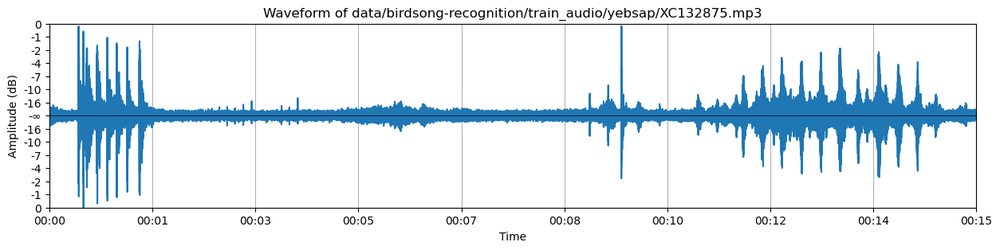

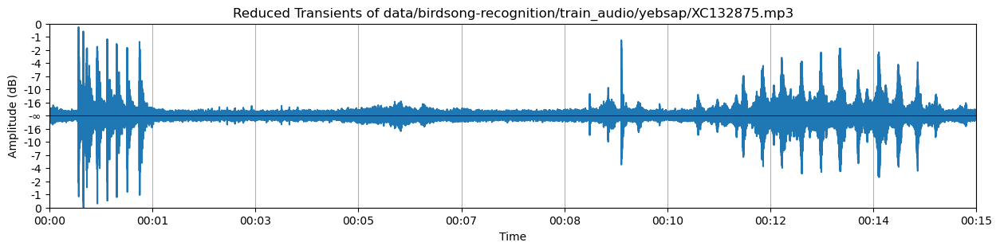

In [ ]:
filename = 'data/birdsong-recognition/train_audio/yebsap/XC132875.mp3'
sound = load_sound_file(filename)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=f'Waveform of {filename}')
signal = np.array(sound.get_array_of_samples())
signal = normalize_signal(signal)
signal = reduce_transients(signal, sound.frame_rate)
signal = normalize_signal(signal)
sound = signal_to_audio(signal, sound.frame_rate, denormalize=True)
plot_waveform(sound, title=f'Reduced Transients of {filename}')

The reduction is subtle but non negligable.

### 4. Segmentation of Audio into Normalized Windows

#### a) Splitting Files Around Silence
In some cases, all audio stops for a moment and the noise floor changes slightly. This was noticed in a few clips. To deal with this a function was written to cut those files into a list of smaller audio files wherever there are moments of silence.

In [ ]:
def split_around_silence(sounds: AudioSegment, size: number=5, threshold_rms: int=3) -> List[AudioSegment]:
    """Split an audio signal into segments around silence.
    
    Args:
        sounds (AudioSegment): The audio signal to split.
        size (number, optional): The minimum size of the segments in seconds. Defaults to 5.
        threshold_rms (int, optional): The threshold for the RMS value to determine silence. Defaults to 3.
        
    Returns:
        List[AudioSegment]: A list of the split audio segments.
    """
    sounds = sounds.split_to_mono() # Process each channel separately
    size = int(size * 1000) # Convert the size to milliseconds
    cut_sounds = [] # Initialize an empty list to store the cut sounds
    for sound in sounds: # Iterate through each channel
        last_cut = 0 # Initialize the last cut index
        for i in range(len(sound)): # Iterate through each sample
            if sound[i].rms <= threshold_rms: # If the RMS value is below the threshold
                if i - last_cut < size: # If the segment is too small
                    last_cut = i # Update the last cut index
                    continue # Skip to the next sample without cutting
                cut_sounds.append(sound[last_cut:i]) # Add the segment to the cut sounds if it is large enough
                last_cut = i # Update the last cut index
        if len(sound) - last_cut >= size: # If the last segment is large enough
            cut_sounds.append(sound[last_cut:]) # Add the last segment to the cut sounds
    return cut_sounds # Return the cut sounds

#### b) Windowing Files to 5s
And in order to group the files into a normalized format that could be understood with a time-frequency representation of the signal, the size of each signal would need to be normalized, so a function was written to break each signal into smaller overlapping windows, but because some birds did not make noises as frequenctly and some files contained longer moments of silence, if the window did not contains any signal that was above a set threshold, the window was thrown out and assumed to be only noise.

In [ ]:
def window_signal(signal: ndarray, sample_rate:int, window_size: number=5, hop_size: number=2.5, signal_threshold=0.15) -> List[ndarray]:
    """Split an audio signal into overlapping windows. Only include windows that have signal above the threshold.
    Can perform the calculation on either the CPU or GPU, depending on the input signal type.

    Args:
        signal (cp.ndarray | np.ndarray): The signal to split.
        sample_rate (int): The sample rate of the signal.
        window_size (int | float, optional): The size of the window in seconds. Defaults to 5.
        hop_size (int | float, optional): The hop size in seconds. Defaults to 1.
        signal_threshold (float, optional): The threshold for the signal. Defaults to 0.1.
    
    Returns:
        List[cp.ndarray|np.ndarray]: A list of the split signals. Matches input type.
    """
    math = np # Use numpy for CPU math operations by default
    if isinstance(signal, cp.ndarray):
        math = cp # Use CuPy for GPU math operations if the signal is a cupy array

    window_size = int(window_size * sample_rate) # Convert the window size to samples
    hop_size = int(hop_size * sample_rate) # Convert the hop size to samples

    windows = [] # Initialize an empty list to store the windows
    for i in range(0, len(signal) - window_size, hop_size): # Iterate through the signal
        window = signal[i:i+window_size] # Get the current window
        window_envelope = math.abs(hilbert_transform(window)) # Calculate the envelope of the window
        if math.max(window_envelope) > signal_threshold: # If the middle of the signal contains samples above the threshold
            windows.append(window) # Add the window to the list of windows
    return windows # Return the windows

Below is an example of what that looks like with all of the processing applied together, and how many signals can be produced from the one original datapoint. An owl is used as an example to highlight how some windows will be dropped in the case of no signal in the window. For 31 seconds of audio with a window size of 5 seconds and a hop size of 2.5 seconds there is a maximum of about 10 windows.

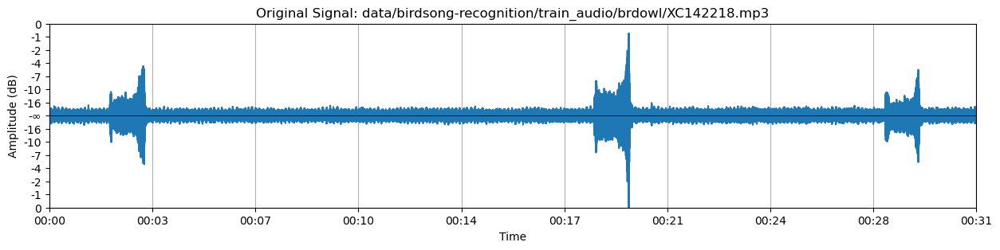

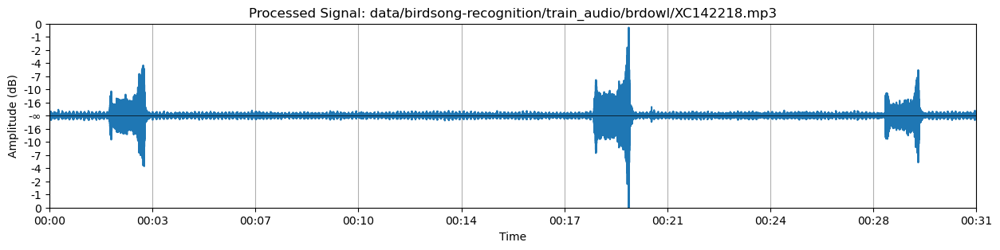

Number of windows: 5


In [ ]:
file = df[df.species_group == 'Owls'].filename.iloc[0]
sound = load_sound_file(file)
sound = sound.split_to_mono()[0]
plot_waveform(sound, title=f'Original Signal: {file}')
signal = np.array(sound.get_array_of_samples())
signal = normalize_signal(signal)
signal = reduce_noise_floor(signal, sound.frame_rate)
signal = reduce_clicks(signal, sound.frame_rate)
signal = reduce_transients(signal, sound.frame_rate)
signal = normalize_signal(signal)
sound = signal_to_audio(signal, sound.frame_rate, denormalize=True)
plot_waveform(sound, title=f'Processed Signal: {file}')
signals = window_signal(signal, sound.frame_rate)
print(f'Number of windows: {len(signals)}')

But only 5 windows wer captured. Presumable the empty space in the middle was dropped and this was made easier by its reduced magnitude from the noisefloor reduction.

## D. Generation of Filtered Datasets

### 1. Performing the Bulk Calculation
Now with all of these algorithms in place, a new dataset can be created with this signal preprocessing applied to it. Batches of files will be loaded into the GPU and each file will have each signal processing algorithm applied to it, and then it will be renormalized and split into overlapping windows. Each window will have a fourier transformation applied to it and that will be added to a new larger dataframe of cleaned signals. At the same time with the signal processing applied, because the signals will not be saved, a STFT will be applied to the signal and grouped into a 100x100 matrix of Bark spaced time-frequency signals of each 5 second window. This data set could be used in another convolutional neural network but this data was only captured in this notebook, the results of the STFT were not used for the training of any model, only the results of the Discrete Fourier Transformations.

In [ ]:
# Add folder to exports called filtered_data if it doesn't exist
if not os.path.exists('exports/filtered_data'):
    os.makedirs('exports/filtered_data')

In [ ]:
def generate_filtered_df_from_batch(batch: pd.DataFrame, display_handler: DisplayHandle) -> Tuple[pd.DataFrame, DisplayHandle]:
    """Generate a filtered dataframe from a batch of the original dataframe.
    Split all signals by silence and filter out the signals that are too short.
    For each signal, reduce the noise floor, clicks, and transients.
    Window each signal into overlapping 5 Second windows.
    Calculate the Short Time Fourier Transform of each window. Group that into a 100x100 matrix and store it in a file.
    Store the filename in the new dataframe.
    Calculate a Discrete Fourier Transform on the entire window. Store the results in the new dataframe.
    
    Args:
        batch (pd.DataFrame): The batch of the original dataframe to process.
        display_handler (DisplayHandle): The display handler to show the progress.
        
    Returns
    -------
     - **pd.DataFrame**: The new dataframe with the processed signals.
     - **DisplayHandle**: The display handler to show the progress.
    """
    clear_gpu_memory() # Clear the GPU memory

    # LOAD EVERYTHING INTO THE GPU FIRST FOR FASTER PROCESSING
    index_signal_sample = [] # Initialize an empty list to store the index, signal, and sample rate
    count = 0 # Initialize a counter
    for index, row in batch.iterrows(): # Iterate through the batch
        count += 1
        sound = load_sound_file(row.filename)
        sounds = split_around_silence(sound)

        # ENSURE NO SOUNDS ARE LONGER THAN 10 MINUTES (my poor GPU cant handle it)
        max_duration = 10 # Set the maximum duration in minutes
        max_duration *= 60*1000 # Convert the maximum duration to milliseconds
        short_sounds = [] # Initialize an empty list to store the short sounds
        for sound in sounds: # Iterate through the sounds
            if len(sound) < max_duration: # If the sound is not too long
                short_sounds.append(sound) # Add the sound to the short sounds
                continue # Skip to the next sound
            # if the sound is too long, split it in half until it is short enough
            cut_sounds = [sound] # Initialize a list to store the cut sounds
            while len(cut_sounds[0]) > max_duration: # While the sound is too long
                duration = len(cut_sounds[0]) # Get the duration of the sound
                first_half = [cut_sound[duration//2:] for cut_sound in cut_sounds] # Split the sound in half
                second_half = [cut_sound[:duration//2] for cut_sound in cut_sounds] # Split the sound in half
                cut_sounds = first_half + second_half # Combine the two halves
            short_sounds += cut_sounds # Add the cut sounds to the short sounds
        sounds = short_sounds # Set the sounds to the short sounds

        for sound in sounds:
            signal = cp.array(sound.get_array_of_samples())
            index_signal_sample.append((index, signal, sound.frame_rate))
        display_handler = print_progress_bar(count, len(batch), 'Splitting Files Around Silence and Loading to GPU', display_handler)
    
    # PROCESS THE SIGNALS
    index_window_sample = [] # Initialize an empty list to store the index, windows, and sample rate
    count = 0 # Initialize a counter
    for index, signal, sample_rate in index_signal_sample: # Iterate through the signals
        clear_gpu_memory() # Clear the GPU memory to get rid of remnants from the previous iteration
        count += 1
        signal = normalize_signal(signal) # Normalize the signal
        display_handler = print_progress_bar(count, len(index_signal_sample)*4, 'Reducing Noise Floor', display_handler)
        signal = reduce_noise_floor(signal, sample_rate) # Reduce the noise floor

        count += 1
        display_handler = print_progress_bar(count, len(index_signal_sample)*4, 'Reducing Clicks', display_handler)
        signal = reduce_clicks(signal, sample_rate) # Reduce the clicks
        
        count += 1
        display_handler = print_progress_bar(count, len(index_signal_sample)*4, 'Reducing Transients', display_handler)
        signal = reduce_transients(signal, sample_rate) # Reduce the transients

        count += 1
        display_handler = print_progress_bar(count, len(index_signal_sample)*4, 'Windowing Signal', display_handler)
        signal = normalize_signal(signal) # Re-Normalize the signal to the range [0,1]
        windows = window_signal(signal, sample_rate)
        for window in windows:
            index_window_sample.append((index, window, sample_rate))
    del index_signal_sample # Clear the variables from memory
    clear_gpu_memory() # Clear the GPU memory    

    # CALCULATE THE SHORT TIME FOURIER TRANSFORMS
    index_window_sample_filename = [] # Initialize an empty list to store the index, windows, sample rate, and filename
    count = 0 # Initialize a counter
    for index, window, sample_rate in index_window_sample:
        clear_gpu_memory() # Clear the GPU memory to get rid of remnants from the previous iteration
        count += 1
        window = normalize_signal(window) # Normalize the window
        f, _, Zxx = short_time_fourier_transform(window, sample_rate) # Calculate the Short Time Fourier Transform
        f, Zxx = group_time_frequencies(f, Zxx) # Group the time and frequency bins
        Zxx = magnitude_to_db(Zxx) # Convert the magnitudes to decibels
        Zxx = normalize_decibels(Zxx) # Normalize the decibels to the range [0,1]
        row = batch.loc[index].copy() # Copy the row from the original dataframe
        filename = row.filename.split('/')[-1].replace('.mp3', f'_{count}.npy')
        filename = f'exports/filtered_data/{row.ebird_code}/{filename}'
        if not os.path.exists(f'exports/filtered_data/{row.ebird_code}'):
            os.makedirs(f'exports/filtered_data/{row.ebird_code}')
        cp.save(filename, Zxx) # Save the matrix to a file
        index_window_sample_filename.append((index, window, sample_rate, filename))
        display_handler = print_progress_bar(count, len(index_window_sample), 'Calculating Short Time Fourier Transforms', display_handler)
        del f, Zxx # Clear the variables from memory
    del index_window_sample # Clear the variables from memory
    clear_gpu_memory() # Clear the GPU memory
    
    # CALCULATE THE DISCRETE FOURIER TRANSFORMS
    index_fft_filename = [] # Initialize an empty list to store the index, FFT, and filename
    count = 0 # Initialize a counter
    for index, window, sample_rate, filename in index_window_sample_filename:
        clear_gpu_memory() # Clear the GPU memory to get rid of remnants from the previous iteration
        count += 1
        frequncies, freq_signal = fourier_transform(window, sample_rate) # Calculate the Discrete Fourier Transform
        frequncies, freq_signal = group_frequencies(frequncies, freq_signal) # Group the frequencies
        freq_signal = magnitude_to_db(freq_signal) # Convert the magnitudes to decibels
        freq_signal = normalize_decibels(freq_signal) # Normalize the decibels to the range [0,1]
        index_fft_filename.append((index, freq_signal, filename)) # Add the index, FFT, and filename to the list
        display_handler = print_progress_bar(count, len(index_window_sample_filename), 'Calculating Discrete Fourier Transforms', display_handler)
        del frequncies # Clear the variables from memory
    del index_window_sample_filename # Clear the variables from memory
    clear_gpu_memory() # Clear the GPU memory
    
    # CREATE THE NEW DATAFRAME
    new_df = pd.DataFrame(columns=batch.columns) # Initialize a new dataframe
    index_fft_filename = [(index, freq_signal.get(), filename) for index, freq_signal, filename in index_fft_filename] # Convert the FFT signals to numpy arrays
    count = 0 # Initialize a counter
    for index, freq_signal, filename in index_fft_filename:
        count += 1
        row = batch.loc[index].copy() # Copy the row from the original dataframe
        row.stft_path = filename
        row.duration = 5
        freq_bins = get_bark_spaced_frequencies(100, np.__name__) # Get the Bark spaced frequencies
        for freq, value in zip(freq_bins, freq_signal):
            row[f'{int(freq)}Hz'] = value
        new_df = pd.concat([new_df, pd.DataFrame([row])])
        display_handler = print_progress_bar(count, len(index_fft_filename), 'Creating New DataFrame', display_handler)
    
    del index_fft_filename # Clear the variables from memory
    clear_gpu_memory() # Clear the GPU memory
    return new_df, display_handler

The below code is for setting up the new dataframe, and also checking to see if there is a cache of the previous run, because this render took over 40 hours to finish, if it ended early I wanted to be able to restart it without progress loss.

In [ ]:
df['duration'] = df['duration'].apply(lambda x: int(x)) # Convert the duration to an integer to round off the decimal
df['stft_path'] = '' # Add a column for the STFT path

if os.path.exists('exports/filtered_df.csv'): # If the filtered dataframe exists
    filtered_df = pd.read_csv('exports/filtered_df.csv') # Load the filtered dataframe. This is the last saved state of the dataframe, This render was too long to wait for in one go
else:
    filtered_df = pd.DataFrame(columns=df.columns)
    freq_bins = get_bark_spaced_frequencies(100, np.__name__) # Get the Bark spaced frequencies
    for freq in freq_bins: # Add a column for each frequency
        filtered_df[f'{int(freq)}Hz'] = 0
    filtered_df = filtered_df.copy() # Defragment the dataframe
new_df = filtered_df.copy() # Copy the filtered dataframe to the new dataframe

unprocessed_df = df[~df.filename.isin(filtered_df.filename)] # Get the unprocessed files

However in practice there was a small number of files that did not get moved into the new datafram at all either because of issues in windowing, or errors from the signal processes. The number of problem files is small enough to not matter so another chunk of code was added to disable the next render if the `unprocessed_df` contains less than 5GB of files. This is an arbutrary case just set up to prevent this specific reprocess.

In [ ]:
size_minimum = 5 # Set the minimum size of the unprocessed df in GB
size_minimum *= 1024**3 # Convert the size to bytes
if unprocessed_df.total_array_size.sum() < size_minimum: # If the total size of the unprocessed files is less than the minimum size
    unprocessed_df = pd.DataFrame(columns=unprocessed_df.columns) # Set the unprocessed dataframe to an empty dataframe

In [ ]:
if unprocessed_df.shape[0] == 0:
    print_boundry('All files have been processed')
else:
    print_boundry('Creating Filtered DataFrame')

    start_time = time.time() # Start the timer
    batch_display_handler = None # Initialize the batch display handler
    total_display_handler = print_progress_bar(0,
                                                unprocessed_df.total_array_size.sum(),
                                                calculate_time_remaining(start_time, 0, df.total_array_size.sum()),
                                                treat_as_data=True) # Initialize the total display handler
    batch_size_limit = 128 # Set the batch size limit in megabytes
    batch_size_limit *= 1024**2 # Convert the batch size limit to bytes
    processed_data = 0 # Initialize the processed data
    batch_size = 0 # Initialize the batch size
    batch = [] # Initialize the batch

    index = 0 # Initialize the index to outside of the for loop to be able to access the "next" row from the for loop itself.
    row = unprocessed_df.iloc[0] # Initialize the row aswell
    for next_index, next_row in unprocessed_df.iloc[1:].iterrows():
        batch.append(row) # Add the row to the batch
        batch_size += row.total_array_size # Add the size of the row to the batch size
        if batch_size + next_row.total_array_size > batch_size_limit: # If the batch size is too large
            processed_data += batch_size # Add the batch size to the processed data
            batch = pd.DataFrame(batch)
            batch_df, batch_display_handler = generate_filtered_df_from_batch(batch, batch_display_handler) # Generate the filtered dataframe from the batch
            new_df = pd.concat([new_df, batch_df], ignore_index=True) # Add the batch dataframe to the new dataframe
            total_display_handler = print_progress_bar(processed_data,
                                                        unprocessed_df.total_array_size.sum(),
                                                        calculate_time_remaining(start_time, processed_data, unprocessed_df.total_array_size.sum()),
                                                        display_handler=total_display_handler,
                                                        treat_as_data=True)
            new_df.to_csv('exports/filtered_df.csv', index=False) # Save the new dataframe to a CSV file
            batch = [] # Reset the batch
            batch_size = 0 # Reset the batch size
        index = next_index
        row = next_row
    batch.append(row) # Add the last row to the batch
    batch = pd.DataFrame(batch)
    batch_df, batch_display_handler = generate_filtered_df_from_batch(batch, batch_display_handler) # Generate the filtered dataframe from the batch
    new_df = pd.concat([new_df, batch_df], ignore_index=True) # Add the batch dataframe to the new dataframe
    total_display_handler = print_progress_bar(processed_data,
                                                unprocessed_df.total_array_size.sum(),
                                                calculate_time_remaining(start_time, processed_data, unprocessed_df.total_array_size.sum()),
                                                display_handler=total_display_handler,
                                                treat_as_data=True)
    new_df.to_csv('exports/filtered_df.csv', index=False) # Save the new dataframe to a CSV file
    print_boundry('Filtered DataFrame Created')

filtered_df = pd.read_csv('exports/filtered_df.csv')
print_boundry('Loaded Filtered DataFrame')

----------------------------------- All files have been processed -----------------------------------
------------------------------------- Loaded Filtered DataFrame -------------------------------------


This process took over 45 hours to finish completing.

In [ ]:
for column in filtered_df.columns:
    if filtered_df[column].isnull().sum() > 0:
        print(f'Column: {column} has {filtered_df[column].isnull().sum()} null values')

# Replace null values with 0
filtered_df.fillna(0, inplace=True)

print(f'Number of rows in the filtered dataframe after fixing nulls: {filtered_df.shape[0]}') # Print the number of rows in the filtered dataframe

Column: 17676Hz has 1096 null values
Column: 19999Hz has 1096 null values
Number of rows in the filtered dataframe after fixing nulls: 460679


### 2. Visualizing the Resulting Data
The same function used to visualize the last dataset can be fet the new dataframe with no adjustments. This new dataset is considerably larger so the headmaps will take longer to render and should be "fuzzier".

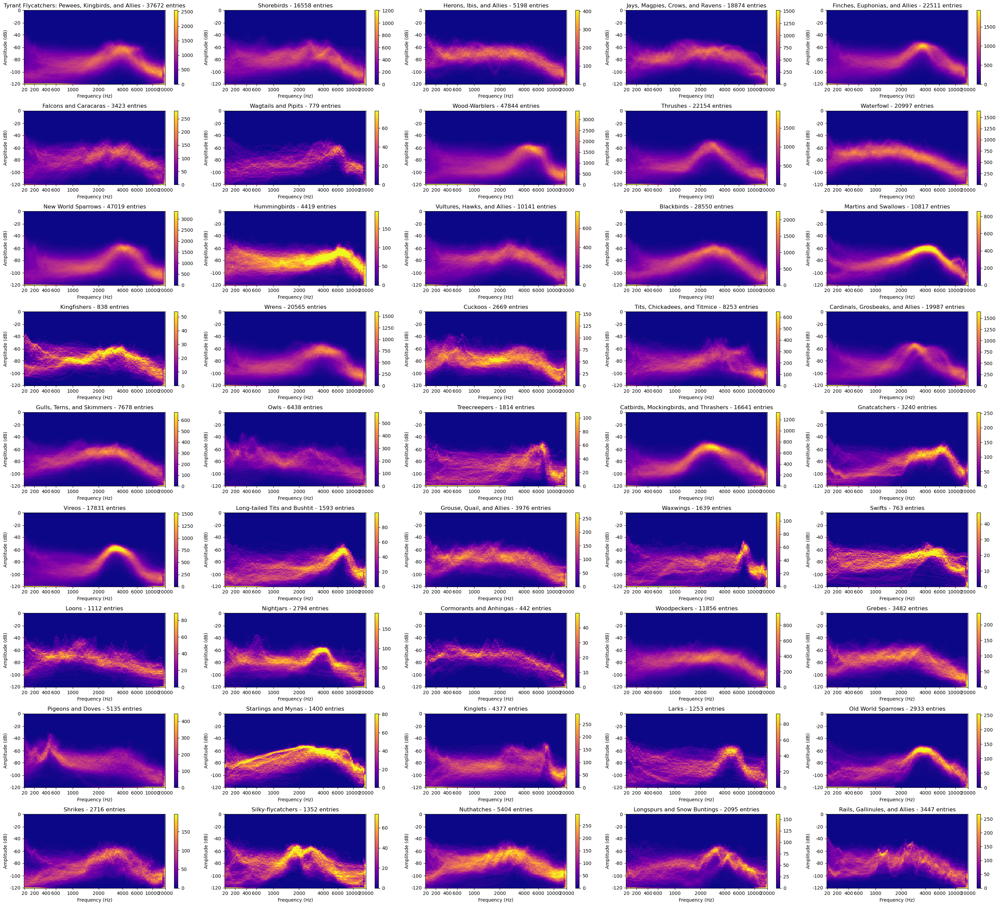

In [ ]:
plot_heatmap_matrix(filtered_df, column='species_group', normalization_scale=12.5)

# § IV. Model Training and Evaluation

## A. Simple Frequency Representation Dataset

In [ ]:
X = raw_frequency_df.drop(columns=['rating', 'ebird_code', 'filename', 'channels', 'duration', 'sampling_rate', 'type', 'file_type', 'common_name', 'sci_name', 'order', 'family', 'species_group', 'array_size', 'total_array_size'])
y = raw_frequency_df['species_group']

print(f'Non-Audio Features: {[col for col in X.columns if col[-2:] != "Hz"]}')
print(f'Number of Audio Features: {len([col for col in X.columns if col[-2:] == "Hz"])}')

Non-Audio Features: ['date', 'latitude', 'elevation', 'longitude', 'time']
Number of Audio Features: 100


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # random state for reproducibility after picking

### 1. Classification with a K-Nearest Neighbors Model
The first algorithm used was a K-Nearest Neighbors model which at its core makes a lot of sense with this data. To predict the species of bird, a new file would be compared with the files with the closest time, date, location, and frequency response. A few models were tested with the entire dataset with a cross-validation scoring function.

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)
crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
print(f'n=1 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}')

knn = KNeighborsClassifier(n_neighbors=2)
crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
print(f'n=2 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}')

knn = KNeighborsClassifier(n_neighbors=5)
crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
print(f'n=5 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}')

knn = KNeighborsClassifier(n_neighbors=7)
crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
print(f'n=7 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}')

knn = KNeighborsClassifier(n_neighbors=10)
crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
print(f'n=10 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}')

n=1 Cross Validation Score: 58.19% ± 0.21%
n=2 Cross Validation Score: 43.10% ± 0.51%
n=5 Cross Validation Score: 34.54% ± 0.71%
n=7 Cross Validation Score: 33.97% ± 0.43%
n=10 Cross Validation Score: 33.49% ± 0.51%


Surprisingly this model performed the best by only looking at the single closest datapoint. The score of 58% is quite low, but with an output array of over 50 this is *considerably* better than chance. With that model a full classification report was made comparing all of the individual accuracies of each bird in the model.

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(classification_report(y_test, y_pred))

                                                   precision    recall  f1-score   support

                                       Blackbirds       0.56      0.56      0.56       308
                 Cardinals, Grosbeaks, and Allies       0.57      0.70      0.63       199
            Catbirds, Mockingbirds, and Thrashers       0.60      0.73      0.66       105
                          Cormorants and Anhingas       0.29      0.50      0.36         8
                                          Cuckoos       0.77      0.67      0.72        49
                            Falcons and Caracaras       0.69      0.74      0.71        57
                   Finches, Euphonias, and Allies       0.62      0.71      0.66       289
                                     Gnatcatchers       0.79      0.69      0.73        32
                                           Grebes       0.78      0.64      0.70        66
                        Grouse, Quail, and Allies       0.73      0.69      0.71        6

This model actually performed a little better than the cross validation predicted. Some birds performed quite well, Larks performed at 92% accuracy, Pidgeons and Doves performed at 82% accuracy, Starlings and Mynas performed at 93% accuracy, but many other birds performed quite poorly. Loons only 17% accuracy, Kingfishers at 32% accuracy, and Gnattcatchers at 34% accuracy.

### 2. Classification with a Decision Tree Model
A Decision Tree Model was also run on the same data in order with the hopes its structure would provide a simpler means of classification.

###### (This model takes much longer to run this so the results are cached)

In [ ]:
if not os.path.exists('exports/simple_df_dt_classifier_benchmark.txt'):
    with open('exports/simple_df_dt_classifier_benchmark.txt', 'w') as file:
        dt = DecisionTreeClassifier(max_depth=5)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 5 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=10)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 10 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=25)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 25 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=50)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 50 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=100)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 100 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=250)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 250 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)
else:
    with open('exports/simple_df_dt_classifier_benchmark.txt', 'r') as file:
        for line in file:
            print(line.strip())

Decision Tree 5 Cross Validation Score: 20.74% ± 0.25%

Decision Tree 10 Cross Validation Score: 28.29% ± 0.66%

Decision Tree 25 Cross Validation Score: 42.65% ± 0.85%

Decision Tree 50 Cross Validation Score: 43.97% ± 0.89%

Decision Tree 100 Cross Validation Score: 43.88% ± 0.53%

Decision Tree 250 Cross Validation Score: 44.00% ± 0.77%



This model did not prove to be effective however.

In [ ]:
dt = DecisionTreeClassifier(max_depth=105)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
print(classification_report(y_test, y_pred))

                                                   precision    recall  f1-score   support

                                       Blackbirds       0.43      0.41      0.42       308
                 Cardinals, Grosbeaks, and Allies       0.40      0.52      0.45       199
            Catbirds, Mockingbirds, and Thrashers       0.51      0.53      0.52       105
                          Cormorants and Anhingas       0.67      0.50      0.57         8
                                          Cuckoos       0.40      0.39      0.39        49
                            Falcons and Caracaras       0.36      0.37      0.36        57
                   Finches, Euphonias, and Allies       0.46      0.52      0.48       289
                                     Gnatcatchers       0.46      0.53      0.49        32
                                           Grebes       0.34      0.33      0.34        66
                        Grouse, Quail, and Allies       0.37      0.34      0.35        6

The best practical accuracy achieved was 50%, and there were no standout birds that were easier to classify this way.

### 3. Classification with a Neural Network (Multi-Layer Perceptron)
A basic neural network poses the unique ability to extract novel insights from a dataset inside of hidden layers that are iterated against and this method has proven to be very effective at some tasks that closely resemble this frequency analysis. A function was made to train the neural network and display a loading bar on its training progress, and test the accuracy of the dataset print that out. Because of the many tests and large dataset and training times, the model and results of the training and accuracy are cached to prevent retraining.

In [ ]:
def train_neural_network(max_iterations: int, learning_rate: float, hidden_layers: List[int], dataset_name: str) -> None:
    """Train a neural network on the dataset with the specified parameters.
    Always uses the global variables X_train, X_test, y_train, and y_test.
    Runs the training through the MLPTrainingMonitor class for live updates.
    Caches results of the training in the exports folder.

    Args:
        max_iterations (int): The maximum number of iterations to train the network for.
        learning_rate (float): The learning rate of the network.
        hidden_layers (List[int]): The number of neurons in each hidden layer.
        dataset_name (str): The name of the dataset used for naming the cached results.
    """
    if not os.path.exists(f'exports/{dataset_name}'): # Ensure the dataset folder exists
        os.makedirs(f'exports/{dataset_name}')

    path = f'exports/{dataset_name}/nn_{'-'.join(map(str, hidden_layers))}_{max_iterations}_{learning_rate}' # Create the path for the cached results
    if os.path.exists(f'{path}'): # If the cached results exist
        with MLPTrainingMonitor.monitor_engine():
            MLPTrainingMonitor.display_training(path) # Display the cached results
        return pickle.load(open(f'{path}/model.pkl', 'rb')) # Return the cached model
    
    os.makedirs(path) # Create the folder for the cached results
    nn = MLPClassifier(max_iter=max_iterations,
                       solver='sgd',
                       early_stopping=False,
                       verbose=True, # Display the training progress or else the monitor will not work
                       hidden_layer_sizes=hidden_layers,
                       learning_rate_init=learning_rate,
                       learning_rate='adaptive',
                       tol=0, alpha=0, beta_1=0, beta_2=0) # Initialize the neural network
    
    with MLPTrainingMonitor.monitor_engine():
        MLPTrainingMonitor.setup_training(max_iterations, learning_rate) # Setup the training
        nn.fit(X_train, y_train)
        MLPTrainingMonitor.end_training(path) # End the training
        with open(f'{path}/model.pkl', 'wb') as file: # Save the model to a file
            pickle.dump(nn, file)
            
    nn = pickle.load(open(f'{path}/model.pkl', 'rb')) # Load the model from the file
    y_pred = nn.predict(X_test) # Predict the test set
    accuracy = accuracy_score(y_test, y_pred) # Calculate the overall accuracy
    accuracy = f'Ovearll Accuracy: {accuracy:.2%}' # Format the accuracy
    with open(f'{path}/accuracy.txt', 'w') as file: # Save the accuracy to a file
        file.write(accuracy)
    print(accuracy) # Print the accuracy
    return nn

First a small hidden layer setup was tested.

In [ ]:
train_neural_network(1000, 0.01, [500, 50], 'raw_frequency_df')
train_neural_network(1000, 0.05, [500, 50], 'raw_frequency_df')

MLPClassifier(alpha=0, beta_1=0, beta_2=0, hidden_layer_sizes=[500, 50],
              learning_rate='adaptive', learning_rate_init=0.05, max_iter=1000,
              solver='sgd', tol=0, verbose=True)

This already is prodicing a better accuracy result. More tests were run with a `[1000,100]` shaped hidden layer.

In [ ]:
train_neural_network(1000, 0.01, [1000, 100], 'raw_frequency_df')
train_neural_network(1000, 0.05, [1000, 100], 'raw_frequency_df')

MLPClassifier(alpha=0, beta_1=0, beta_2=0, hidden_layer_sizes=[1000, 100],
              learning_rate='adaptive', learning_rate_init=0.05, max_iter=1000,
              solver='sgd', tol=0, verbose=True)

This is an improvement over the last as well. The hidden layer size was incresed even further.

In [ ]:
train_neural_network(2000, 0.01, [5000, 100] , 'raw_frequency_df')
train_neural_network(1000, 0.05, [5000, 100] , 'raw_frequency_df')

MLPClassifier(alpha=0, beta_1=0, beta_2=0, hidden_layer_sizes=[5000, 100],
              learning_rate='adaptive', learning_rate_init=0.05, max_iter=1000,
              solver='sgd', tol=0, verbose=True)

Other models were tested but no model was able to perform better than the `[5000,100]` shaped networks, even models that were exponentially larger and took exponentially more time. Even this model took at its best performance over an hour to train with only marginally better accuracy than the `[1000,100]` shaped network.

In [ ]:
nn = train_neural_network(1000, 0.05, [5000, 100], 'raw_frequency_df') # Load the now cached model with the best performance
y_pred = nn.predict(X_test) # Predict the test set
print(accuracy_score(y_test, y_pred)) # Print the overall accuracy
print(classification_report(y_test, y_pred)) # Print the classification report

0.7122736418511066
                                                   precision    recall  f1-score   support

                                       Blackbirds       0.64      0.58      0.61       308
                 Cardinals, Grosbeaks, and Allies       0.64      0.70      0.67       199
            Catbirds, Mockingbirds, and Thrashers       0.67      0.76      0.71       105
                          Cormorants and Anhingas       0.67      0.75      0.71         8
                                          Cuckoos       0.76      0.57      0.65        49
                            Falcons and Caracaras       0.73      0.79      0.76        57
                   Finches, Euphonias, and Allies       0.74      0.78      0.76       289
                                     Gnatcatchers       0.63      0.69      0.66        32
                                           Grebes       0.71      0.61      0.66        66
                        Grouse, Quail, and Allies       0.67      0.66

### 4. Using this model to to predict the type of bird from a file.
Now that there is a basic model, a function was written to preprocess a single file so that it could be predicted by the model. This is not a real deployment solution just a means of organizing and precleaning the audio file with the other metadata from a row in the dataframe. This does not pull data directly from the test dataset, because that abstracts away the original sound from the data and there is no information in the feature list that could return back to the audio that was recorded originally, so in order to display what the original sound was before preprocessing, the data was pulled from rows in the original dataframe.

In [ ]:
def row_to_predictanble_row(row: pd.Series) -> Tuple[pd.Series, AudioSegment]:
    """Convert a row from the df to a row that can be used to predict the species group.
    
    Args:
        row (pd.Series): The row to convert.
    
    Returns
    -------
     - **pd.Series**: The converted row.
     - **AudioSegment**: The audio signal.
    """
    filename = row.filename
    row = row.drop(['rating', 'ebird_code', 'filename', 'channels', 'duration', 'sampling_rate', 'type', 'file_type', 'common_name', 'sci_name', 'order', 'family', 'species_group', 'array_size', 'total_array_size', 'stft_path']) # Drop the non-audio features
    sound = load_sound_file(filename) # Load the sound file
    sound = sound.split_to_mono()[0] # Convert the sound to mono
    signal = np.array(sound.get_array_of_samples()) # Get the signal as an array
    signal = normalize_signal(signal) # Normalize the signal
    frequncies, freq_signal = fourier_transform(signal, sound.frame_rate) # Calculate the Discrete Fourier Transform
    frequncies, freq_signal = group_frequencies(frequncies, freq_signal) # Group the frequencies
    freq_signal = magnitude_to_db(freq_signal) # Convert the magnitudes to decibels
    freq_signal = normalize_decibels(freq_signal) # Normalize the decibels to the range [0,1]
    freq_bins = get_bark_spaced_frequencies(100, np.__name__) # Get the Bark spaced frequencies
    for freq, value in zip(freq_bins, freq_signal): # Add the frequencies to the row
        row[f'{int(freq)}Hz'] = value
    return row, sound

This function was applied to predict the species group of a few types of birds, their fourier analysis that was visable by the machine learning model was displayed and the pridiction was calcuated by the model and displayed.

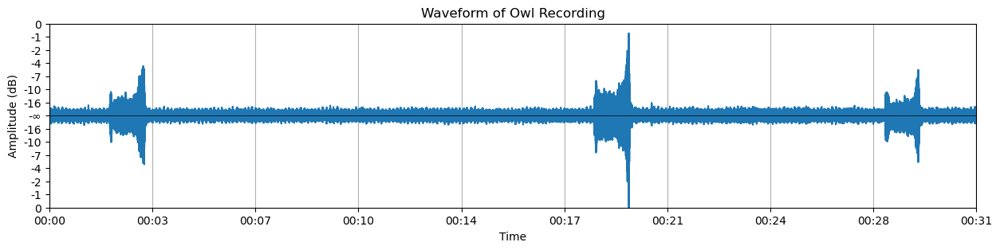

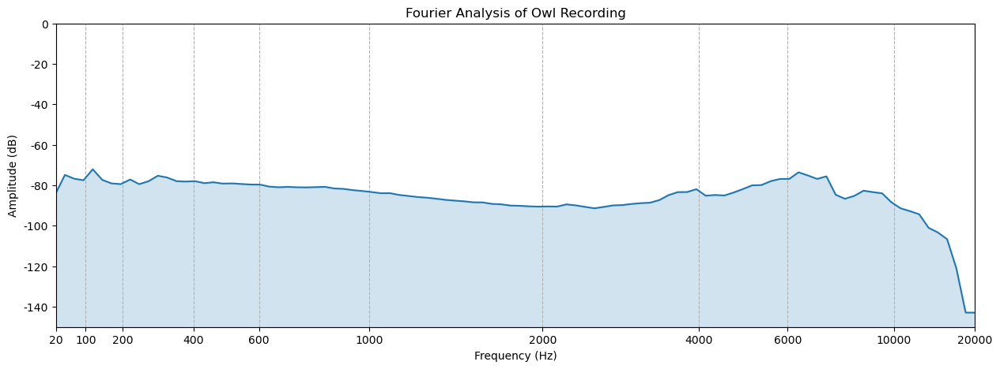

Predicted Species Group: Owls


In [ ]:
row = df[df.species_group == 'Owls'].iloc[0] # Get an owl from the dataframe
row, sound = row_to_predictanble_row(row) # Convert the row to a predictanble row
sound.export('exports/owl.wav', format='wav') # Export the owl to a WAV file
plot_waveform(sound, title='Waveform of Owl Recording') # Plot the waveform of the owl
plot_fourier_analysis(sound, title='Fourier Analysis of Owl Recording') # Plot the Fourier analysis of the owl
prediction = nn.predict(pd.DataFrame([row])) # Predict the species group
print(f'Predicted Species Group: {prediction[0]}') # Print the predicted species group

<audio controls>
  <source src="exports/owl.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

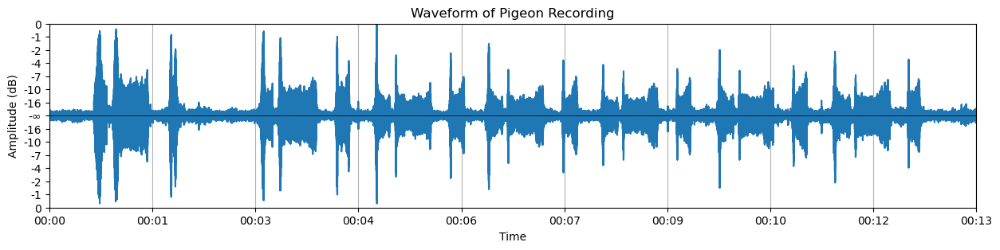

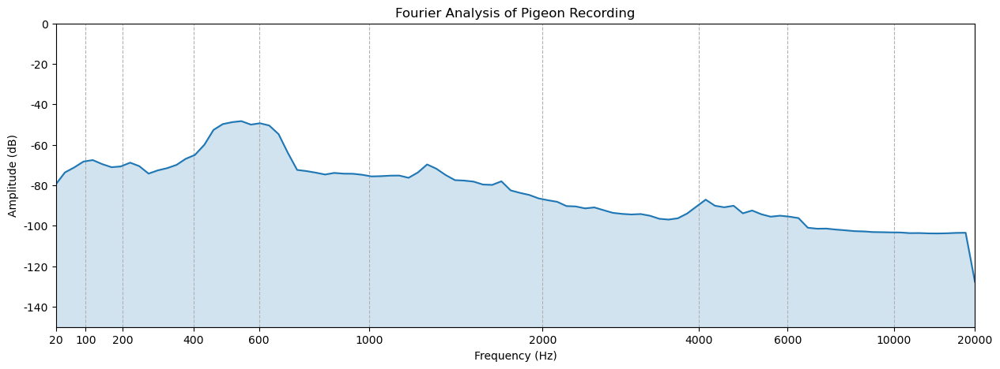

Predicted Species Group: Pigeons and Doves


In [ ]:
row = df[df.species_group == 'Pigeons and Doves'].iloc[0] # Get a pigeon from the dataframe
row, sound = row_to_predictanble_row(row) # Convert the row to a predictanble row
sound.export('exports/pigeon.wav', format='wav') # Export the pigeon to a WAV file
plot_waveform(sound, title='Waveform of Pigeon Recording') # Plot the waveform of the pigeon
plot_fourier_analysis(sound, title='Fourier Analysis of Pigeon Recording') # Plot the Fourier analysis of the pigeon
prediction = nn.predict(pd.DataFrame([row])) # Predict the species group
print(f'Predicted Species Group: {prediction[0]}') # Print the predicted species group

<audio controls>
  <source src="exports/pigeon.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

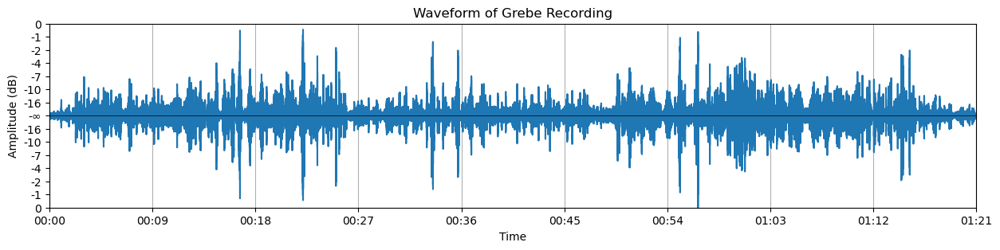

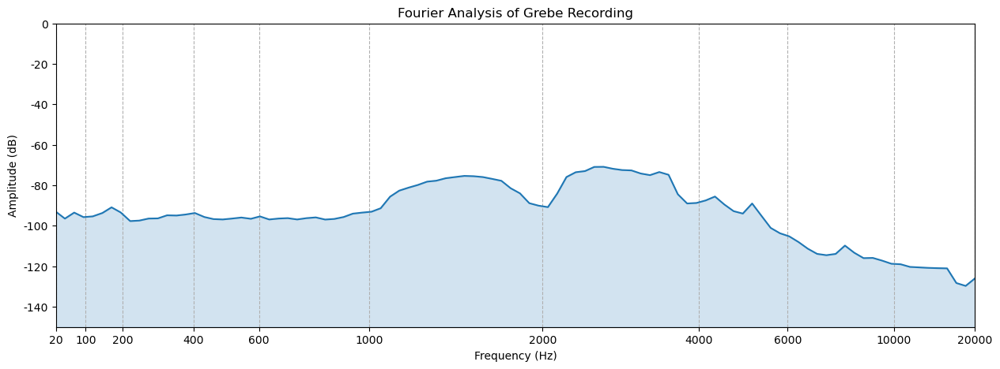

Predicted Species Group: Grebes


In [ ]:
row = df[df.species_group == 'Grebes'].iloc[0] # Get a grebe from the dataframe
row, sound = row_to_predictanble_row(row) # Convert the row to a predictanble row
sound.export('exports/grebe.wav', format='wav') # Export the grebe to a WAV file
plot_waveform(sound, title='Waveform of Grebe Recording') # Plot the waveform of the grebe
plot_fourier_analysis(sound, title='Fourier Analysis of Grebe Recording') # Plot the Fourier analysis of the grebe
prediction = nn.predict(pd.DataFrame([row])) # Predict the species group
print(f'Predicted Species Group: {prediction[0]}') # Print the predicted species group

<audio controls>
  <source src="exports/grebe.wav" type="audio/wav">
Your browser does not support the audio element, but this sounds like a really short chirp.
</audio>

## B. Filtered Frequency Representation Dataset

In [ ]:
X = filtered_df.drop(columns=['rating', 'ebird_code', 'filename', 'channels', 'duration', 'sampling_rate', 'type', 'file_type', 'common_name', 'sci_name', 'order', 'family', 'species_group', 'array_size', 'total_array_size', 'stft_path'])
y = filtered_df['species_group']

print_ranges(X) # Print the ranges of the columns

date Range Interval: [0.0,0.989041095890411]
date Span: 0.989041095890411
latitude Range Interval: [0.2046555555555555,0.9384894444444444]
latitude Span: 0.7338338888888889
elevation Range Interval: [0.0534591194968553,1.5220125786163523]
elevation Span: 1.468553459119497
longitude Range Interval: [0.0229255555555555,0.997172777777778]
longitude Span: 0.9742472222222225
time Range Interval: [0.0,0.9965277777777778]
time Span: 0.9965277777777778
20Hz Range Interval: [0.0,0.7825707815933107]
20Hz Span: 0.7825707815933107
44Hz Range Interval: [0.0,0.7686103681871362]
44Hz Span: 0.7686103681871362
69Hz Range Interval: [0.0,0.7584942562480692]
69Hz Span: 0.7584942562480692
94Hz Range Interval: [0.0,0.7349258011101802]
94Hz Span: 0.7349258011101802
119Hz Range Interval: [0.0,0.7563238355116674]
119Hz Span: 0.7563238355116674
145Hz Range Interval: [0.0,0.741847915215785]
145Hz Span: 0.741847915215785
170Hz Range Interval: [0.0,0.7337568664230117]
170Hz Span: 0.7337568664230117
195Hz Range Int

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # Random state for reproducibility after picklicking

### 1. Classification with a K-Nearest Neighbors Model

In [ ]:
if not os.path.exists('exports/filtered_df_knn_classifier_benchmark.txt'):
    with open('exports/filtered_df_knn_classifier_benchmark.txt', 'w') as file:
        knn = KNeighborsClassifier(n_neighbors=1)
        crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
        crossval_score = f'n=1 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(crossval_score)
        file.write(crossval_score + '\n')

        knn = KNeighborsClassifier(n_neighbors=2)
        crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
        crossval_score = f'n=2 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(crossval_score)
        file.write(crossval_score + '\n')

        knn = KNeighborsClassifier(n_neighbors=5)
        crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
        crossval_score = f'n=5 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(crossval_score)
        file.write(crossval_score + '\n')

        knn = KNeighborsClassifier(n_neighbors=7)
        crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
        crossval_score = f'n=7 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(crossval_score)
        file.write(crossval_score + '\n')

        knn = KNeighborsClassifier(n_neighbors=10)
        crossval_score = cross_val_score(knn, X_train, y_train, cv=5)
        crossval_score = f'n=10 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(crossval_score)
        file.write(crossval_score + '\n')
else:
    with open('exports/filtered_df_knn_classifier_benchmark.txt', 'r') as file:
        for line in file:
            print(line.strip())

n=1 Cross Validation Score: 95.22% ± 0.05%
n=2 Cross Validation Score: 92.39% ± 0.03%
n=5 Cross Validation Score: 89.57% ± 0.05%
n=7 Cross Validation Score: 87.84% ± 0.02%
n=10 Cross Validation Score: 85.58% ± 0.05%


Again low n_neighbors values are the best here. This efficency is quite high, its possible there is some detection of other noise floors from the datast. This may be a result of overfitting.

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(classification_report(y_test, y_pred))

                                                   precision    recall  f1-score   support

                                       Blackbirds       0.96      0.95      0.95      5742
                 Cardinals, Grosbeaks, and Allies       0.94      0.95      0.95      3920
            Catbirds, Mockingbirds, and Thrashers       0.96      0.96      0.96      3362
                          Cormorants and Anhingas       0.97      0.99      0.98        93
                                          Cuckoos       0.97      0.97      0.97       537
                            Falcons and Caracaras       0.99      0.96      0.98       707
                   Finches, Euphonias, and Allies       0.96      0.97      0.97      4477
                                     Gnatcatchers       0.97      0.97      0.97       628
                                           Grebes       0.98      0.97      0.98       741
                        Grouse, Quail, and Allies       0.96      0.97      0.97       79

### 2. Classification with a Decision Tree Model

In [ ]:
if not os.path.exists('exports/filtered_df_dt_classifier_benchmark.txt'):
    with open('exports/filtered_df_dt_classifier_benchmark.txt', 'w') as file:
        dt = DecisionTreeClassifier(max_depth=5)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 5 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=10)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 10 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=25)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 25 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=50)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 50 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=100)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 100 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)

        dt = DecisionTreeClassifier(max_depth=250)
        crossval_score = cross_val_score(dt, X_train, y_train, cv=5)
        message = f'Decision Tree 250 Cross Validation Score: {crossval_score.mean():.2%} ± {crossval_score.std():.2%}\n'
        print(message)
        file.write(message)
else:
    with open('exports/filtered_df_dt_classifier_benchmark.txt', 'r') as file:
        for line in file:
            print(line.strip())

Decision Tree 5 Cross Validation Score: 23.60% ± 0.37%
Decision Tree 10 Cross Validation Score: 35.89% ± 0.18%
Decision Tree 25 Cross Validation Score: 73.47% ± 0.81%
Decision Tree 50 Cross Validation Score: 78.73% ± 0.53%
Decision Tree 100 Cross Validation Score: 78.74% ± 0.55%
Decision Tree 250 Cross Validation Score: 78.66% ± 0.52%


This is a substantial improvement from the precious setup, but still the worst of the 3.

In [ ]:
dt = DecisionTreeClassifier(max_depth=105)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
print(classification_report(y_test, y_pred))

                                                   precision    recall  f1-score   support

                                       Blackbirds       0.79      0.79      0.79      5742
                 Cardinals, Grosbeaks, and Allies       0.78      0.78      0.78      3920
            Catbirds, Mockingbirds, and Thrashers       0.83      0.83      0.83      3362
                          Cormorants and Anhingas       0.76      0.70      0.73        93
                                          Cuckoos       0.80      0.76      0.78       537
                            Falcons and Caracaras       0.79      0.78      0.79       707
                   Finches, Euphonias, and Allies       0.81      0.83      0.82      4477
                                     Gnatcatchers       0.81      0.82      0.82       628
                                           Grebes       0.81      0.79      0.80       741
                        Grouse, Quail, and Allies       0.82      0.82      0.82       79

### 3. Classification with a Neural Network (Multi-Layer Perceptron)

In [ ]:
train_neural_network(1000, 0.01, [500, 50], 'filtered_df')
train_neural_network(1000, 0.05, [500, 50], 'filtered_df')

MLPClassifier(alpha=0, beta_1=0, beta_2=0, hidden_layer_sizes=[500, 50],
              learning_rate='adaptive', learning_rate_init=0.05, max_iter=1000,
              solver='sgd', tol=0, verbose=True)

In [ ]:
train_neural_network(1000, 0.01, [1000, 100], 'filtered_df')
train_neural_network(1000, 0.05, [1000, 100], 'filtered_df')

MLPClassifier(alpha=0, beta_1=0, beta_2=0, hidden_layer_sizes=[1000, 100],
              learning_rate='adaptive', learning_rate_init=0.05, max_iter=1000,
              solver='sgd', tol=0, verbose=True)

In [ ]:
#train_neural_network(2000, 0.01, [5000, 100] , 'filtered_df') # Training this model takes too long
#train_neural_network(1000, 0.05, [5000, 100] , 'filtered_df') # Culd have completedit but these two lines estimate 60 hours render time

In [ ]:
nn = train_neural_network(1000, 0.01, [1000, 100], 'filtered_df') # Load the now cached model with the best performance
y_pred = nn.predict(X_test) # Predict the test set
print(accuracy_score(y_test, y_pred)) # Print the overall accuracy
print(classification_report(y_test, y_pred)) # Print the classification report

0.9303095424155596
                                                   precision    recall  f1-score   support

                                       Blackbirds       0.92      0.91      0.91      5742
                 Cardinals, Grosbeaks, and Allies       0.91      0.91      0.91      3920
            Catbirds, Mockingbirds, and Thrashers       0.95      0.93      0.94      3362
                          Cormorants and Anhingas       0.90      0.92      0.91        93
                                          Cuckoos       0.91      0.93      0.92       537
                            Falcons and Caracaras       0.95      0.93      0.94       707
                   Finches, Euphonias, and Allies       0.94      0.94      0.94      4477
                                     Gnatcatchers       0.94      0.94      0.94       628
                                           Grebes       0.93      0.90      0.91       741
                        Grouse, Quail, and Allies       0.94      0.91

May still be a result of overfitting but if not this is a remarkably sucessful model.

### 4. Using this model to to predict the type of bird from a file.

In [ ]:
def row_to_filtered_predictanble_row(row: pd.Series) -> Tuple[pd.Series, AudioSegment]:
    """Convert a row from the df to a row that can be used to predict the species group with filtered audio data.
    
    Args:
        row (pd.Series): The row to convert.
    
    Returns
    -------
     - **pd.Series**: The converted row.
     - **AudioSegment**: The audio signal of the sound without any filtering. This is for displaying the original input audio signal.
    """
    filename = row.filename
    row = row.drop(['rating', 'ebird_code', 'filename', 'channels', 'duration', 'sampling_rate', 'type', 'file_type', 'common_name', 'sci_name', 'order', 'family', 'species_group', 'array_size', 'total_array_size', 'stft_path']) # Drop the non-audio features
    sound = load_sound_file(filename) # Load the sound file
    sound = sound.split_to_mono()[0] # Convert the sound to mono
    signal = np.array(sound.get_array_of_samples()) # Get the signal as an array
    signal = normalize_signal(signal) # Normalize the signal
    signal = reduce_noise_floor(signal, sound.frame_rate) # Reduce the noise floor
    signal = reduce_clicks(signal, sound.frame_rate) # Reduce the clicks
    signal = reduce_transients(signal, sound.frame_rate) # Reduce the transients
    signal = normalize_signal(signal) # Normalize the signal
    frequncies, freq_signal = fourier_transform(signal, sound.frame_rate) # Calculate the Discrete Fourier Transform
    frequncies, freq_signal = group_frequencies(frequncies, freq_signal) # Group the frequencies
    freq_signal = magnitude_to_db(freq_signal) # Convert the magnitudes to decibels
    freq_signal = normalize_decibels(freq_signal) # Normalize the decibels to the range [0,1]
    freq_bins = get_bark_spaced_frequencies(100, np.__name__) # Get the Bark spaced frequencies
    for freq, value in zip(freq_bins, freq_signal): # Add the frequencies to the row
        row[f'{int(freq)}Hz'] = value
    return row, sound

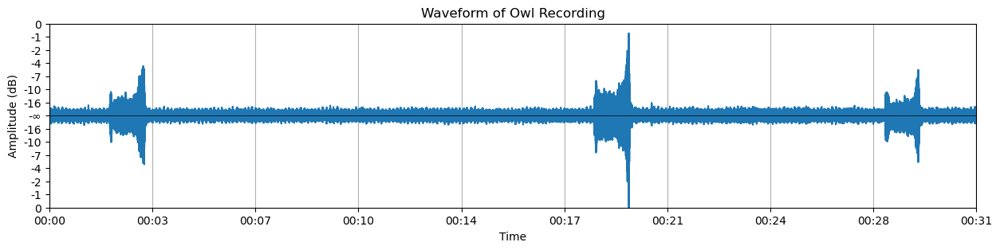

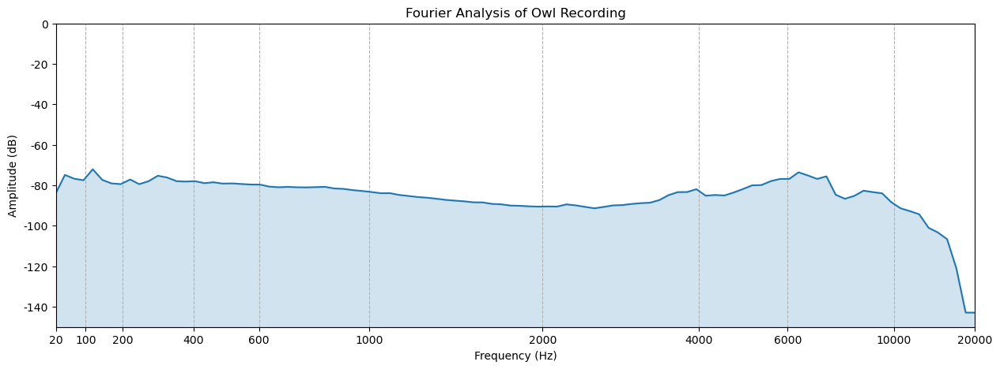

Predicted Species Group: Jays, Magpies, Crows, and Ravens


In [ ]:
row = df[df.species_group == 'Owls'].iloc[0] # Get an owl from the dataframe
row, sound = row_to_predictanble_row(row) # Convert the row to a predictanble row
plot_waveform(sound, title='Waveform of Owl Recording') # Plot the waveform of the owl
plot_fourier_analysis(sound, title='Fourier Analysis of Owl Recording') # Plot the Fourier analysis of the owl
prediction = nn.predict(pd.DataFrame([row])) # Predict the species group
print(f'Predicted Species Group: {prediction[0]}') # Print the predicted species group

This file was marked incorectly, even tho the more less successful model was able to accurately predict this file before.

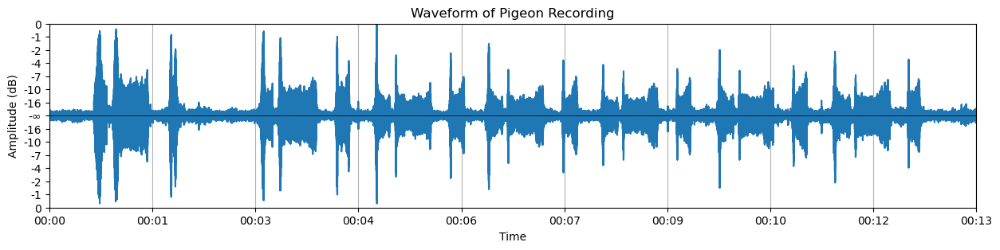

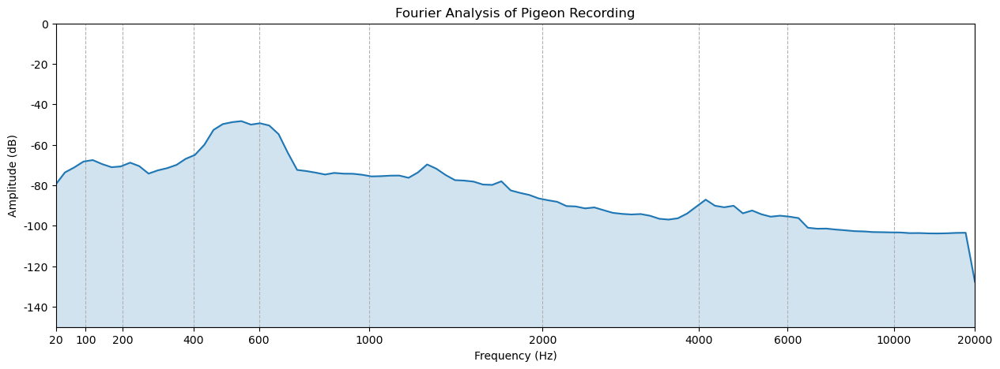

Predicted Species Group: Pigeons and Doves


In [ ]:
row = df[df.species_group == 'Pigeons and Doves'].iloc[0] # Get a pigeon from the dataframe
row, sound = row_to_predictanble_row(row) # Convert the row to a predictanble row
plot_waveform(sound, title='Waveform of Pigeon Recording') # Plot the waveform of the pigeon
plot_fourier_analysis(sound, title='Fourier Analysis of Pigeon Recording') # Plot the Fourier analysis of the pigeon
prediction = nn.predict(pd.DataFrame([row])) # Predict the species group
print(f'Predicted Species Group: {prediction[0]}') # Print the predicted species group

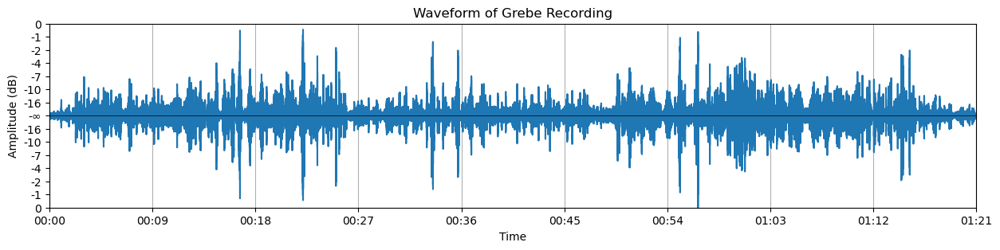

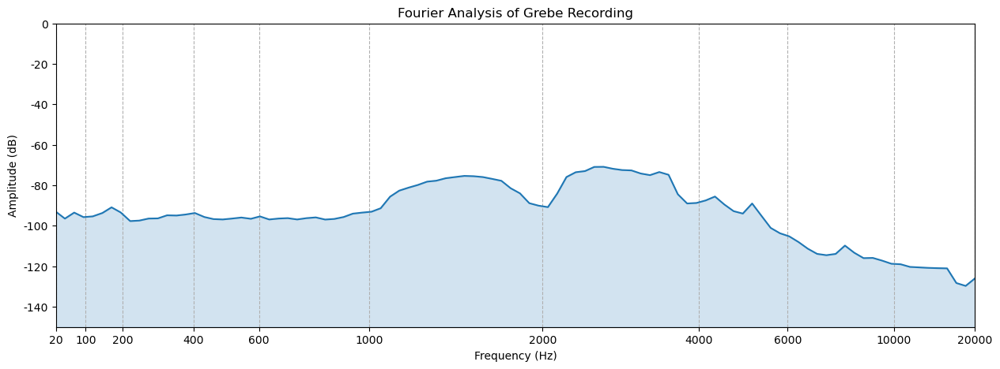

Predicted Species Group: Waterfowl


In [ ]:
row = df[df.species_group == 'Grebes'].iloc[0] # Get a grebe from the dataframe
row, sound = row_to_predictanble_row(row) # Convert the row to a predictanble row
plot_waveform(sound, title='Waveform of Grebe Recording') # Plot the waveform of the grebe
plot_fourier_analysis(sound, title='Fourier Analysis of Grebe Recording') # Plot the Fourier analysis of the grebe
prediction = nn.predict(pd.DataFrame([row])) # Predict the species group
print(f'Predicted Species Group: {prediction[0]}') # Print the predicted species group

# § V. Conclusion

## A. Summary of Approach and Results
This work has explored the domain of audio signal processing focusing on methods of breaking time signals into frequency signals, and means of noise reduction within those signals to improve the corelation between frequency informaiton of an audio signal and the species of bird that the recording was made of. Key approaches included utalizing the reversability of a Short Time Fourier Transformation (STFT) to change the frequency balance of an audio signal for noise reduction, and utalizing the properties of an Analytic Signal produced by a hilbert transformation to momentarily find an reduce the amplitude of transients and clicks within an audio signal. Additionally to engineer the input features for the final model, the results of Discrete Fourier Transformations were grouped into equally spaced bins based on the perceptual Bark scale, to be fed into machine learning models. The resulting models were compared with and without signal preprocessing and window normalization, and found remakably high success from proprocessing the audio files with some noise reduction, but there is worry that the act of windowing the signal made the models prone to overfitting against the noisefloor.

## B. Future Directions
There is indication that a Convolutional Neural Network (CNN) could be usalized with very similar aproaches using a the results of a normalized window of Short Time Fourier Transformations grouped in a 2 dimentional matrix rather than a 1 dimentional matrix of frequencies. The intention was to do this and the dataset was created during `§ III. A. Generation of Filtered Datasets`, can could be transfered for learning relatively easily, but this was deemed infesable in the period of time remaning when the dataset was being created. Additionally there is intered and research to be done reguarding the use of the Bark scale for frequency grouping. The decsion was made based on knowledge and experience from time as an audio engineer, but multiple datasets could be created with different scales to directly compare the models produced from different groupings. There are also many other types of ways to analys signals in the time frequency domain that are not directly with Short Time Fourier Transformations that could produce entirely different results or be calculable in a shorter period of time.